#### Forecasting Using FbProphet

In [1]:
import pandas as pd
from prophet import Prophet
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from matplotlib import style
from prophet.plot import plot, plot_components
import numpy as np # linear algebra
%matplotlib inline

**Load** **Confirmed** **dataset**

In [2]:
dfconfirmIndia=pd.read_csv('/content/IndiaALL.csv' )

dfconfirmBangladesh=pd.read_csv('/content/bangladeshAll.csv' )


dfconfirmJapan=pd.read_csv('/content/JapanAll.csv' )


dfconfirmFrance=pd.read_csv('/content/FranceAll.csv')

dfconfirmGermany=pd.read_csv('/content/GermanyAll.csv' )

dfconfirmItaly=pd.read_csv('/content/ItalyAll.csv' )


dfconfirmNewzeland=pd.read_csv('/content/NewZelandAll.csv' )


dfconfirmPakistan=pd.read_csv('/content/PakistanAll.csv')



**Load Death Dataset**

In [3]:
dfDeathIndia=pd.read_csv('/content/IndiaALL.csv' )

dfDeathBangladesh=pd.read_csv('/content/bangladeshAll.csv' )


dfDeathJapan=pd.read_csv('/content/JapanAll.csv' )


dfDeathFrance=pd.read_csv('/content/FranceAll.csv')

dfDeathGermany=pd.read_csv('/content/GermanyAll.csv' )

dfDeathItaly=pd.read_csv('/content/ItalyAll.csv' )


dfDeathNewzeland=pd.read_csv('/content/NewZelandAll.csv' )


dfDeathPakistan=pd.read_csv('/content/PakistanAll.csv')

In [4]:
def confirmForcast(df,str):
  df=df.drop(['C','D','Death'],axis=1)
  df.dropna(inplace= True)
  df.reset_index(drop=True, inplace=True)
 
  df.columns=['ds','y']
  
  df['ds'] = pd.to_datetime(df['ds'])
  df.drop(df.loc[df['ds']>'2022-10-31'].index, inplace = True)
  train=df[df['ds']<='2022-8-31']
  test=df[df['ds']>'2022-8-31']

  model = Prophet(daily_seasonality=False, weekly_seasonality=True, yearly_seasonality=False,seasonality_mode='multiplicative', changepoint_range=1, changepoint_prior_scale = 0.25)
  #model.add_seasonality(name='weekly', period=7, fourier_order=8, mode = 'multiplicative', prior_scale = 0.3) 

  model.fit(train)  
  forecasttest = model.predict(test)
  forecasttest[forecasttest['yhat'] < 0]['yhat'] = 0
  forecasttest['yhat_lower'] = forecasttest['yhat_lower'].round().astype('int')
  forecasttest['yhat'] = forecasttest['yhat'].round().astype('int')
  forecasttest['yhat_upper'] = forecasttest['yhat_upper'].round().astype('int')

  plot(model, forecasttest, figsize=(16, 9)) #, xlabel='Date', ylabel='Confirmed Cases'
  plt.title(str, size=20)
  plt.xlabel('Days', size=20)
  plt.ylabel('Number of Confirmed Cases', size=20)
  plt.legend(['Train Data', 'Forcast test Data'], prop={'size': 20})
  l=[]
  x=range(0,350000,50000)
  l=list(x)
  plt.xticks(size=20)
  plt.yticks(size=20)
  plt.grid(True,color='k')
  plt.show()

  f, ax = plt.subplots(1)
  f.set_figheight(9)
  f.set_figwidth(16)  
  plt.title(str, size=20)  
  ax.scatter(test['ds'], test['y'], color='r')
  #ax.figure.legend(['test'])
  fig = model.plot(forecasttest, ax=ax)
  ax.set_xlabel('Days', size=20)
  plt.ylabel('Number of Confirmed Cases', size=20)
  plt.legend(['Train Data', 'Forcast test Data','Test Data'], prop={'size': 20})
  plt.show()

  model = Prophet(daily_seasonality=False, weekly_seasonality=True, yearly_seasonality=False,seasonality_mode='multiplicative', changepoint_range=1, changepoint_prior_scale = 0.25)
  model.fit(df)
  future = model.make_future_dataframe(periods=20)
  forecast = model.predict(future)
  forecast[forecast['yhat'] < 0]['yhat'] = 0
  forecast['yhat_lower'] = forecast['yhat_lower'].round().astype('int')
  forecast['yhat'] = forecast['yhat'].round().astype('int')
  forecast['yhat_upper'] = forecast['yhat_upper'].round().astype('int')
  metric_df = forecast.set_index('ds')[['yhat']].join(df.set_index('ds').y).reset_index()             
  metric_df.dropna(inplace=True)
  c=r2_score(metric_df.y, metric_df.yhat)
  d=mean_squared_error(metric_df.y, metric_df.yhat)
  e=mean_absolute_error(metric_df.y, metric_df.yhat)
  r=np.sqrt(d)
  print('r2_score= ',c)
  print('mean_squared_error=',d)
  print('mean_absolute_error=',e)
  print('Root mean_squared_error=',r)


  #mae=mean_absolute_error(y_true=test['y'], y_pred=forecasttest['yhat'])
  #print("MAE1 : % f" %(mae))
  #print('MSE1:',mean_squared_error(y_true=test['y'], y_pred=forecasttest['yhat']))
  
  #rmse = np.sqrt(mean_squared_error(y_true=test['y'], y_pred=forecasttest['yhat']))
  #print("RMSE : % f" %(rmse))





  
  df.dropna(axis=0,inplace=True)
  style.use('fivethirtyeight')
  
  
  plot(model, forecast, figsize=(16, 9)) #, xlabel='Date', ylabel='Confirmed Cases'
  plt.title(str, size=20)
  plt.xlabel('Days', size=20)
  plt.ylabel('Number of Confirmed Cases', size=20)
  plt.legend(['Train Data', 'Forcasted Data'], prop={'size': 20})
  l=[]
  x=range(0,350000,50000)
  l=list(x)
  plt.xticks(size=20)
  plt.yticks(size=20)
  plt.grid(True,color='k')
  plt.show() 

  

  plot_components( model,forecast, figsize=(16, 9))
  #model.plot_components(forecast)
  forecast['yhat']=forecast['yhat'].abs().round().astype('int')

  return forecast
  
               


In [5]:
def confirmForcast_holidays(df,str,x,x1):
  df=df.drop(['C','D','Death'],axis=1)
  df.dropna(inplace= True)
  df.reset_index(drop=True, inplace=True)
 
  df.columns=['ds','y']
  
  df['ds'] = pd.to_datetime(df['ds'])
  df.drop(df.loc[df['ds']>'2022-10-31'].index, inplace = True)
  train=df[df['ds']<='2022-8-31']
  test=df[df['ds']>'2022-8-31']
  
  model = Prophet(daily_seasonality=False, weekly_seasonality=True, yearly_seasonality=False,seasonality_mode='multiplicative', changepoint_range=1, changepoint_prior_scale = 0.25)
  #model.add_seasonality(name='weekly', period=7, fourier_order=8, mode = 'multiplicative', prior_scale = 0.3) 
  model.add_country_holidays(country_name=x)
  model.fit(train)  
  forecasttest = model.predict(test)
  forecasttest[forecasttest['yhat'] < 0]['yhat'] = 0
  forecasttest['yhat_lower'] = forecasttest['yhat_lower'].round().astype('int')
  forecasttest['yhat'] = forecasttest['yhat'].round().astype('int')
  forecasttest['yhat_upper'] = forecasttest['yhat_upper'].round().astype('int')

  plot(model, forecasttest, figsize=(16, 9)) #, xlabel='Date', ylabel='Confirmed Cases'
  plt.title(str, size=20)
  plt.xlabel('Days', size=20)
  plt.ylabel('Number of Confirmed Cases', size=20)
  plt.legend(['Train Data', 'Forcast test Data'], prop={'size': 20})
  l=[]
  x=range(0,350000,50000)
  l=list(x)
  plt.xticks(size=20)
  plt.yticks(size=20)
  plt.grid(True,color='k')
  plt.show()

  f, ax = plt.subplots(1)
  f.set_figheight(9)
  f.set_figwidth(16)  
  plt.title(str, size=20)  
  ax.scatter(test['ds'], test['y'], color='r')
  #ax.figure.legend(['test'])
  fig = model.plot(forecasttest, ax=ax)
  ax.set_xlabel('Days', size=20)
  plt.ylabel('Number of Confirmed Cases', size=20)
  plt.legend(['Train Data', 'Forcast test Data','Test Data'], prop={'size': 20})
  plt.show()
  
  model1 = Prophet(daily_seasonality=False, weekly_seasonality=True, yearly_seasonality=False,seasonality_mode='multiplicative', changepoint_range=1, changepoint_prior_scale = 0.25)
  model1.add_country_holidays(country_name=x1)
  model1.fit(df)

  future = model1.make_future_dataframe(periods=20)
  forecast = model1.predict(future)
  forecast[forecast['yhat'] < 0]['yhat'] = 0
  forecast['yhat_lower'] = forecast['yhat_lower'].round().astype('int')
  forecast['yhat'] = forecast['yhat'].round().astype('int')
  forecast['yhat_upper'] = forecast['yhat_upper'].round().astype('int')
  metric_df = forecast.set_index('ds')[['yhat']].join(df.set_index('ds').y).reset_index()             
  metric_df.dropna(inplace=True)
  c=r2_score(metric_df.y, metric_df.yhat)
  d=mean_squared_error(metric_df.y, metric_df.yhat)
  e=mean_absolute_error(metric_df.y, metric_df.yhat)
  r=np.sqrt(d)
  print('r2_score= ',c)
  print('mean_squared_error=',d)
  print('mean_absolute_error=',e)
  print('Root mean_squared_error=',r)

  df.dropna(axis=0,inplace=True)
  style.use('fivethirtyeight')
  
  
  plot(model1, forecast, figsize=(16, 9)) #, xlabel='Date', ylabel='Confirmed Cases'
  plt.title(str, size=20)
  plt.xlabel('Days', size=20)
  plt.ylabel('Number of Confirmed Cases', size=20)
  plt.legend(['Train Data', 'Forcasted Data'], prop={'size': 20})
  l=[]
  x=range(0,350000,50000)
  l=list(x)
  plt.xticks(size=20)
  plt.yticks(size=20)
  plt.grid(True,color='k')
  plt.show() 
  plot_components( model1,forecast, figsize=(16, 9))
  #model.plot_components(forecast)
  forecast['yhat']=forecast['yhat'].abs().round().astype('int')
  return forecast
  
               


In [6]:
def DeathForcast(df,str):
  df=df.drop(['C','D','Confirmed'],axis=1)
  df.dropna(inplace= True)
  df.reset_index(drop=True, inplace=True)
 
  df.columns=['ds','y']
 
  df['ds'] = pd.to_datetime(df['ds'])
  df.drop(df.loc[df['ds']>'2022-10-31'].index, inplace = True)
  train=df[df['ds']<='2022-8-31']
  test=df[df['ds']>'2022-8-31']
  model = Prophet(daily_seasonality=False, weekly_seasonality=True, yearly_seasonality=False,seasonality_mode='multiplicative', changepoint_range=1, changepoint_prior_scale = 0.25)
  #model.add_seasonality(name='weekly', period=7, fourier_order=8, mode = 'multiplicative', prior_scale = 0.3) 
  model.fit(train)  
  forecasttest = model.predict(test)
  forecasttest[forecasttest['yhat'] < 0]['yhat'] = 0
  forecasttest['yhat_lower'] = forecasttest['yhat_lower'].round().astype('int')
  forecasttest['yhat'] = forecasttest['yhat'].round().astype('int')
  forecasttest['yhat_upper'] = forecasttest['yhat_upper'].round().astype('int')

  plot(model, forecasttest, figsize=(16, 9)) #, xlabel='Date', ylabel='Confirmed Cases'
  plt.title(str, size=20)
  plt.xlabel('Days', size=20)
  plt.ylabel('Number of Confirmed Cases', size=20)
  plt.legend(['Train Data', 'Forcast test Data'], prop={'size': 20})
  l=[]
  x=range(0,350000,50000)
  l=list(x)
  plt.xticks(size=20)
  plt.yticks(size=20)
  plt.grid(True,color='k')
  plt.show()

  
  
  model = Prophet(daily_seasonality=False, weekly_seasonality=True, yearly_seasonality=False,seasonality_mode='multiplicative', changepoint_range=1, changepoint_prior_scale = 0.25)
  
  model.fit(df)

  future = model.make_future_dataframe(periods=20)
  forecast = model.predict(future)
  forecast[forecast['yhat'] < 0]['yhat'] = 0
  forecast['yhat_lower'] = forecast['yhat_lower'].round().astype('int')
  forecast['yhat'] = forecast['yhat'].round().astype('int')
  forecast['yhat_upper'] = forecast['yhat_upper'].round().astype('int')
  metric_df = forecast.set_index('ds')[['yhat']].join(df.set_index('ds').y).reset_index()             
  metric_df.dropna(inplace=True)
  c=r2_score(metric_df.y, metric_df.yhat)
  d=mean_squared_error(metric_df.y, metric_df.yhat)
  e=mean_absolute_error(metric_df.y, metric_df.yhat)
  r=np.sqrt(d)
  print('r2_score= ',c)
  print('mean_squared_error=',d)
  print('mean_absolute_error=',e)
  print('Root mean_squared_error=',r)

  df.dropna(axis=0,inplace=True)

  style.use('fivethirtyeight')
  
  plt.figure(figsize=(18, 15))
  model.plot(forecast)
  plt.title(str, size=20)
  plt.xlabel('Days', size=20)
  plt.ylabel('Number of Confirmed Cases', size=20)
  plt.legend(['Train Data', 'Prophet Forecasted Data'], prop={'size': 20})
  l=[]
  x=range(0,350000,50000)
  l=list(x)
  plt.xticks(size=20)
  plt.yticks(size=20)
  plt.grid(True,color='k')
  plt.show() 
  model.plot_components(forecast)
  

  forecast['yhat']=forecast['yhat'].abs().round().astype('int')
  return forecast
  
               


In [7]:
def DeathForcast_holidays(df,str,x,x1):
  df=df.drop(['C','D','Confirmed'],axis=1)
  df.dropna(inplace= True)
  df.reset_index(drop=True, inplace=True)
 
  df.columns=['ds','y']
  
  df['ds'] = pd.to_datetime(df['ds'])
  df.drop(df.loc[df['ds']>'2022-10-31'].index, inplace = True)
  train=df[df['ds']<='2022-8-31']
  test=df[df['ds']>'2022-8-31']
  
  
  model = Prophet(daily_seasonality=False, weekly_seasonality=True, yearly_seasonality=False,seasonality_mode='multiplicative', changepoint_range=1, changepoint_prior_scale = 0.25)
  #model.add_seasonality(name='weekly', period=7, fourier_order=8, mode = 'multiplicative', prior_scale = 0.3) 
  model.add_country_holidays(country_name=x)
  model.fit(train)  
  forecasttest = model.predict(test)
  forecasttest[forecasttest['yhat'] < 0]['yhat'] = 0
  forecasttest['yhat_lower'] = forecasttest['yhat_lower'].round().astype('int')
  forecasttest['yhat'] = forecasttest['yhat'].round().astype('int')
  forecasttest['yhat_upper'] = forecasttest['yhat_upper'].round().astype('int')

  plot(model, forecasttest, figsize=(16, 9)) #, xlabel='Date', ylabel='Confirmed Cases'
  

  

  model = Prophet(daily_seasonality=False, weekly_seasonality=True, yearly_seasonality=False,seasonality_mode='multiplicative', changepoint_range=1, changepoint_prior_scale = 0.25)
  model.add_country_holidays(country_name=x1)
  model.fit(df)

  future = model.make_future_dataframe(periods=20)
  forecast = model.predict(future)
  forecast[forecast['yhat'] < 0]['yhat'] = 0
  forecast['yhat_lower'] = forecast['yhat_lower'].round().astype('int')
  forecast['yhat'] = forecast['yhat'].round().astype('int')
  forecast['yhat_upper'] = forecast['yhat_upper'].round().astype('int')
  metric_df = forecast.set_index('ds')[['yhat']].join(df.set_index('ds').y).reset_index()             
  metric_df.dropna(inplace=True)
  c=r2_score(metric_df.y, metric_df.yhat)
  d=mean_squared_error(metric_df.y, metric_df.yhat)
  e=mean_absolute_error(metric_df.y, metric_df.yhat)
  r=np.sqrt(d)
  print('r2_score= ',c)
  print('mean_squared_error=',d)
  print('mean_absolute_error=',e)
  print('Root mean_squared_error=',r)

  df.dropna(axis=0,inplace=True)
  style.use('fivethirtyeight')
  
  
  plot(model, forecast, figsize=(16, 9)) #, xlabel='Date', ylabel='Confirmed Cases'
  plt.title(str, size=20)
  plt.xlabel('Days', size=20)
  plt.ylabel('Number of Confirmed Cases', size=20)
  plt.legend(['Train Data', 'Prophet Forcasted Data'], prop={'size': 20})
  l=[]
  x=range(0,350000,50000)
  l=list(x)
  plt.xticks(size=20)
  plt.yticks(size=20)
  plt.grid(True,color='k')
  plt.show() 
  plot_components( model,forecast, figsize=(16, 9))
  #model.plot_components(forecast)
  forecast['yhat']=forecast['yhat'].abs().round().astype('int')
  return forecast
  
               


**India**

DEBUG:cmdstanpy:input tempfile: /tmp/tmpox279url/zsi20baa.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpox279url/iwnlocc6.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=6130', 'data', 'file=/tmp/tmpox279url/zsi20baa.json', 'init=/tmp/tmpox279url/iwnlocc6.json', 'output', 'file=/tmp/tmpox279url/prophet_modelo01ct6t9/prophet_model-20221202054546.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
05:45:46 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
05:45:46 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
<ipython-input-4-6aa2debc1544>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.

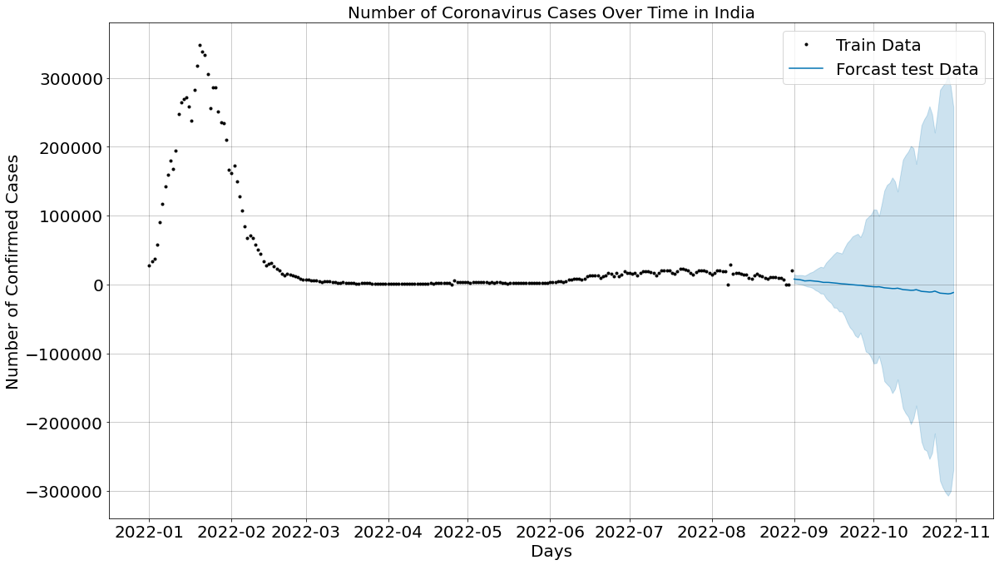

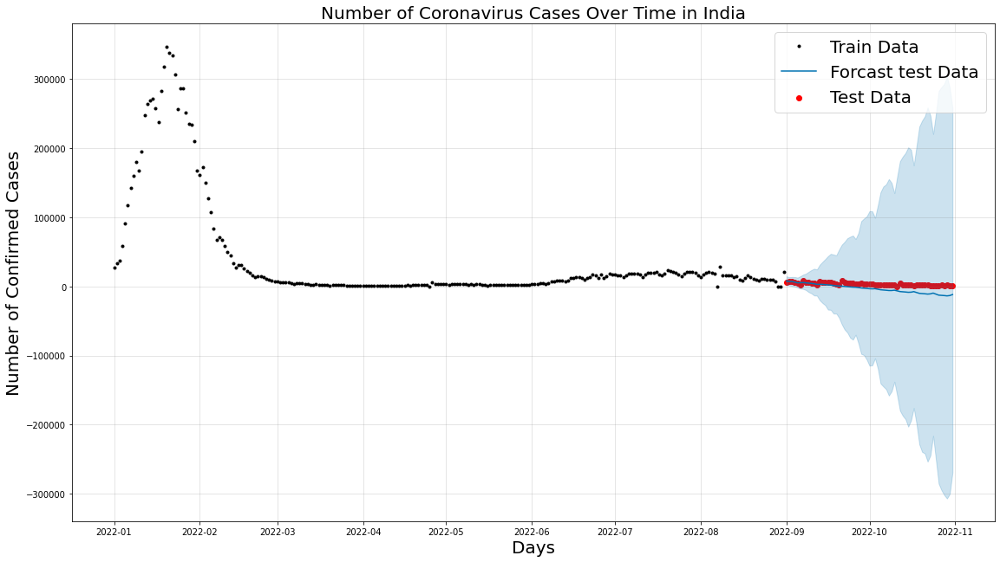

DEBUG:cmdstanpy:input tempfile: /tmp/tmpox279url/3tecw7r8.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpox279url/_2xkkqgo.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=53938', 'data', 'file=/tmp/tmpox279url/3tecw7r8.json', 'init=/tmp/tmpox279url/_2xkkqgo.json', 'output', 'file=/tmp/tmpox279url/prophet_modelnixv8ufk/prophet_model-20221202054548.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
05:45:48 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
05:45:48 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
<ipython-input-4-6aa2debc1544>:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata

r2_score=  0.9938022919658431
mean_squared_error= 30925175.54605263
mean_absolute_error= 2323.782894736842
Root mean_squared_error= 5561.040868942849


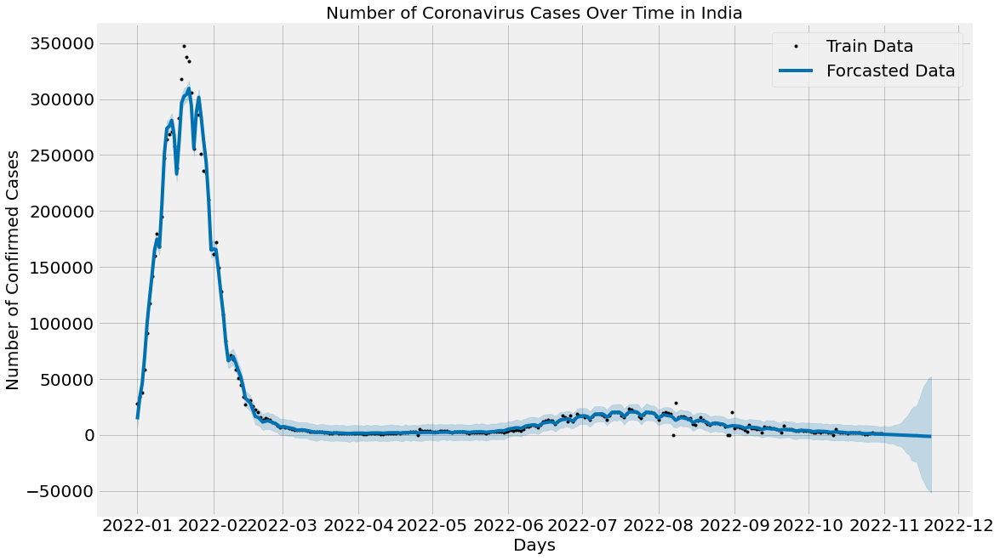

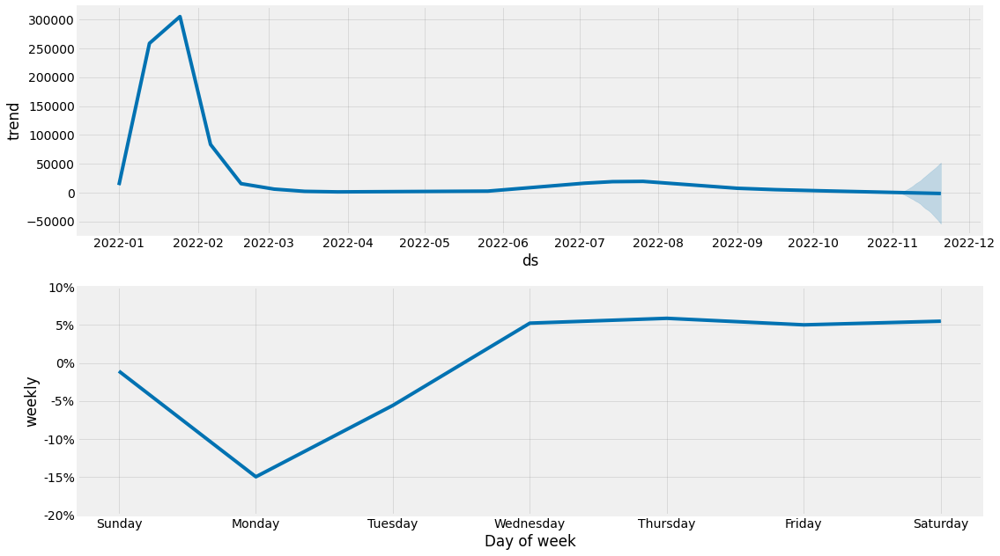

In [8]:
forecastedIndia=confirmForcast(dfconfirmIndia,'Number of Coronavirus Cases Over Time in India')

/usr/local/lib/python3.8/dist-packages/prophet/hdays.py:209: Warning: We only support Diwali and Holi holidays from 2010 to 2030
  warnings.warn(warning_msg, Warning)
DEBUG:cmdstanpy:input tempfile: /tmp/tmpox279url/1ezxcwdd.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpox279url/7vnmqben.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=62885', 'data', 'file=/tmp/tmpox279url/1ezxcwdd.json', 'init=/tmp/tmpox279url/7vnmqben.json', 'output', 'file=/tmp/tmpox279url/prophet_model3mykb65p/prophet_model-20221202054550.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
05:45:50 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
05:45:50 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
/usr/local/lib/python3.8/dist-packages/prophet/hdays.py:209: Warning: We onl

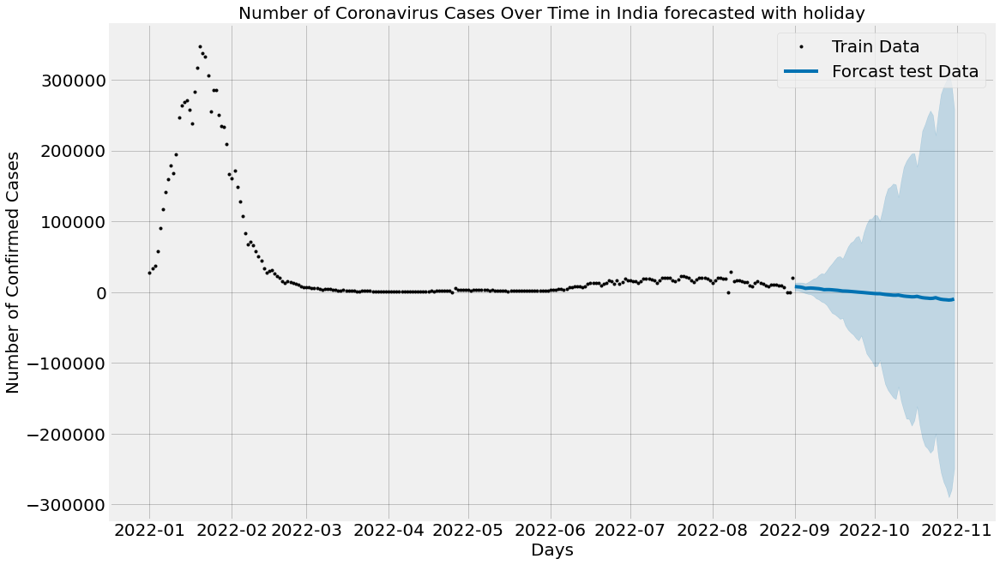

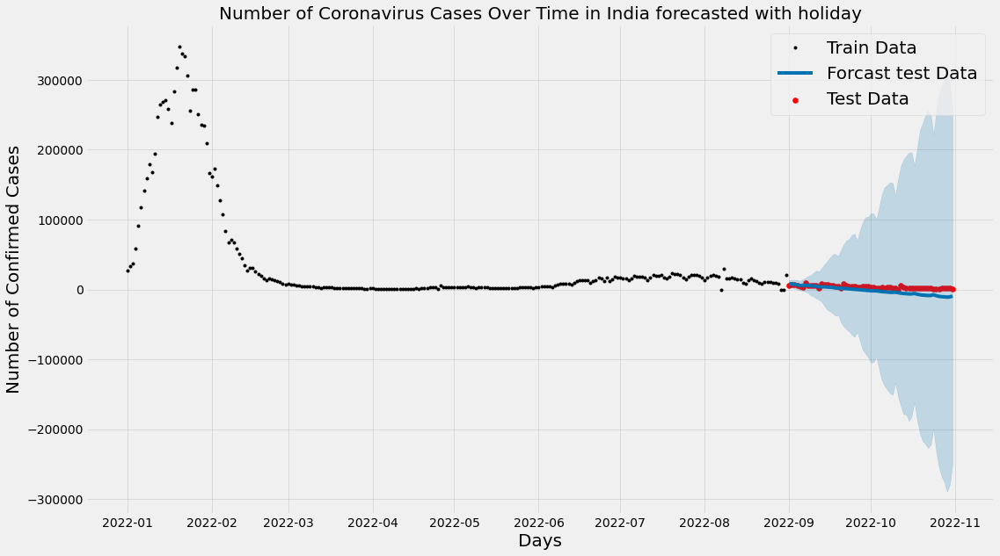

/usr/local/lib/python3.8/dist-packages/prophet/hdays.py:209: Warning: We only support Diwali and Holi holidays from 2010 to 2030
  warnings.warn(warning_msg, Warning)
DEBUG:cmdstanpy:input tempfile: /tmp/tmpox279url/gq5aax_f.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpox279url/pc0xae5g.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=96210', 'data', 'file=/tmp/tmpox279url/gq5aax_f.json', 'init=/tmp/tmpox279url/pc0xae5g.json', 'output', 'file=/tmp/tmpox279url/prophet_modelwo0knj2r/prophet_model-20221202054551.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
05:45:51 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
05:45:52 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
/usr/local/lib/python3.8/dist-packages/prophet/hdays.py:209: Warning: We onl

r2_score=  0.9946770012379125
mean_squared_error= 26560572.10855263
mean_absolute_error= 2106.154605263158
Root mean_squared_error= 5153.69499568539


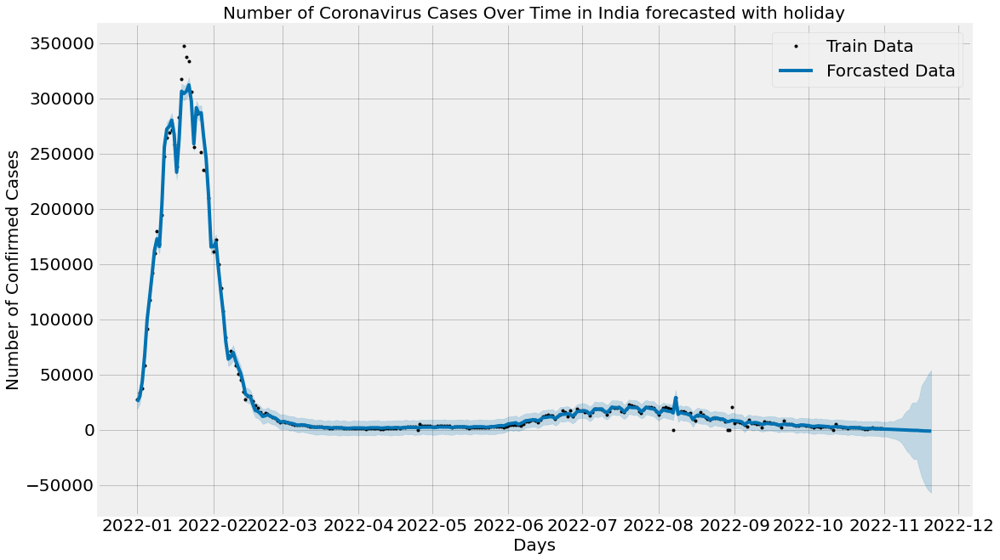

/usr/local/lib/python3.8/dist-packages/prophet/hdays.py:209: Warning: We only support Diwali and Holi holidays from 2010 to 2030
  warnings.warn(warning_msg, Warning)


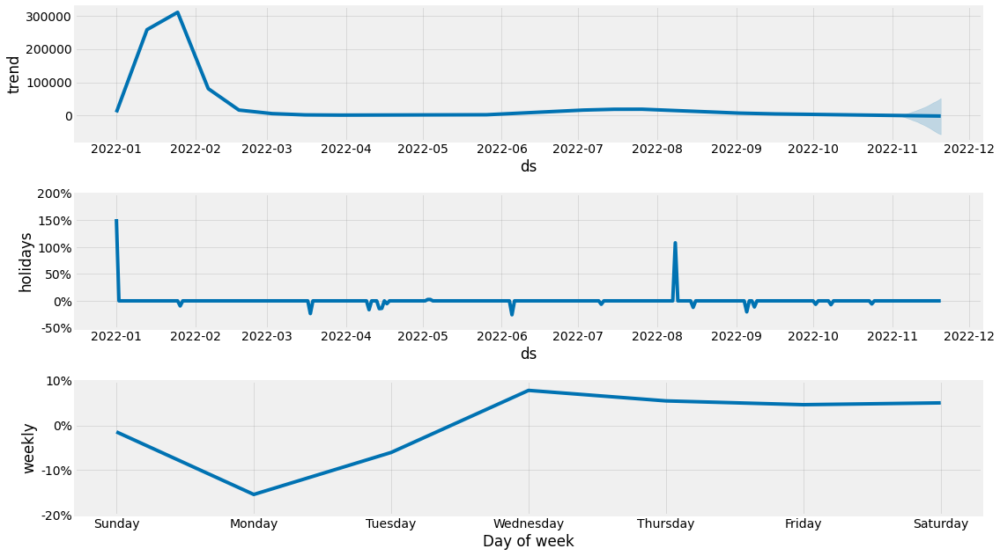

In [9]:
forecastedIndia_holiday=confirmForcast_holidays(dfconfirmIndia,'Number of Coronavirus Cases Over Time in India forecasted with holiday','India','India')

In [10]:
f=forecastedIndia[304:]
f =f [['ds','yhat', 'yhat_lower',  'yhat_upper']]

f.rename(columns = {'ds':'Date','yhat':'Confirm', 'yhat_lower':'Confirm_Lower', 'yhat_upper':'Confirm_Upper'}, inplace = True)
f

,Date,Confirm,Confirm_Lower,Confirm_Upper
304,2022-11-01,467,-6540,7911
305,2022-11-02,416,-7051,7440
306,2022-11-03,314,-7953,7317
307,2022-11-04,208,-7559,7955
308,2022-11-05,104,-8198,9006
309,2022-11-06,0,-9621,9422
310,2022-11-07,84,-9795,9947
311,2022-11-08,187,-11039,11428
312,2022-11-09,312,-13589,14417
313,2022-11-10,419,-16375,16390


In [11]:
f=forecastedIndia_holiday[304:]
f =f [['ds','yhat', 'yhat_lower',  'yhat_upper']]

f.rename(columns = {'ds':'Date','yhat':'Confirm', 'yhat_lower':'Confirm_Lower', 'yhat_upper':'Confirm_Upper'}, inplace = True)
f

,Date,Confirm,Confirm_Lower,Confirm_Upper
304,2022-11-01,504,-5981,7146
305,2022-11-02,472,-6521,7021
306,2022-11-03,358,-7062,7923
307,2022-11-04,252,-7823,7492
308,2022-11-05,149,-8123,7948
309,2022-11-06,43,-9024,9204
310,2022-11-07,47,-10073,10003
311,2022-11-08,144,-12235,10678
312,2022-11-09,272,-15569,14431
313,2022-11-10,370,-19291,17012


**Bangladesh**

DEBUG:cmdstanpy:input tempfile: /tmp/tmpox279url/nxr3ccy4.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpox279url/lde1axpk.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=18700', 'data', 'file=/tmp/tmpox279url/nxr3ccy4.json', 'init=/tmp/tmpox279url/lde1axpk.json', 'output', 'file=/tmp/tmpox279url/prophet_modelgfp45oyz/prophet_model-20221202054554.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
05:45:54 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
05:45:54 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
<ipython-input-4-6aa2debc1544>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata

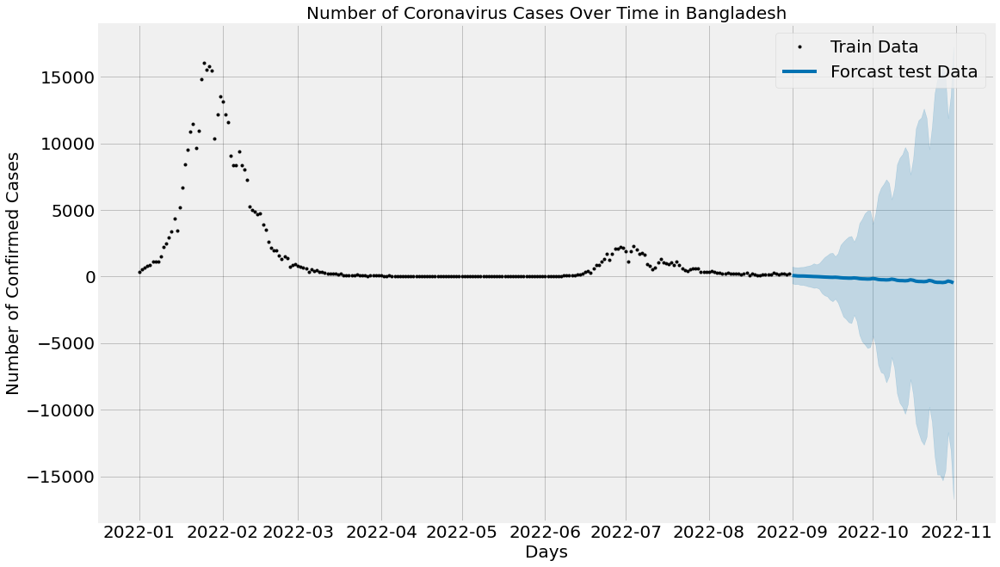

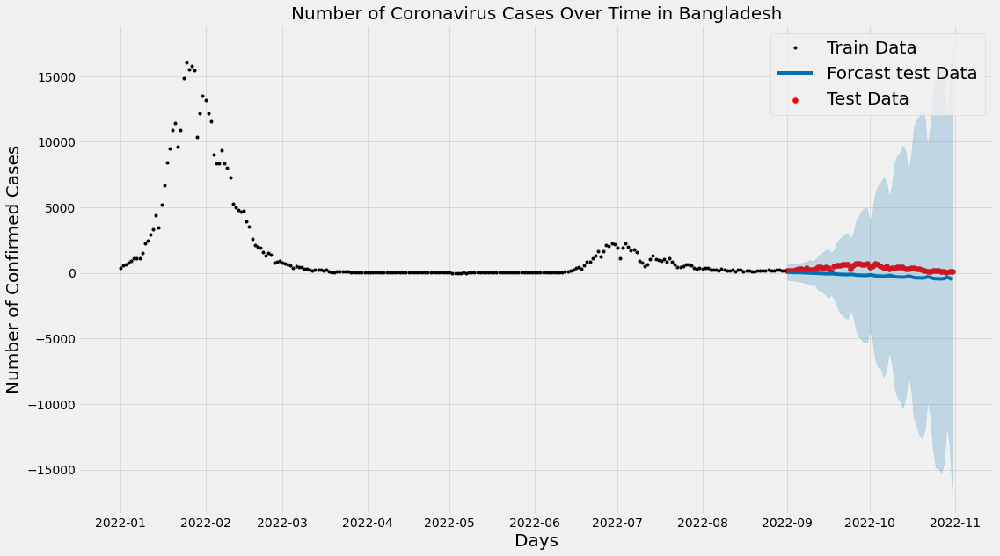

DEBUG:cmdstanpy:input tempfile: /tmp/tmpox279url/_n1_4qow.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpox279url/dcigfyxc.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=54979', 'data', 'file=/tmp/tmpox279url/_n1_4qow.json', 'init=/tmp/tmpox279url/dcigfyxc.json', 'output', 'file=/tmp/tmpox279url/prophet_modeloggoszaj/prophet_model-20221202054555.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
05:45:55 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
05:45:55 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
<ipython-input-4-6aa2debc1544>:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata

r2_score=  0.9948122825163689
mean_squared_error= 50550.52631578947
mean_absolute_error= 117.05263157894737
Root mean_squared_error= 224.83444201409506


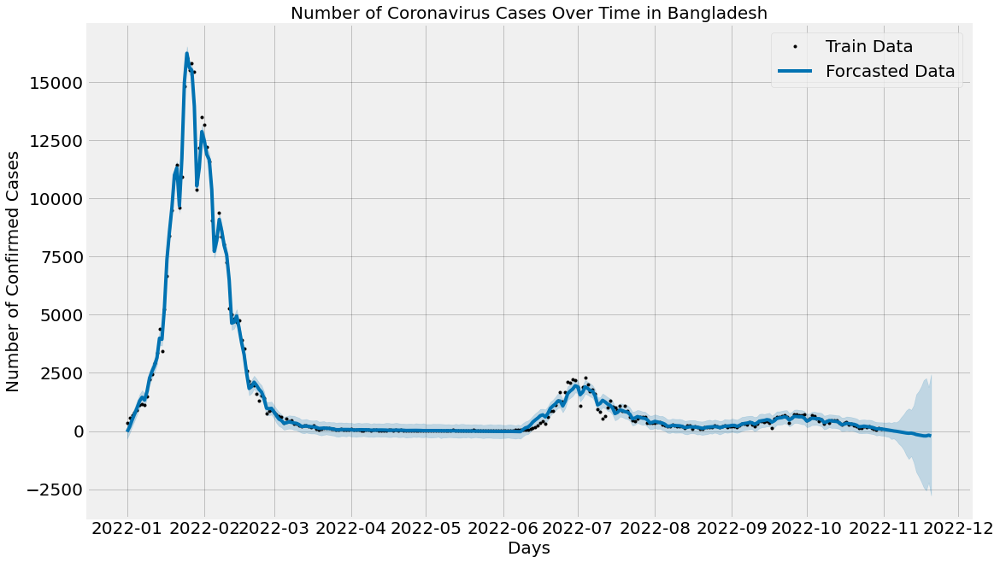

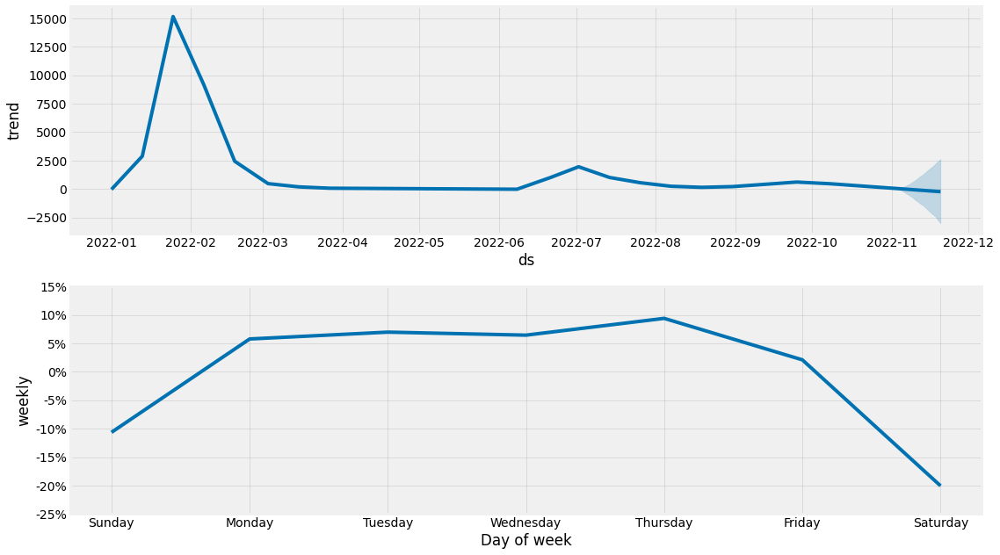

In [12]:
forecastedBanglasesh=confirmForcast(dfconfirmBangladesh,'Number of Coronavirus Cases Over Time in Bangladesh')

DEBUG:cmdstanpy:input tempfile: /tmp/tmpox279url/8vybpx10.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpox279url/fah_b3o5.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=89451', 'data', 'file=/tmp/tmpox279url/8vybpx10.json', 'init=/tmp/tmpox279url/fah_b3o5.json', 'output', 'file=/tmp/tmpox279url/prophet_modelmpdpleuk/prophet_model-20221202054557.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
05:45:57 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
05:45:57 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
<ipython-input-5-3d6ee0e4bd72>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata

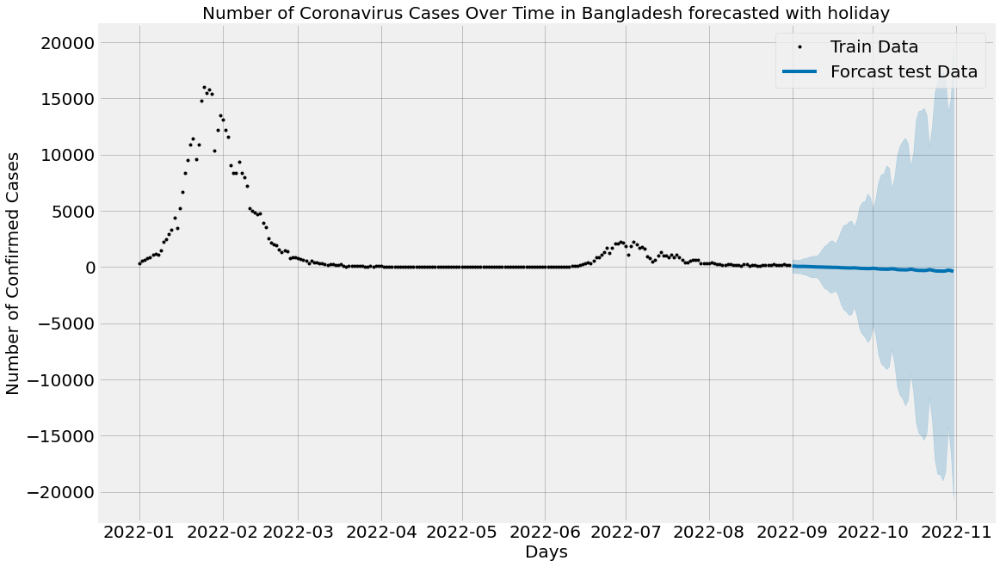

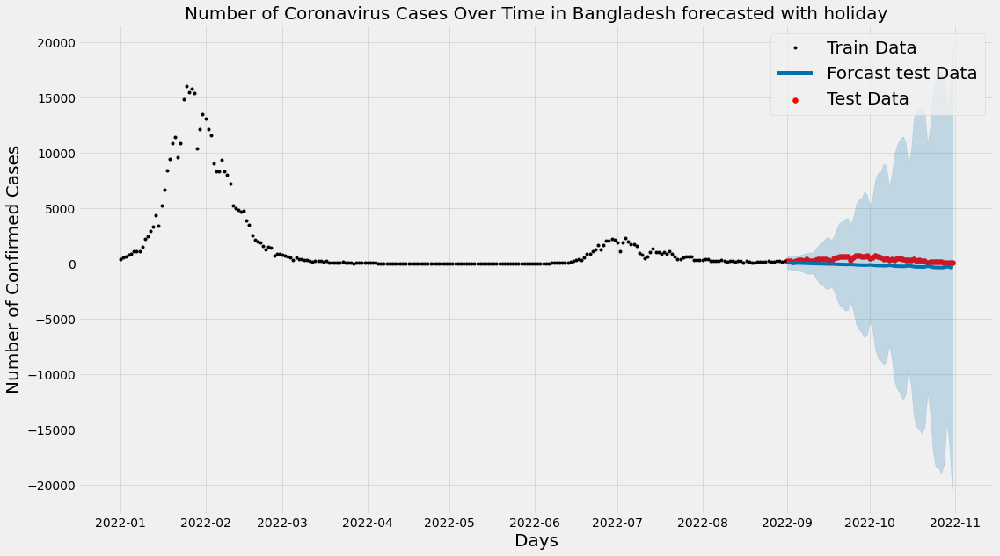

DEBUG:cmdstanpy:input tempfile: /tmp/tmpox279url/6u_5lg9x.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpox279url/t700pemv.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=46338', 'data', 'file=/tmp/tmpox279url/6u_5lg9x.json', 'init=/tmp/tmpox279url/t700pemv.json', 'output', 'file=/tmp/tmpox279url/prophet_modelc6ihvwha/prophet_model-20221202054559.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
05:45:59 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
05:45:59 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
<ipython-input-5-3d6ee0e4bd72>:54: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata

r2_score=  0.9948183630121284
mean_squared_error= 50491.27631578947
mean_absolute_error= 116.71052631578948
Root mean_squared_error= 224.70263976150676


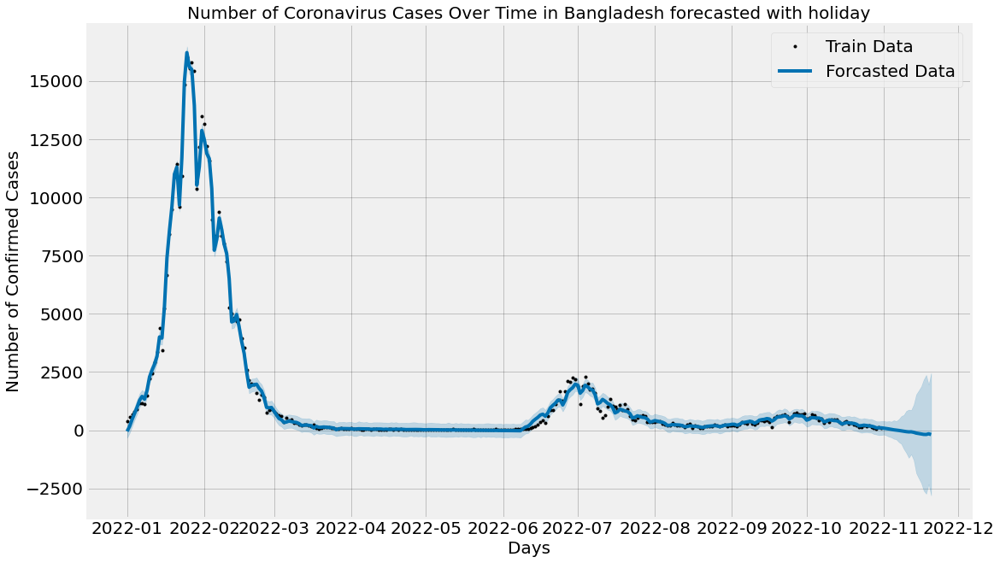

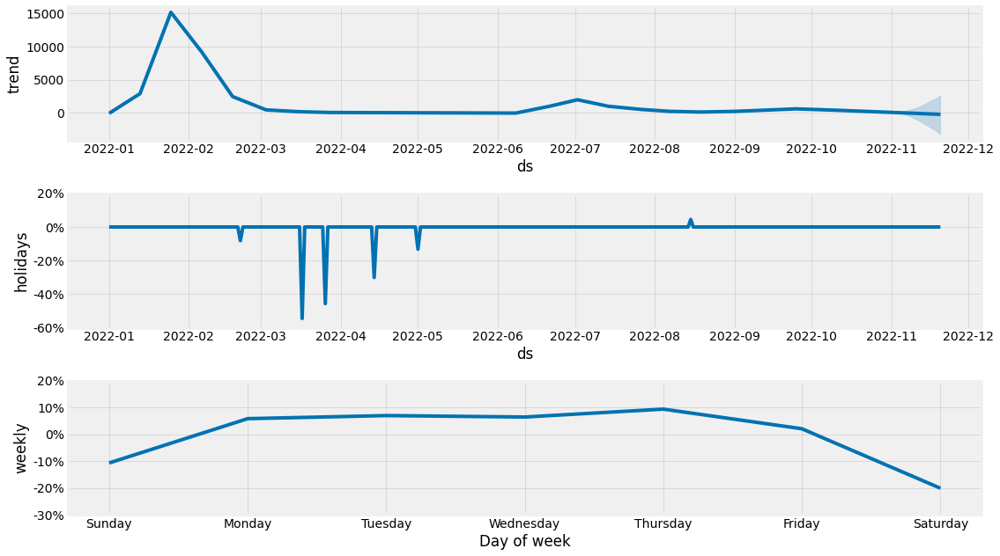

In [13]:
forecastedBanglasesh_holiday=confirmForcast_holidays(dfconfirmBangladesh,'Number of Coronavirus Cases Over Time in Bangladesh forecasted with holiday','BD','BD')

In [14]:
f=forecastedBanglasesh[304:]
f =f [['ds','yhat', 'yhat_lower',  'yhat_upper']]

f.rename(columns = {'ds':'Date','yhat':'Confirm', 'yhat_lower':'Confirm_Lower', 'yhat_upper':'Confirm_Upper'}, inplace = True)
f

,Date,Confirm,Confirm_Lower,Confirm_Upper
304,2022-11-01,77,-202,369
305,2022-11-02,59,-236,368
306,2022-11-03,43,-254,380
307,2022-11-04,23,-339,352
308,2022-11-05,5,-317,393
309,2022-11-06,8,-406,377
310,2022-11-07,27,-545,452
311,2022-11-08,45,-648,601
312,2022-11-09,62,-804,727
313,2022-11-10,81,-1034,886


In [15]:
f=forecastedBanglasesh_holiday[304:]
f =f [['ds','yhat', 'yhat_lower',  'yhat_upper']]

f.rename(columns = {'ds':'Date','yhat':'Confirm', 'yhat_lower':'Confirm_Lower', 'yhat_upper':'Confirm_Upper'}, inplace = True)
f

,Date,Confirm,Confirm_Lower,Confirm_Upper
304,2022-11-01,87,-185,394
305,2022-11-02,70,-229,372
306,2022-11-03,55,-277,388
307,2022-11-04,36,-309,368
308,2022-11-05,16,-369,425
309,2022-11-06,4,-397,390
310,2022-11-07,11,-508,471
311,2022-11-08,28,-588,602
312,2022-11-09,44,-804,654
313,2022-11-10,62,-973,827


**Japan**

DEBUG:cmdstanpy:input tempfile: /tmp/tmpox279url/u5vabzkp.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpox279url/qlsqnctp.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=78814', 'data', 'file=/tmp/tmpox279url/u5vabzkp.json', 'init=/tmp/tmpox279url/qlsqnctp.json', 'output', 'file=/tmp/tmpox279url/prophet_modelb2f5ft24/prophet_model-20221202054601.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
05:46:01 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
05:46:01 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
<ipython-input-4-6aa2debc1544>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata

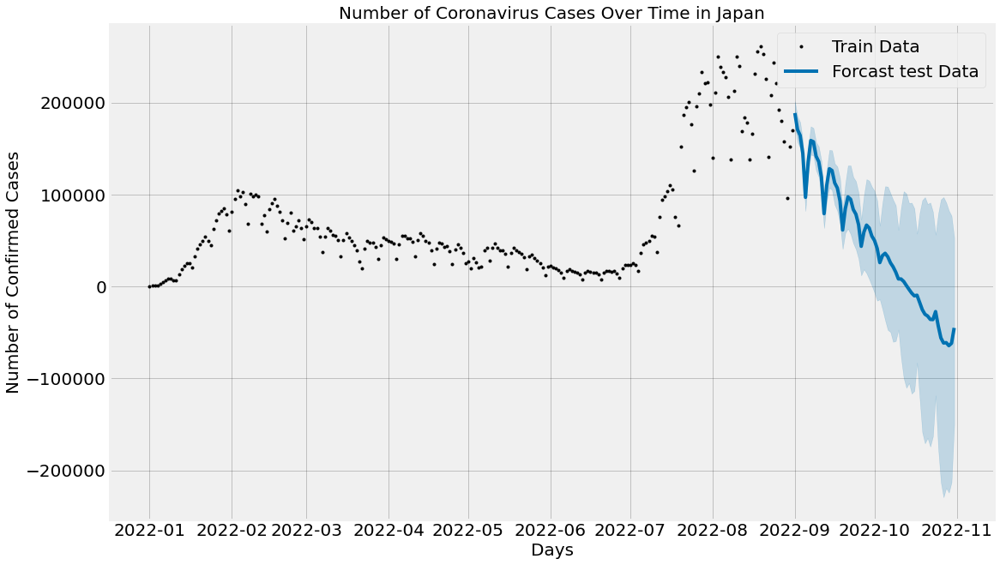

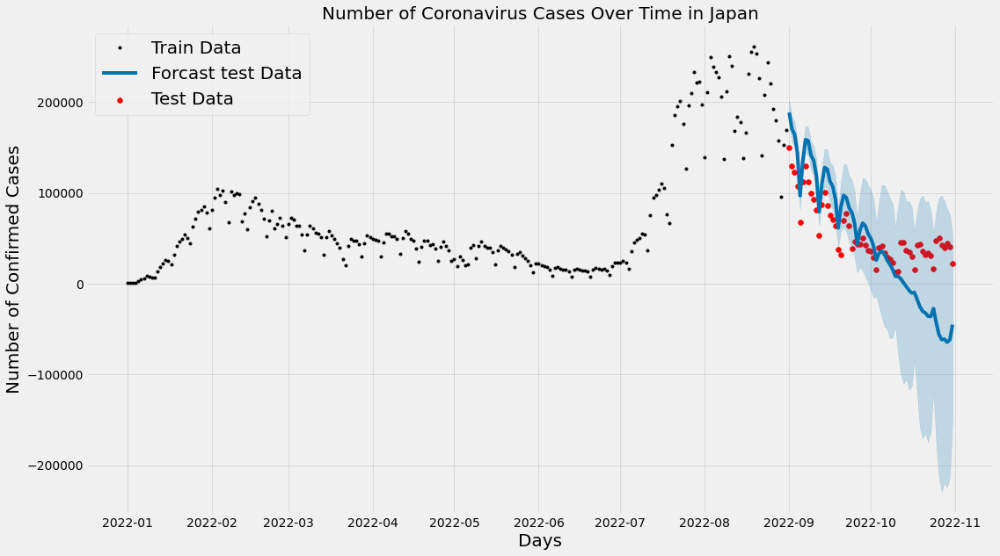

DEBUG:cmdstanpy:input tempfile: /tmp/tmpox279url/c5_vg8sk.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpox279url/n988ga93.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=49297', 'data', 'file=/tmp/tmpox279url/c5_vg8sk.json', 'init=/tmp/tmpox279url/n988ga93.json', 'output', 'file=/tmp/tmpox279url/prophet_modelwiynp77m/prophet_model-20221202054602.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
05:46:02 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
05:46:03 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
<ipython-input-4-6aa2debc1544>:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata

r2_score=  0.9697027722206673
mean_squared_error= 111227885.67105263
mean_absolute_error= 6846.901315789473
Root mean_squared_error= 10546.46318303215


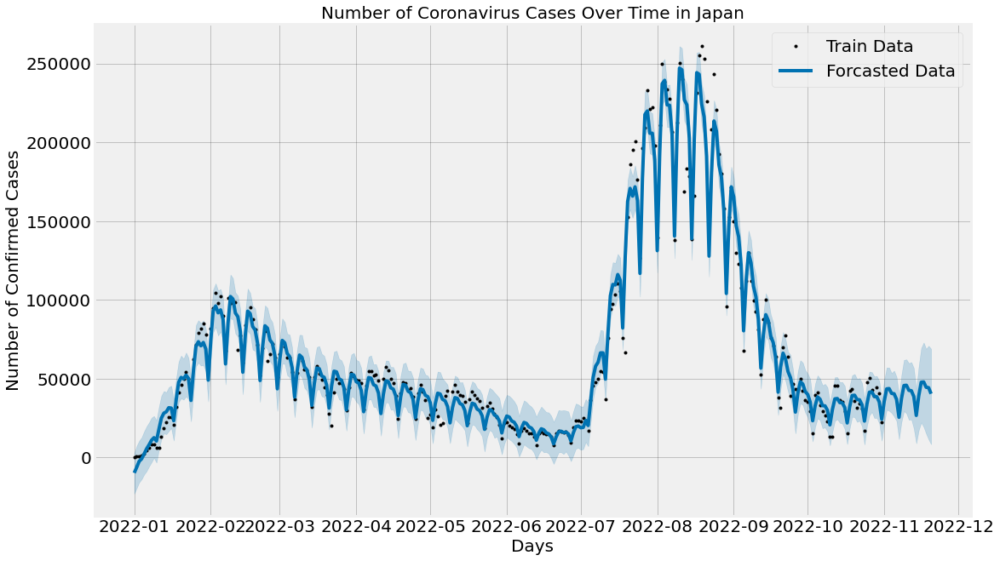

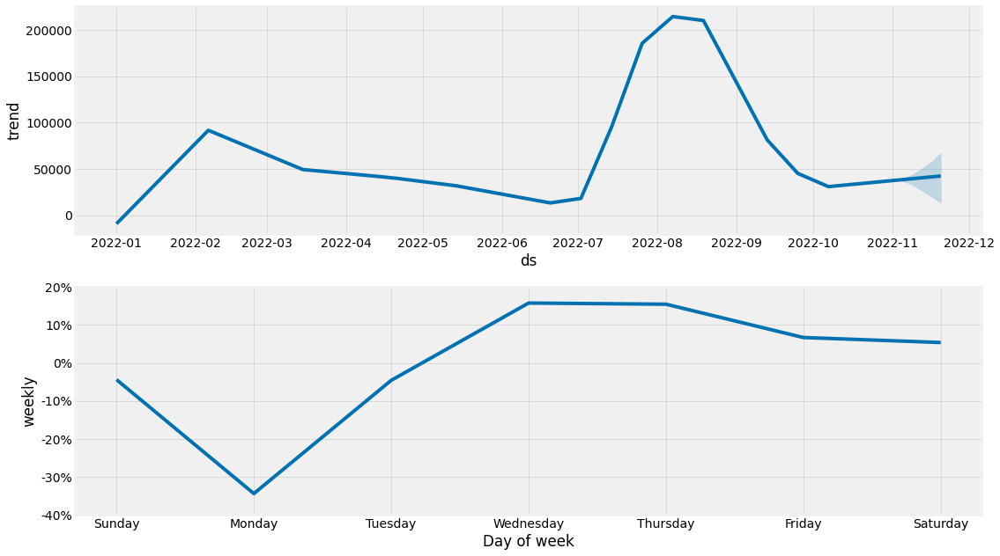

In [16]:
forecastedJapan=confirmForcast(dfconfirmJapan,'Number of Coronavirus Cases Over Time in Japan')

DEBUG:cmdstanpy:input tempfile: /tmp/tmpox279url/67q_0ric.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpox279url/y31s8skh.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=42244', 'data', 'file=/tmp/tmpox279url/67q_0ric.json', 'init=/tmp/tmpox279url/y31s8skh.json', 'output', 'file=/tmp/tmpox279url/prophet_modelwaejkuyh/prophet_model-20221202054604.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
05:46:04 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
05:46:04 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
<ipython-input-5-3d6ee0e4bd72>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata

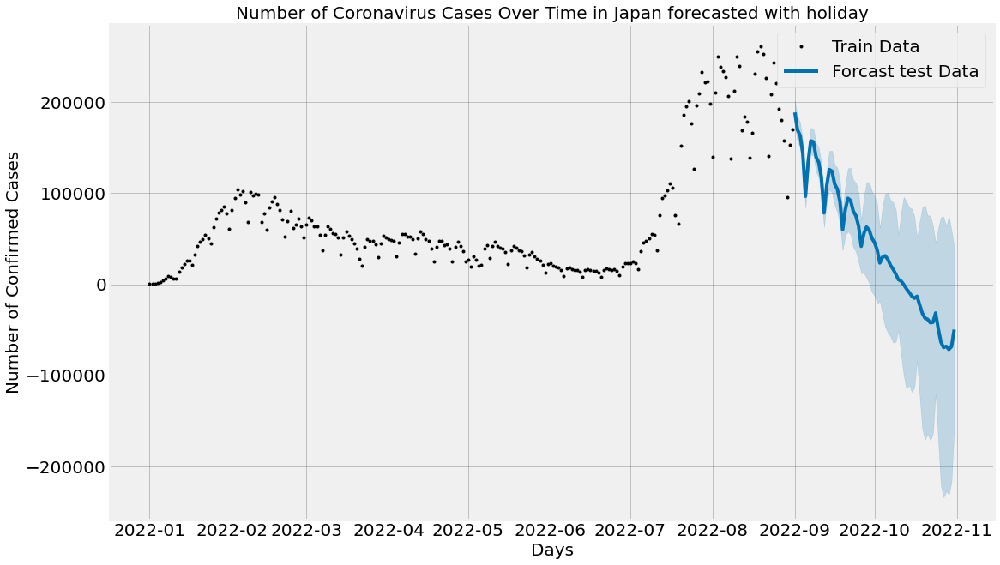

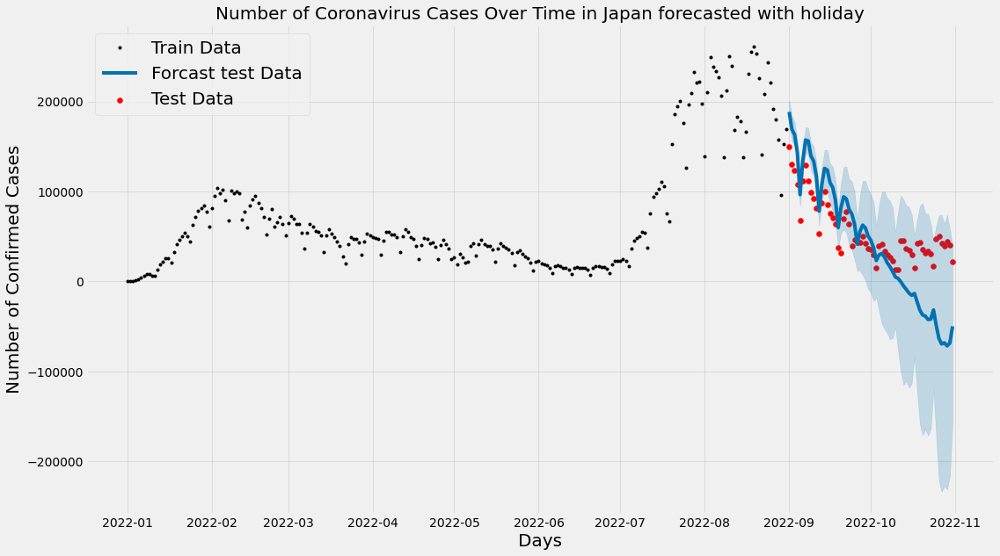

DEBUG:cmdstanpy:input tempfile: /tmp/tmpox279url/kbk7j0kc.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpox279url/ku7zbrnx.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=72220', 'data', 'file=/tmp/tmpox279url/kbk7j0kc.json', 'init=/tmp/tmpox279url/ku7zbrnx.json', 'output', 'file=/tmp/tmpox279url/prophet_modelcwxw43js/prophet_model-20221202054606.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
05:46:06 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
05:46:06 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
<ipython-input-5-3d6ee0e4bd72>:54: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata

r2_score=  0.9707233512104222
mean_squared_error= 107481112.4013158
mean_absolute_error= 6413.960526315789
Root mean_squared_error= 10367.30979576263


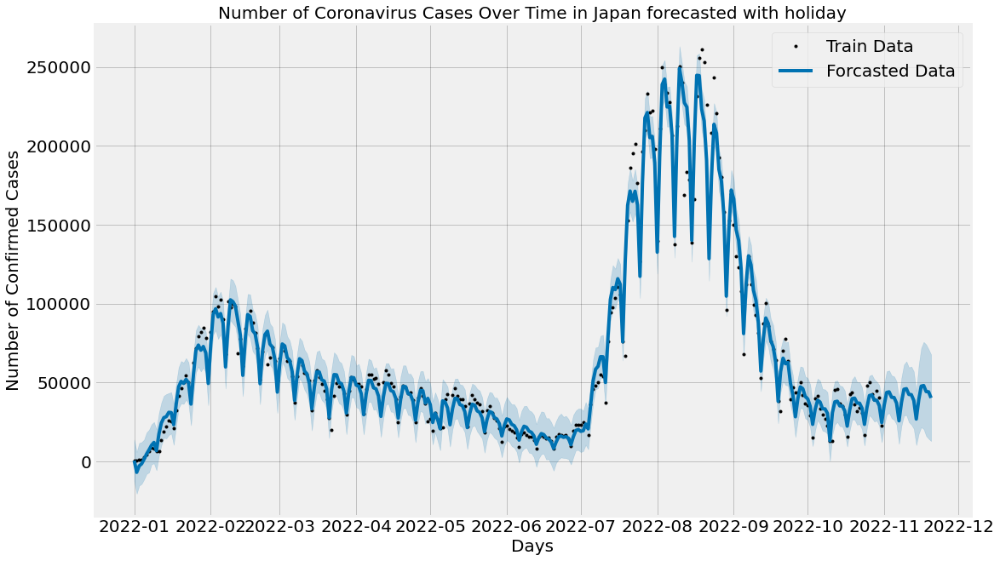

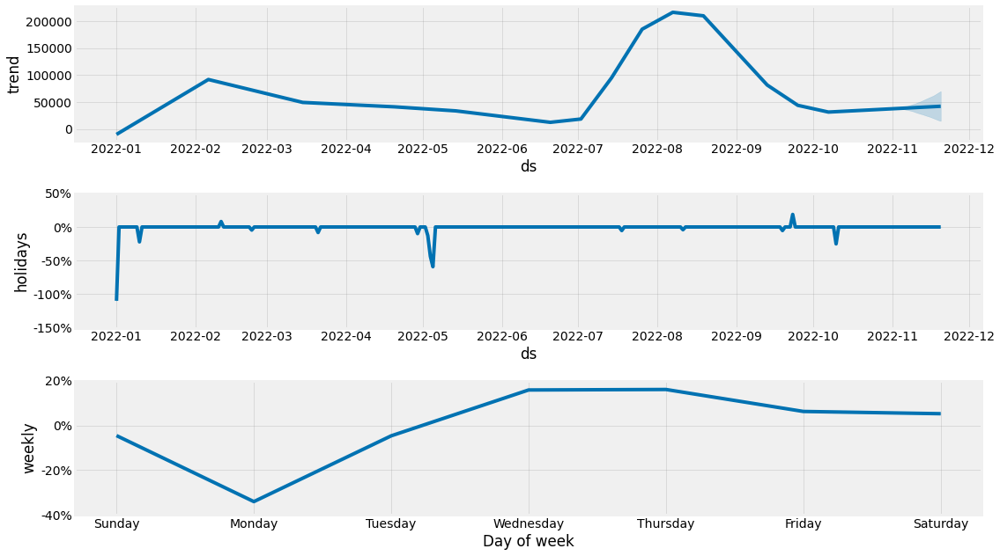

In [17]:
forecastedJapan_holiday=confirmForcast_holidays(dfconfirmJapan,'Number of Coronavirus Cases Over Time in Japan forecasted with holiday','Japan','Japan')

In [18]:
f=forecastedJapan[304:]
f =f [['ds','yhat', 'yhat_lower',  'yhat_upper']]

f.rename(columns = {'ds':'Date','yhat':'Confirm', 'yhat_lower':'Confirm_Lower', 'yhat_upper':'Confirm_Upper'}, inplace = True)
f

,Date,Confirm,Confirm_Lower,Confirm_Upper
304,2022-11-01,35676,22100,49051
305,2022-11-02,43582,30257,57166
306,2022-11-03,43769,29679,57078
307,2022-11-04,40724,28335,53554
308,2022-11-05,40497,26163,55098
309,2022-11-06,36991,23222,51285
310,2022-11-07,25556,11613,39300
311,2022-11-08,37417,22536,52397
312,2022-11-09,45693,29477,61959
313,2022-11-10,45875,28076,62294


In [19]:
f=forecastedJapan_holiday[304:]
f =f [['ds','yhat', 'yhat_lower',  'yhat_upper']]

f.rename(columns = {'ds':'Date','yhat':'Confirm', 'yhat_lower':'Confirm_Lower', 'yhat_upper':'Confirm_Upper'}, inplace = True)
f

,Date,Confirm,Confirm_Lower,Confirm_Upper
304,2022-11-01,35700,22873,48729
305,2022-11-02,43653,29595,57038
306,2022-11-03,44017,30666,57552
307,2022-11-04,40555,27262,54362
308,2022-11-05,40428,26260,53810
309,2022-11-06,36903,23334,50673
310,2022-11-07,25662,10955,39171
311,2022-11-08,37331,22470,52957
312,2022-11-09,45634,28938,61254
313,2022-11-10,46003,29285,63288


**Fance**

DEBUG:cmdstanpy:input tempfile: /tmp/tmpox279url/832z7q49.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpox279url/8d5emq70.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=793', 'data', 'file=/tmp/tmpox279url/832z7q49.json', 'init=/tmp/tmpox279url/8d5emq70.json', 'output', 'file=/tmp/tmpox279url/prophet_modelg2r_daqu/prophet_model-20221202054608.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
05:46:08 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
05:46:08 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
<ipython-input-4-6aa2debc1544>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.o

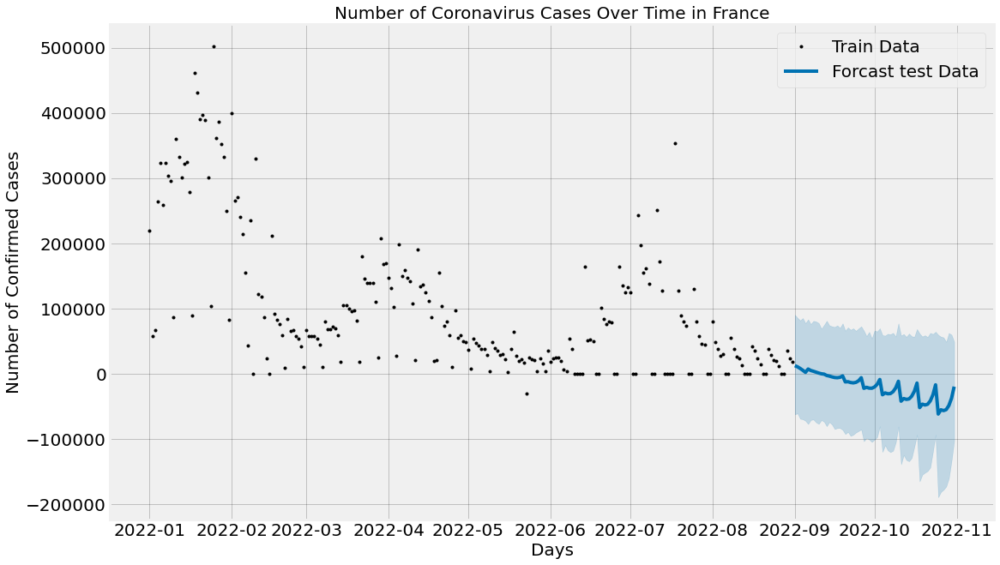

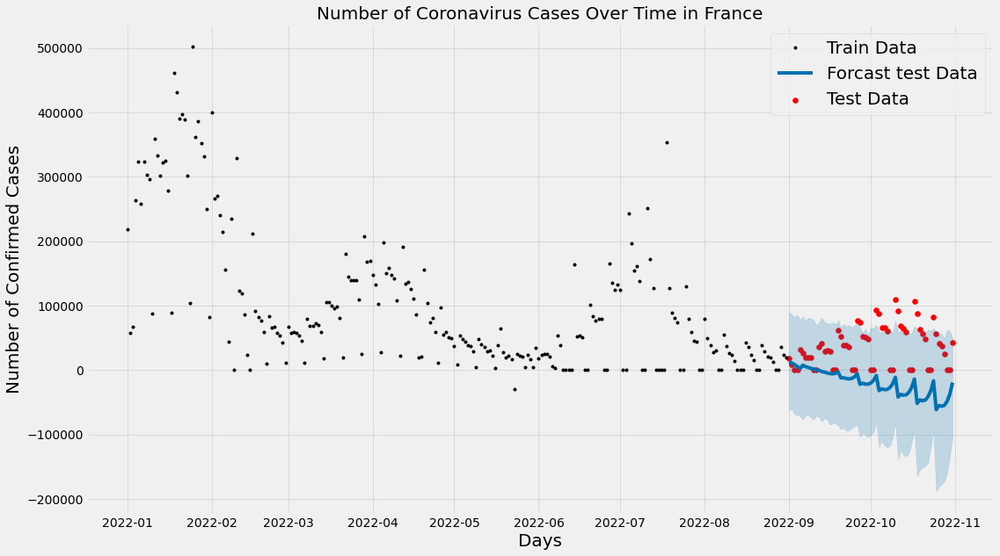

DEBUG:cmdstanpy:input tempfile: /tmp/tmpox279url/nmp4wgau.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpox279url/76qk4sio.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=8632', 'data', 'file=/tmp/tmpox279url/nmp4wgau.json', 'init=/tmp/tmpox279url/76qk4sio.json', 'output', 'file=/tmp/tmpox279url/prophet_modelnwq9ljmk/prophet_model-20221202054610.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
05:46:10 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
05:46:10 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


r2_score=  0.6597950205961632
mean_squared_error= 3414019443.1019735
mean_absolute_error= 42217.03618421053
Root mean_squared_error= 58429.611012755966


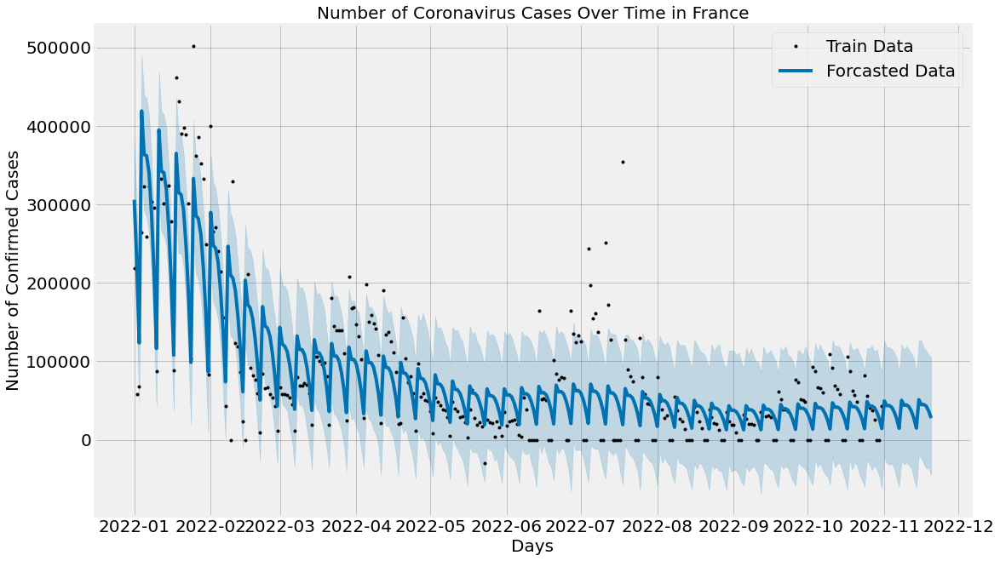

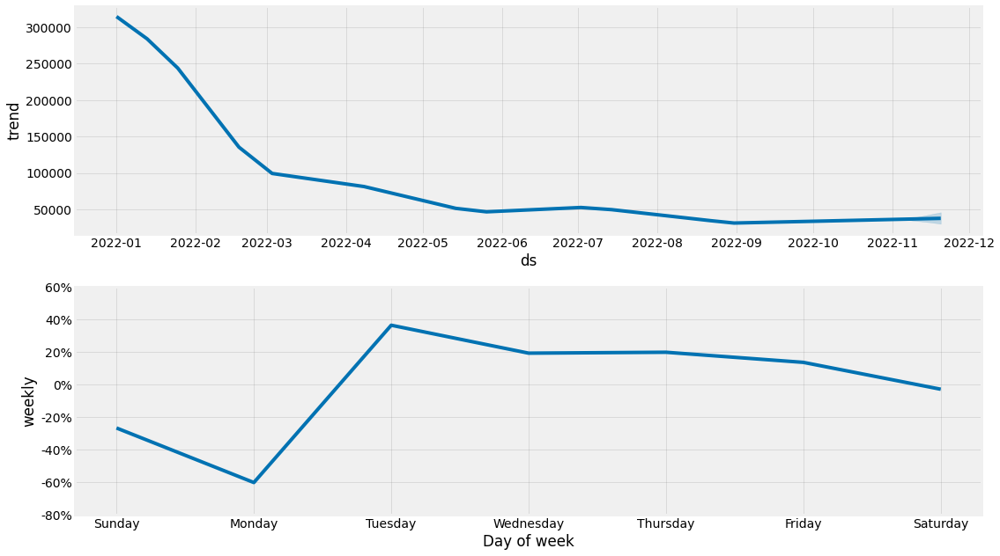

In [20]:
forecastedFrance=confirmForcast(dfconfirmFrance,'Number of Coronavirus Cases Over Time in France')

DEBUG:cmdstanpy:input tempfile: /tmp/tmpox279url/66qg93z8.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpox279url/dfxgakz_.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=6829', 'data', 'file=/tmp/tmpox279url/66qg93z8.json', 'init=/tmp/tmpox279url/dfxgakz_.json', 'output', 'file=/tmp/tmpox279url/prophet_model0kjgfv0_/prophet_model-20221202054611.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
05:46:11 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
05:46:11 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
<ipython-input-5-3d6ee0e4bd72>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.

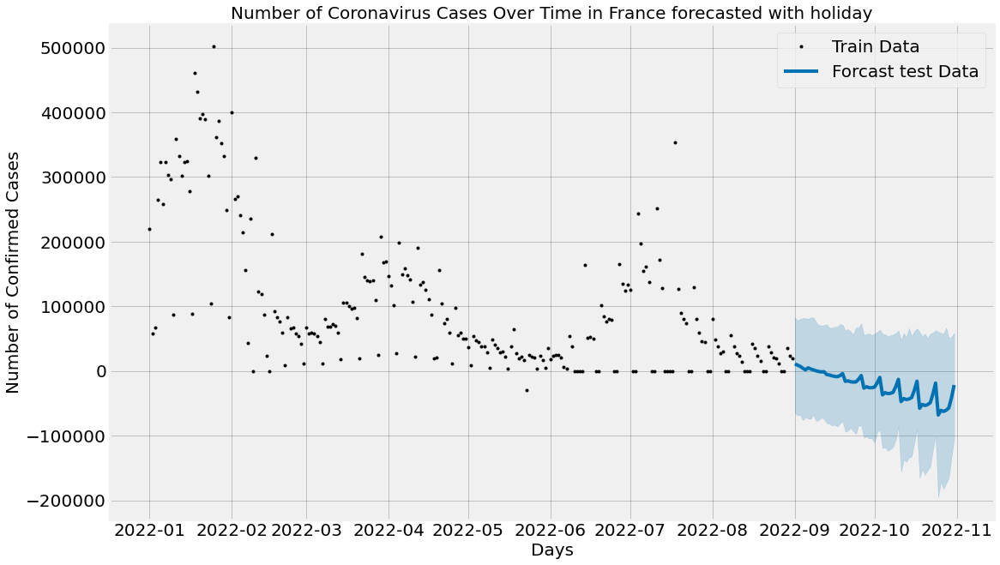

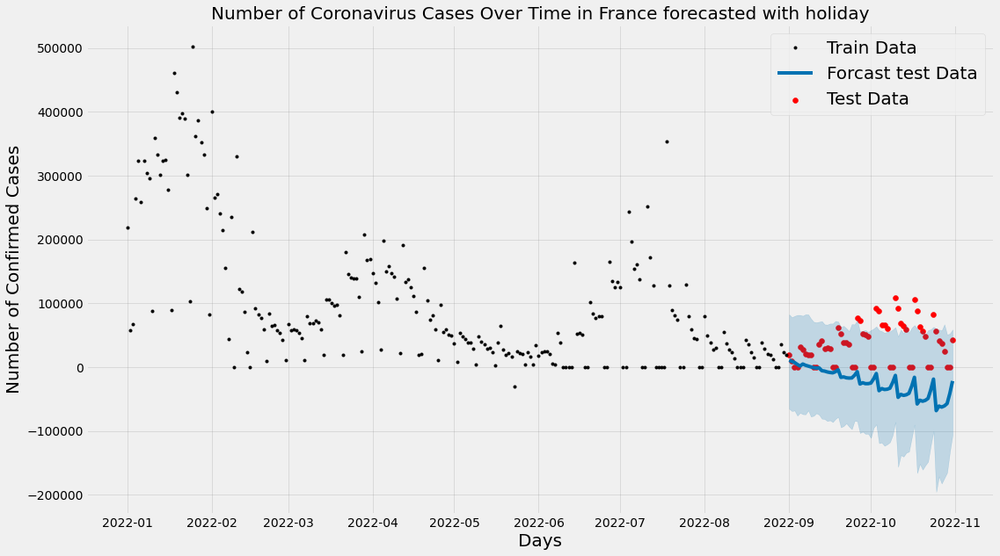

DEBUG:cmdstanpy:input tempfile: /tmp/tmpox279url/72fd3l9t.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpox279url/_0rust0g.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=60906', 'data', 'file=/tmp/tmpox279url/72fd3l9t.json', 'init=/tmp/tmpox279url/_0rust0g.json', 'output', 'file=/tmp/tmpox279url/prophet_model1lwivfgf/prophet_model-20221202054613.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
05:46:13 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
05:46:13 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


r2_score=  0.6802769064857306
mean_squared_error= 3208479956.9342103
mean_absolute_error= 40239.44078947369
Root mean_squared_error= 56643.44584269402


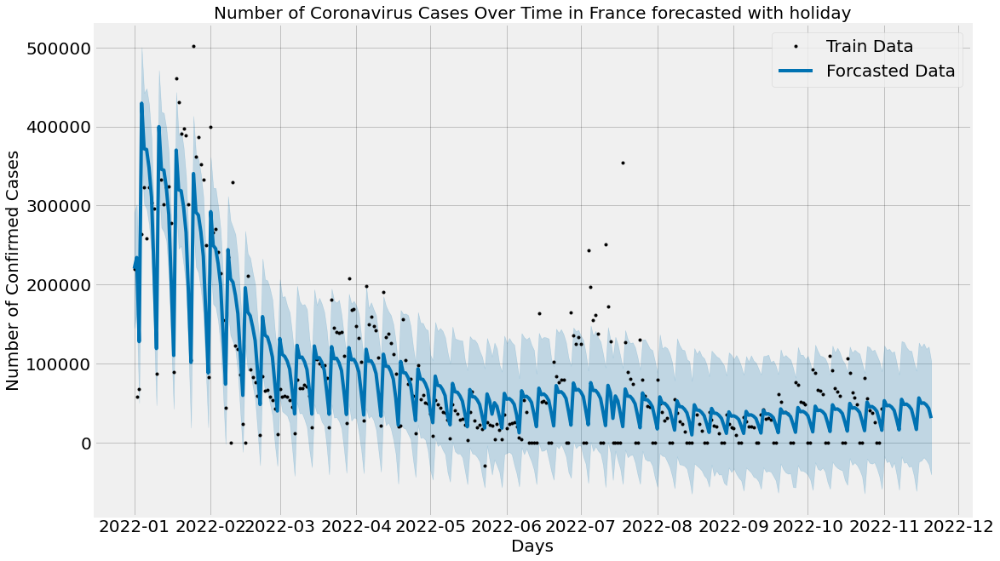

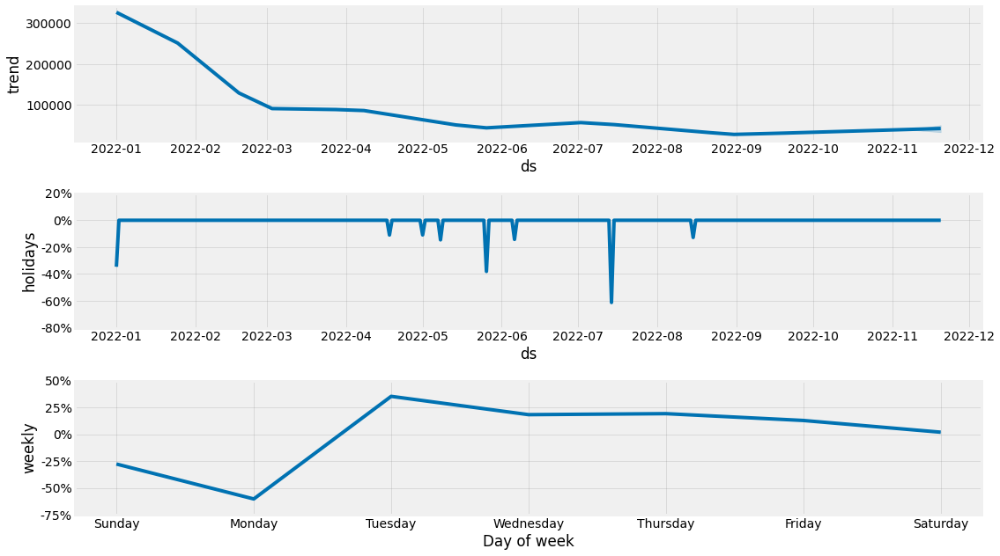

In [21]:
forecastedFrance_holiday=confirmForcast_holidays(dfconfirmFrance,'Number of Coronavirus Cases Over Time in France forecasted with holiday','France','France')

In [22]:
f=forecastedFrance[304:]
f =f [['ds','yhat', 'yhat_lower',  'yhat_upper']]

f.rename(columns = {'ds':'Date','yhat':'Confirm', 'yhat_lower':'Confirm_Lower', 'yhat_upper':'Confirm_Upper'}, inplace = True)
f

,Date,Confirm,Confirm_Lower,Confirm_Upper
304,2022-11-01,49614,-20735,126738
305,2022-11-02,43476,-29936,117457
306,2022-11-03,43773,-31947,118366
307,2022-11-04,41598,-30674,115733
308,2022-11-05,35640,-35431,111360
309,2022-11-06,26969,-49409,104727
310,2022-11-07,14690,-59984,85675
311,2022-11-08,50383,-25459,121379
312,2022-11-09,44148,-31431,115004
313,2022-11-10,44449,-28820,119353


In [23]:
f=forecastedFrance_holiday[304:]
f =f [['ds','yhat', 'yhat_lower',  'yhat_upper']]

f.rename(columns = {'ds':'Date','yhat':'Confirm', 'yhat_lower':'Confirm_Lower', 'yhat_upper':'Confirm_Upper'}, inplace = True)
f

,Date,Confirm,Confirm_Lower,Confirm_Upper
304,2022-11-01,53003,-17272,122823
305,2022-11-02,46551,-24966,117219
306,2022-11-03,47135,-23204,118543
307,2022-11-04,44835,-31800,113844
308,2022-11-05,40684,-25258,115440
309,2022-11-06,29005,-40769,100631
310,2022-11-07,16046,-59848,86243
311,2022-11-08,54741,-17665,128296
312,2022-11-09,48069,-25772,127024
313,2022-11-10,48665,-24824,120290


**Germany**

DEBUG:cmdstanpy:input tempfile: /tmp/tmpox279url/1j9oz9hs.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpox279url/4edbj3v8.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=25850', 'data', 'file=/tmp/tmpox279url/1j9oz9hs.json', 'init=/tmp/tmpox279url/4edbj3v8.json', 'output', 'file=/tmp/tmpox279url/prophet_modelnyhb4zrd/prophet_model-20221202054615.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
05:46:15 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
05:46:15 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
<ipython-input-4-6aa2debc1544>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata

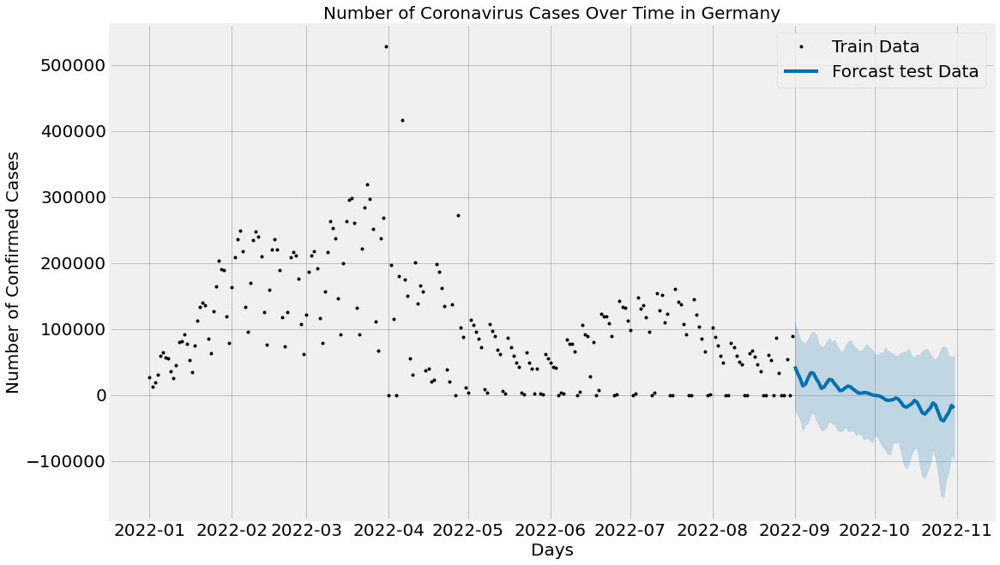

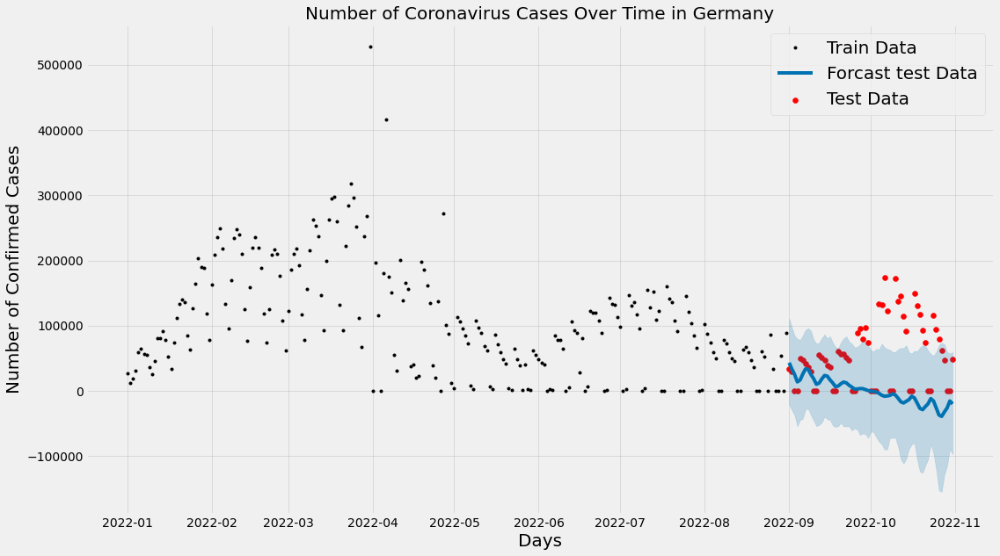

DEBUG:cmdstanpy:input tempfile: /tmp/tmpox279url/d7ym228n.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpox279url/8hfucahp.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=28629', 'data', 'file=/tmp/tmpox279url/d7ym228n.json', 'init=/tmp/tmpox279url/8hfucahp.json', 'output', 'file=/tmp/tmpox279url/prophet_modelvr2mzp4l/prophet_model-20221202054617.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
05:46:17 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
05:46:17 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


r2_score=  0.646871005074682
mean_squared_error= 2350036966.2401314
mean_absolute_error= 36938.95065789474
Root mean_squared_error= 48477.17985031856


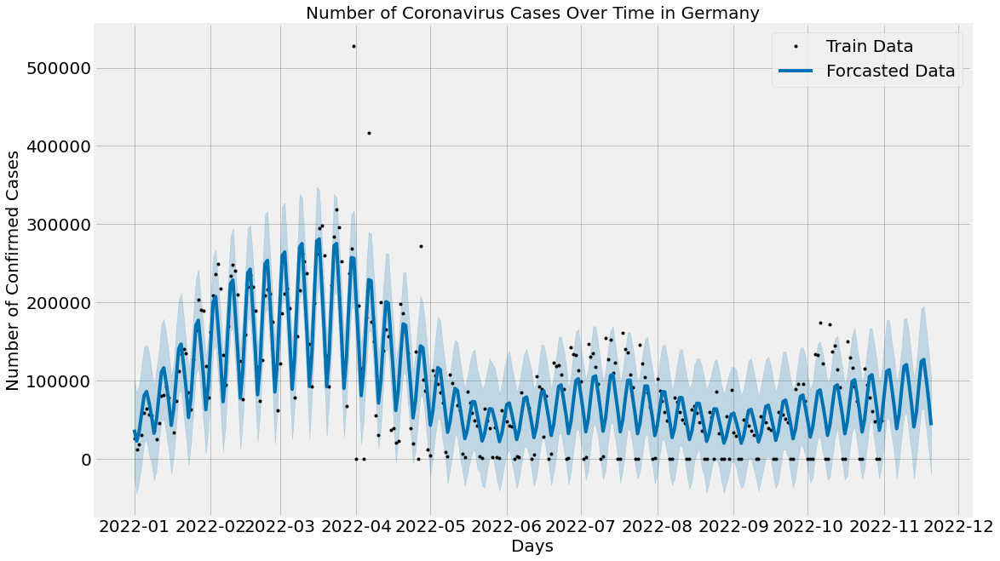

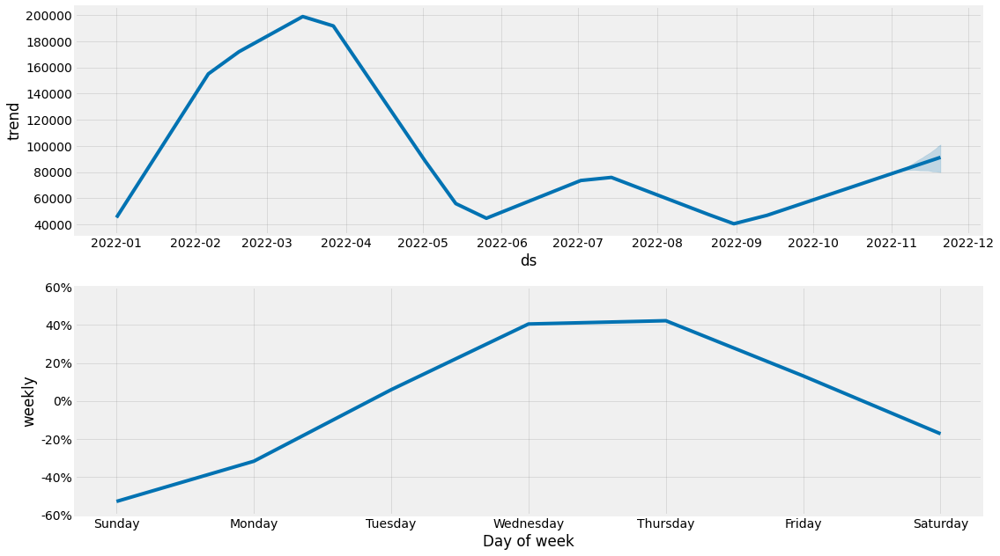

In [24]:
forecastedGermany=confirmForcast(dfconfirmGermany,'Number of Coronavirus Cases Over Time in Germany')

DEBUG:cmdstanpy:input tempfile: /tmp/tmpox279url/u6im3tw3.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpox279url/aifcoylx.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=1760', 'data', 'file=/tmp/tmpox279url/u6im3tw3.json', 'init=/tmp/tmpox279url/aifcoylx.json', 'output', 'file=/tmp/tmpox279url/prophet_modeld91gckq6/prophet_model-20221202054618.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
05:46:18 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
05:46:18 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
<ipython-input-5-3d6ee0e4bd72>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.

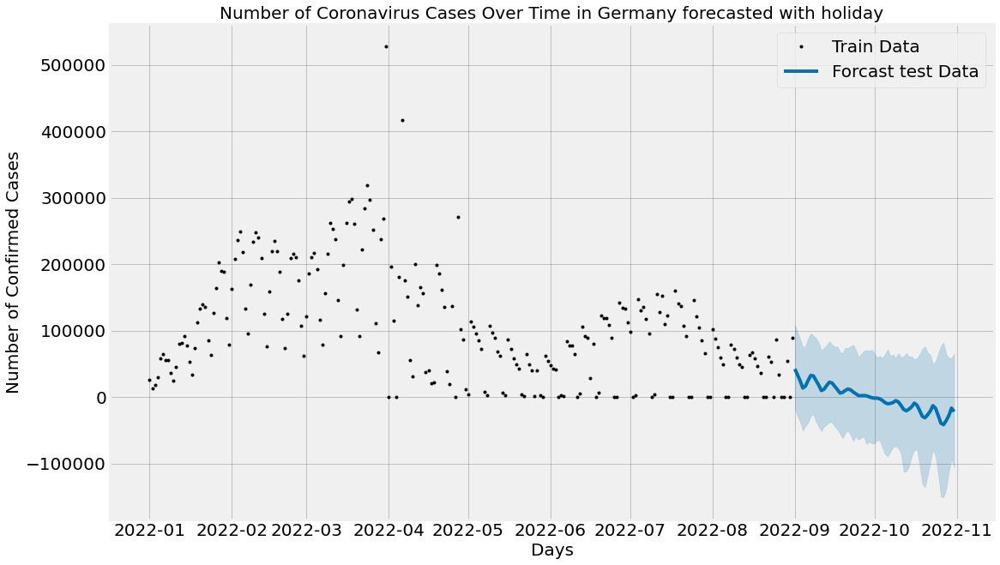

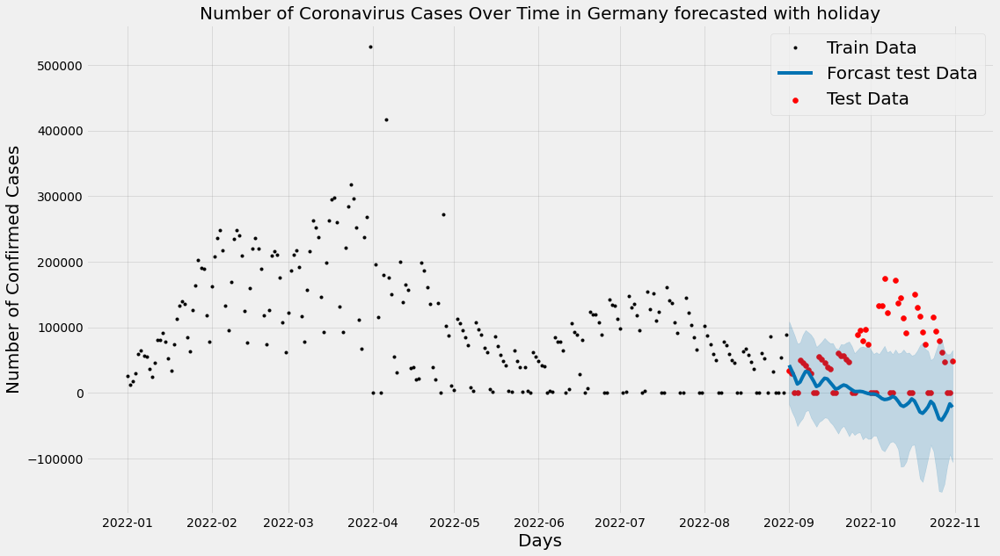

DEBUG:cmdstanpy:input tempfile: /tmp/tmpox279url/mjodscxi.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpox279url/_todfgjg.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=58285', 'data', 'file=/tmp/tmpox279url/mjodscxi.json', 'init=/tmp/tmpox279url/_todfgjg.json', 'output', 'file=/tmp/tmpox279url/prophet_modelyey9be4s/prophet_model-20221202054620.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
05:46:20 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
05:46:20 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


r2_score=  0.6638793539640322
mean_squared_error= 2236848162.1513157
mean_absolute_error= 35644.67105263158
Root mean_squared_error= 47295.32917901424


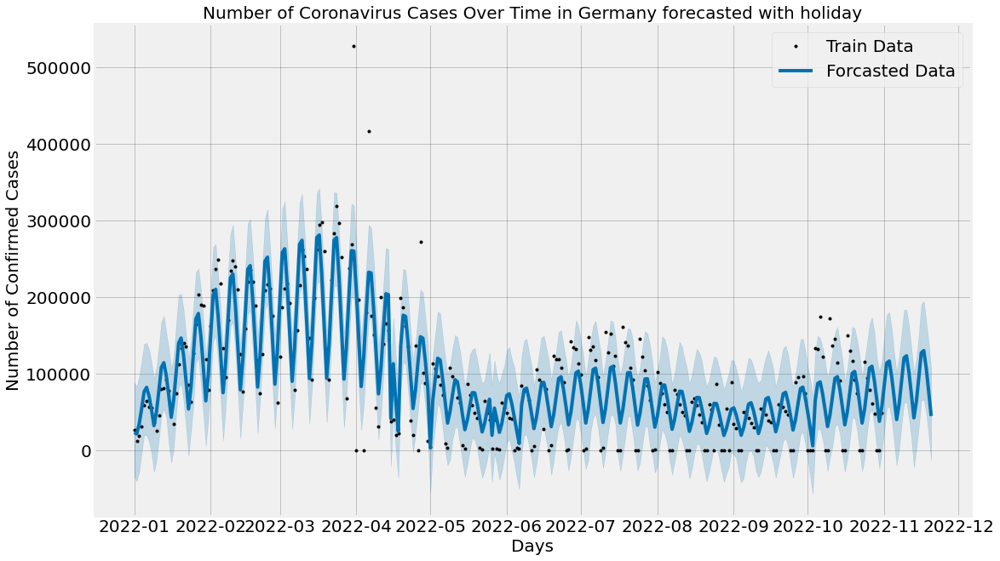

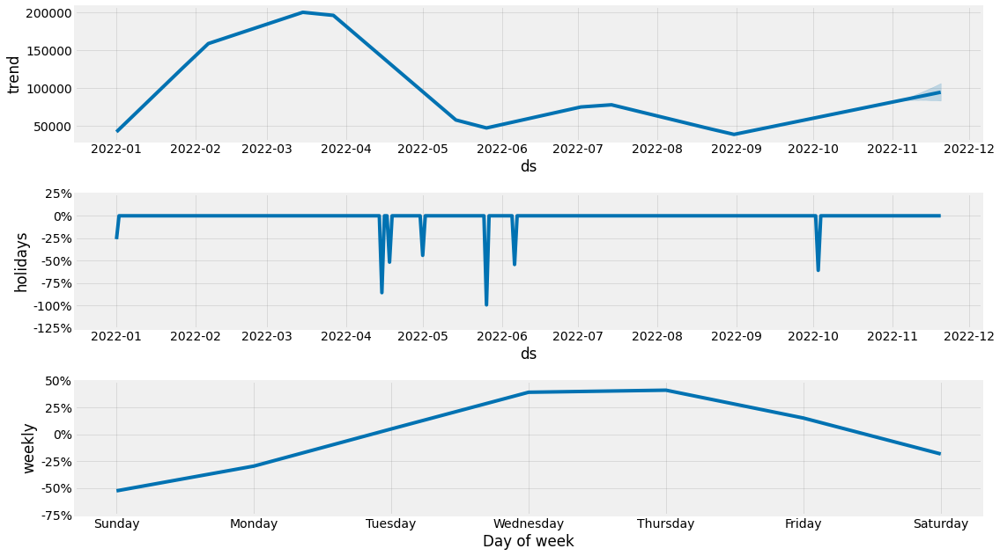

In [25]:
forecastedGermany_holiday=confirmForcast_holidays(dfconfirmGermany,'Number of Coronavirus Cases Over Time in Germany forecasted with holiday','Germany','Germany')

In [26]:
f=forecastedGermany[304:]
f =f [['ds','yhat', 'yhat_lower',  'yhat_upper']]

f.rename(columns = {'ds':'Date','yhat':'Confirm', 'yhat_lower':'Confirm_Lower', 'yhat_upper':'Confirm_Upper'}, inplace = True)
f

,Date,Confirm,Confirm_Lower,Confirm_Upper
304,2022-11-01,83610,21169,149374
305,2022-11-02,111845,53422,177910
306,2022-11-03,114143,49260,177172
307,2022-11-04,91568,28215,149766
308,2022-11-05,67466,6993,129548
309,2022-11-06,38715,-25251,97819
310,2022-11-07,56561,-4328,113057
311,2022-11-08,88438,27402,141816
312,2022-11-09,118251,55051,180267
313,2022-11-10,120628,59534,179537


In [27]:
f=forecastedGermany_holiday[304:]
f =f [['ds','yhat', 'yhat_lower',  'yhat_upper']]

f.rename(columns = {'ds':'Date','yhat':'Confirm', 'yhat_lower':'Confirm_Lower', 'yhat_upper':'Confirm_Upper'}, inplace = True)
f

,Date,Confirm,Confirm_Lower,Confirm_Upper
304,2022-11-01,85288,25346,149423
305,2022-11-02,113989,55352,176821
306,2022-11-03,116535,57228,180552
307,2022-11-04,95925,39075,159308
308,2022-11-05,68646,10450,127166
309,2022-11-06,40133,-20209,101580
310,2022-11-07,60121,1536,122313
311,2022-11-08,90347,33911,152540
312,2022-11-09,120694,61121,183662
313,2022-11-10,123334,63043,183163


**Italy**

DEBUG:cmdstanpy:input tempfile: /tmp/tmpox279url/4tkpaor0.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpox279url/k3f8dvjm.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=86072', 'data', 'file=/tmp/tmpox279url/4tkpaor0.json', 'init=/tmp/tmpox279url/k3f8dvjm.json', 'output', 'file=/tmp/tmpox279url/prophet_modeln8ie2uvg/prophet_model-20221202054622.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
05:46:22 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
05:46:22 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
<ipython-input-4-6aa2debc1544>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata

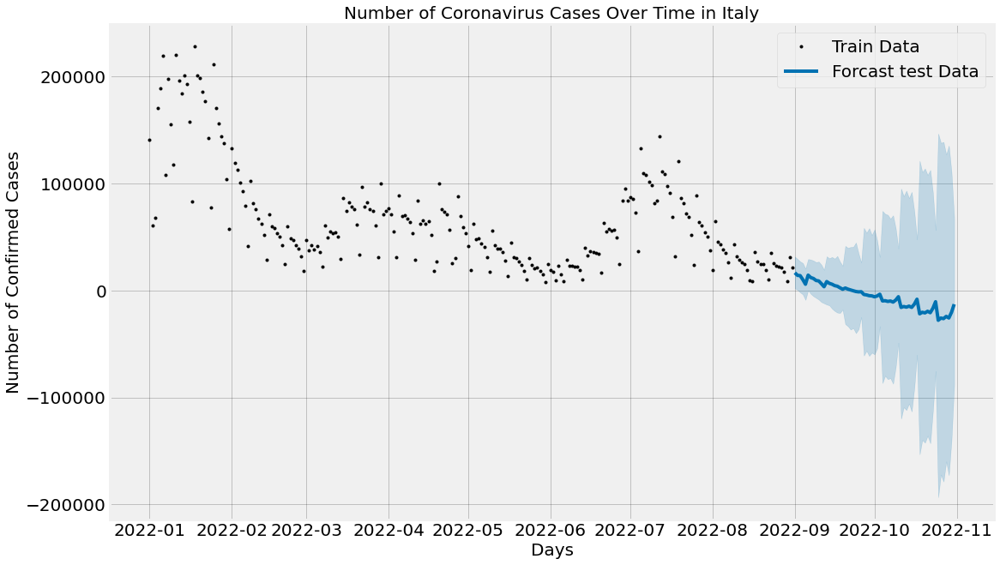

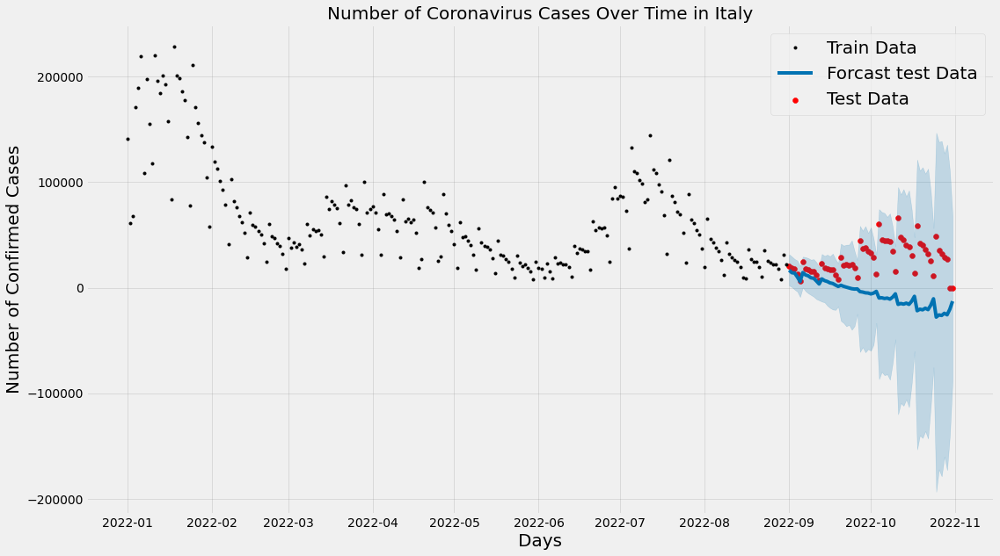

DEBUG:cmdstanpy:input tempfile: /tmp/tmpox279url/mn1m5m6t.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpox279url/ti6_yvbh.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=49645', 'data', 'file=/tmp/tmpox279url/mn1m5m6t.json', 'init=/tmp/tmpox279url/ti6_yvbh.json', 'output', 'file=/tmp/tmpox279url/prophet_model2jsuqkcq/prophet_model-20221202054624.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
05:46:24 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
05:46:24 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


r2_score=  0.943826754193654
mean_squared_error= 117134601.13486843
mean_absolute_error= 6982.8453947368425
Root mean_squared_error= 10822.873977593403


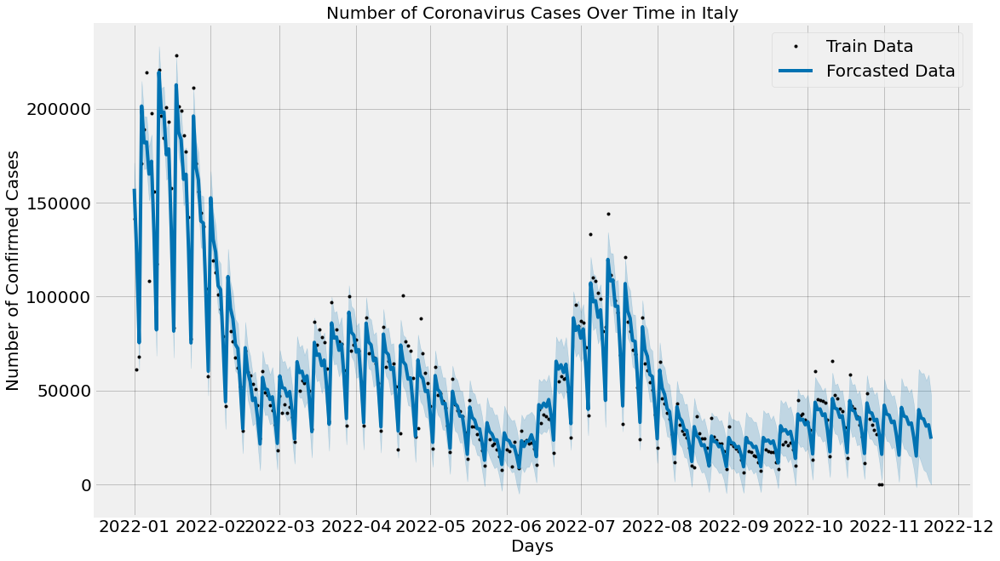

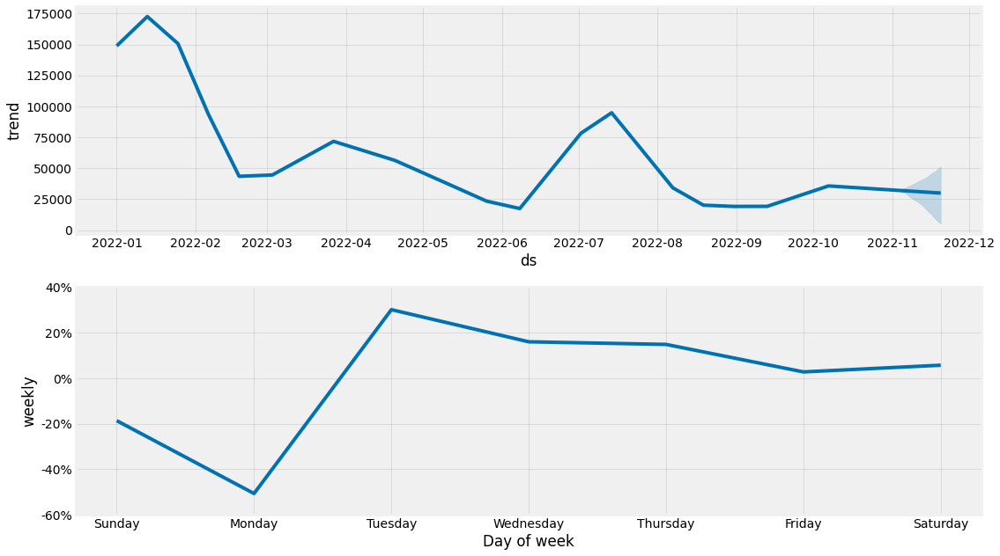

In [28]:
forecastedItaly=confirmForcast(dfconfirmItaly,'Number of Coronavirus Cases Over Time in Italy')

DEBUG:cmdstanpy:input tempfile: /tmp/tmpox279url/fliw_47p.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpox279url/4dnzladm.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=75115', 'data', 'file=/tmp/tmpox279url/fliw_47p.json', 'init=/tmp/tmpox279url/4dnzladm.json', 'output', 'file=/tmp/tmpox279url/prophet_modelb45yd3ck/prophet_model-20221202054626.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
05:46:26 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
05:46:26 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
<ipython-input-5-3d6ee0e4bd72>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata

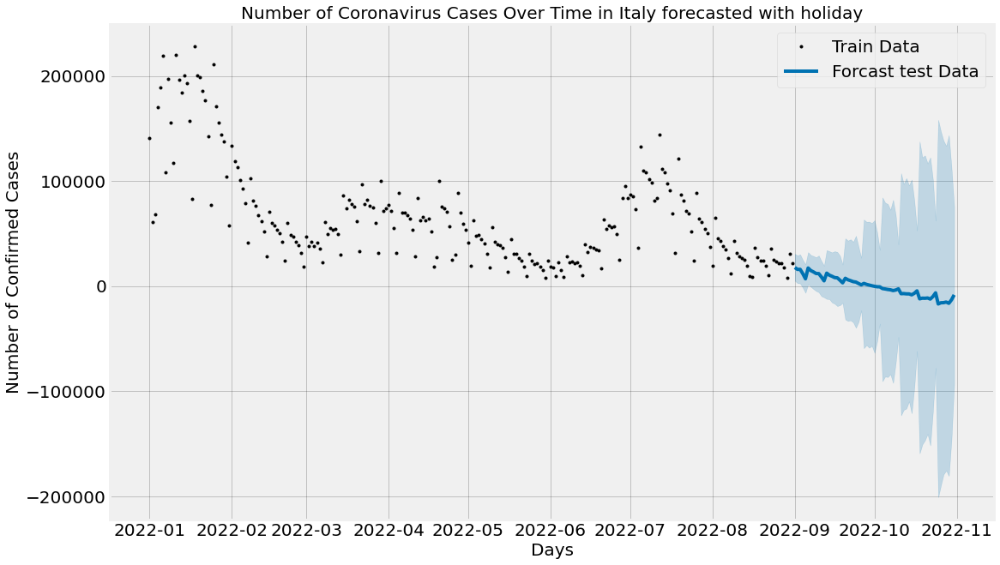

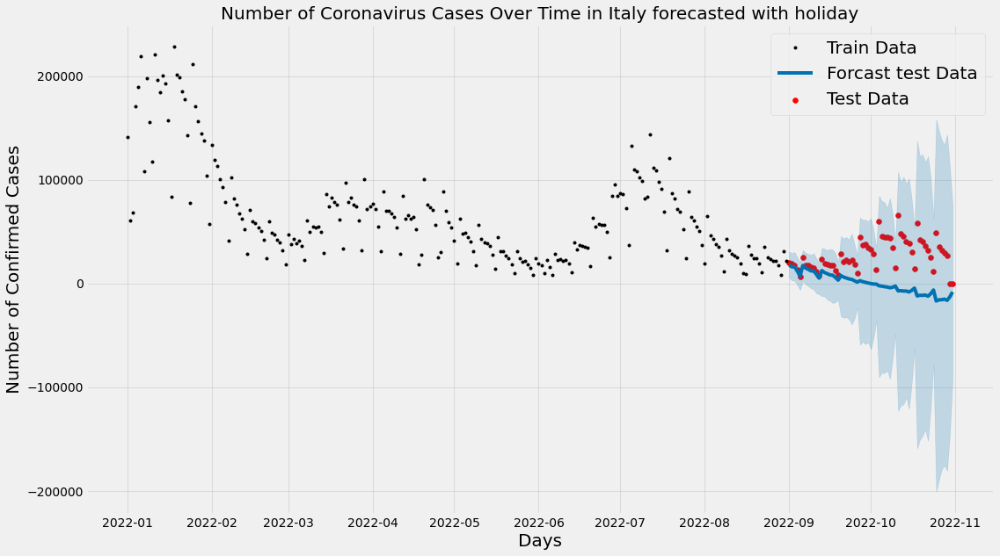

DEBUG:cmdstanpy:input tempfile: /tmp/tmpox279url/wvcbs_99.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpox279url/y6rednt8.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=76214', 'data', 'file=/tmp/tmpox279url/wvcbs_99.json', 'init=/tmp/tmpox279url/y6rednt8.json', 'output', 'file=/tmp/tmpox279url/prophet_modelohzgbfjn/prophet_model-20221202054627.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
05:46:27 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
05:46:27 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


r2_score=  0.9500156187321843
mean_squared_error= 104229344.0361842
mean_absolute_error= 6480.207236842105
Root mean_squared_error= 10209.277351320427


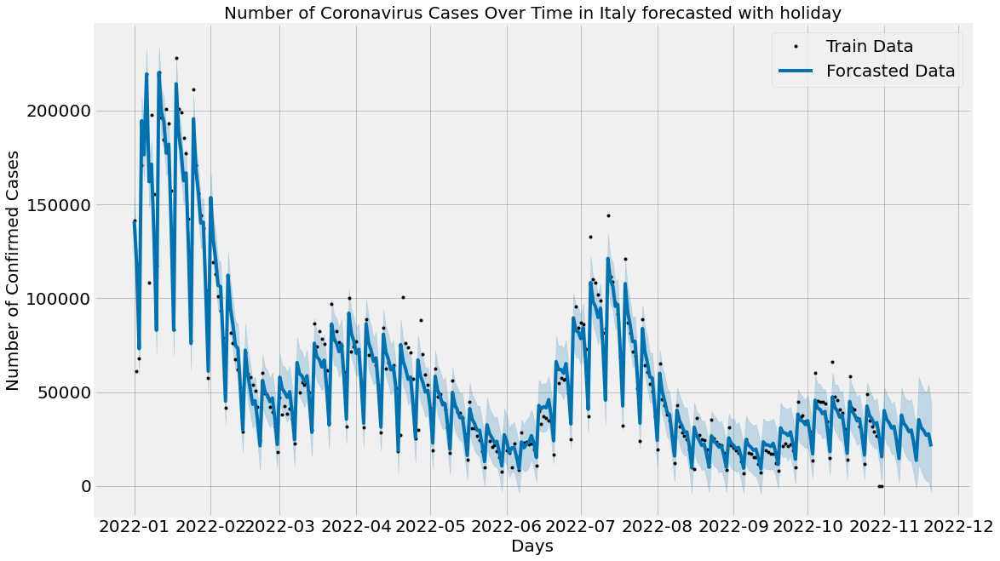

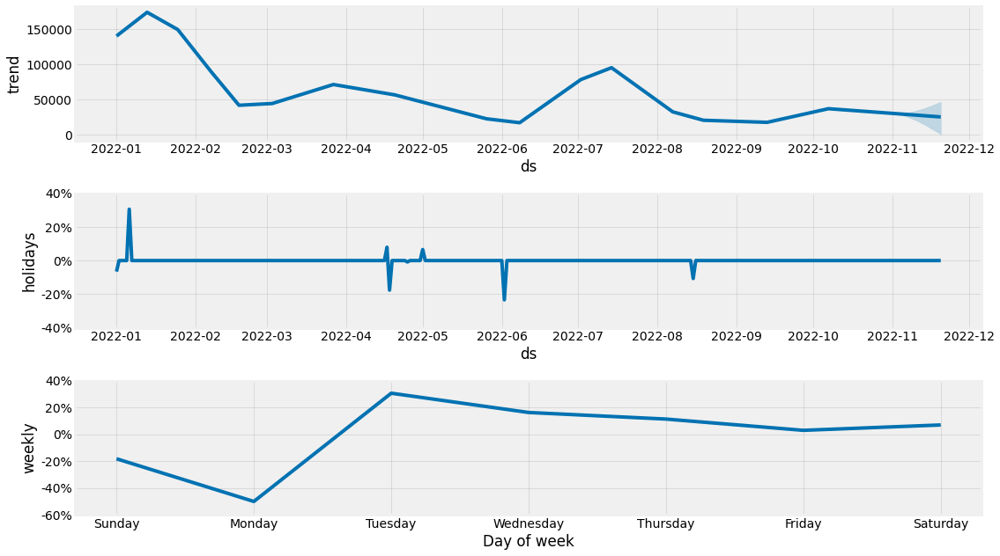

In [29]:
forecastedItaly_holiday=confirmForcast_holidays(dfconfirmItaly,'Number of Coronavirus Cases Over Time in Italy forecasted with holiday','IT','IT')

In [30]:
f=forecastedItaly[304:]
f =f [['ds','yhat', 'yhat_lower',  'yhat_upper']]

f.rename(columns = {'ds':'Date','yhat':'Confirm', 'yhat_lower':'Confirm_Lower', 'yhat_upper':'Confirm_Upper'}, inplace = True)
f

,Date,Confirm,Confirm_Lower,Confirm_Upper
304,2022-11-01,42222,27625,56258
305,2022-11-02,37494,23229,51130
306,2022-11-03,36972,22753,50331
307,2022-11-04,32953,19121,46912
308,2022-11-05,33756,20044,47568
309,2022-11-06,25879,11816,41245
310,2022-11-07,15644,1416,29117
311,2022-11-08,41030,23992,56676
312,2022-11-09,36432,19143,52177
313,2022-11-10,35920,18556,52392


In [31]:
f=forecastedItaly_holiday[304:]
f =f [['ds','yhat', 'yhat_lower',  'yhat_upper']]

f.rename(columns = {'ds':'Date','yhat':'Confirm', 'yhat_lower':'Confirm_Lower', 'yhat_upper':'Confirm_Upper'}, inplace = True)
f

,Date,Confirm,Confirm_Lower,Confirm_Upper
304,2022-11-01,40156,27065,52716
305,2022-11-02,35437,22096,49118
306,2022-11-03,33647,20981,46716
307,2022-11-04,30840,16695,43767
308,2022-11-05,31753,17060,45036
309,2022-11-06,24067,11119,37552
310,2022-11-07,14579,1559,28107
311,2022-11-08,37730,22305,52840
312,2022-11-09,33278,18062,47789
313,2022-11-10,31578,15360,46058


**Pakistan**

DEBUG:cmdstanpy:input tempfile: /tmp/tmpox279url/qvrpp7mb.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpox279url/ru64toez.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=95872', 'data', 'file=/tmp/tmpox279url/qvrpp7mb.json', 'init=/tmp/tmpox279url/ru64toez.json', 'output', 'file=/tmp/tmpox279url/prophet_model3i4v4zgf/prophet_model-20221202054629.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
05:46:29 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
05:46:29 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
<ipython-input-4-6aa2debc1544>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata

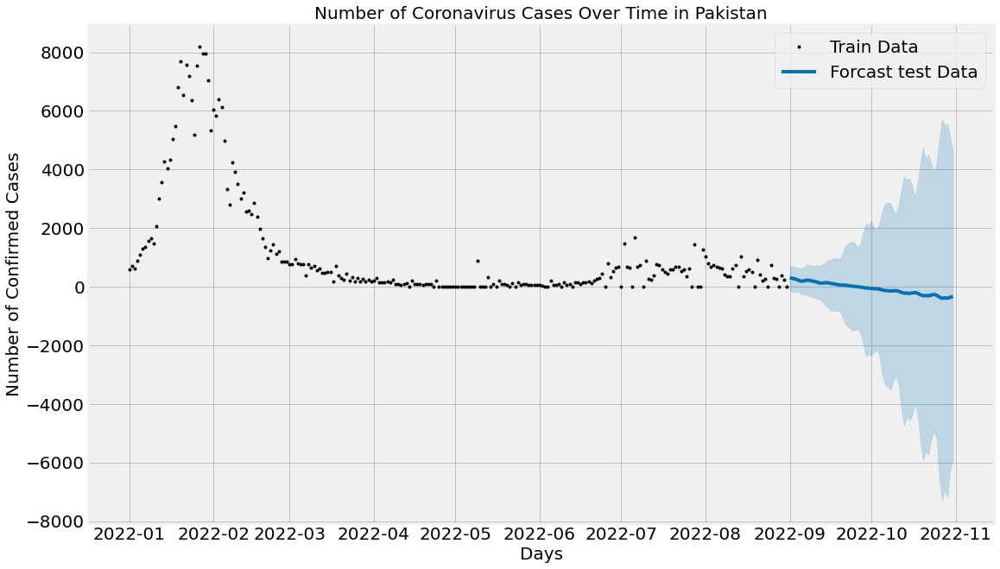

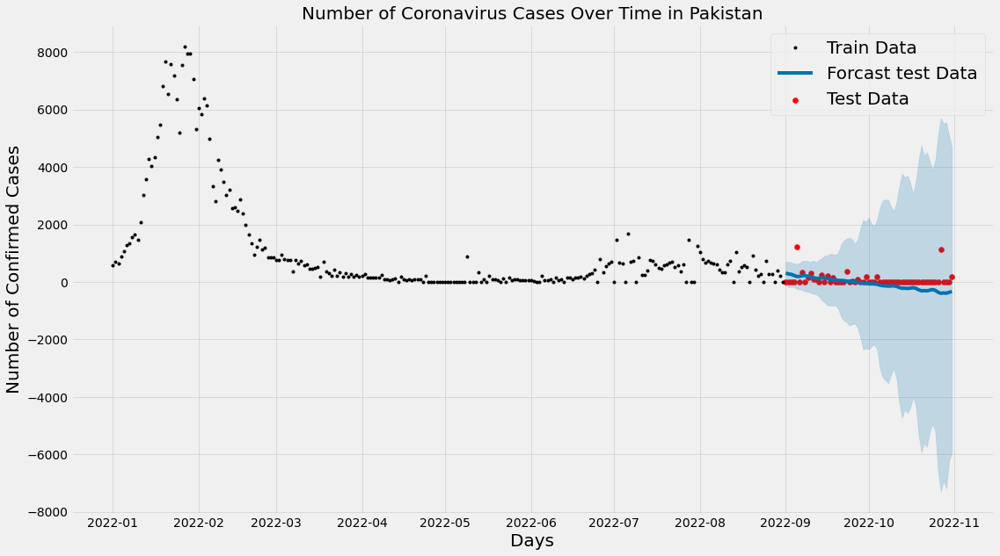

DEBUG:cmdstanpy:input tempfile: /tmp/tmpox279url/0a86i4jo.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpox279url/7uf3u6xg.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=64481', 'data', 'file=/tmp/tmpox279url/0a86i4jo.json', 'init=/tmp/tmpox279url/7uf3u6xg.json', 'output', 'file=/tmp/tmpox279url/prophet_modelusn8bcve/prophet_model-20221202054631.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
05:46:31 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
05:46:31 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
<ipython-input-4-6aa2debc1544>:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata

r2_score=  0.9652257583129205
mean_squared_error= 102865.12828947368
mean_absolute_error= 196.12828947368422
Root mean_squared_error= 320.72593953323087


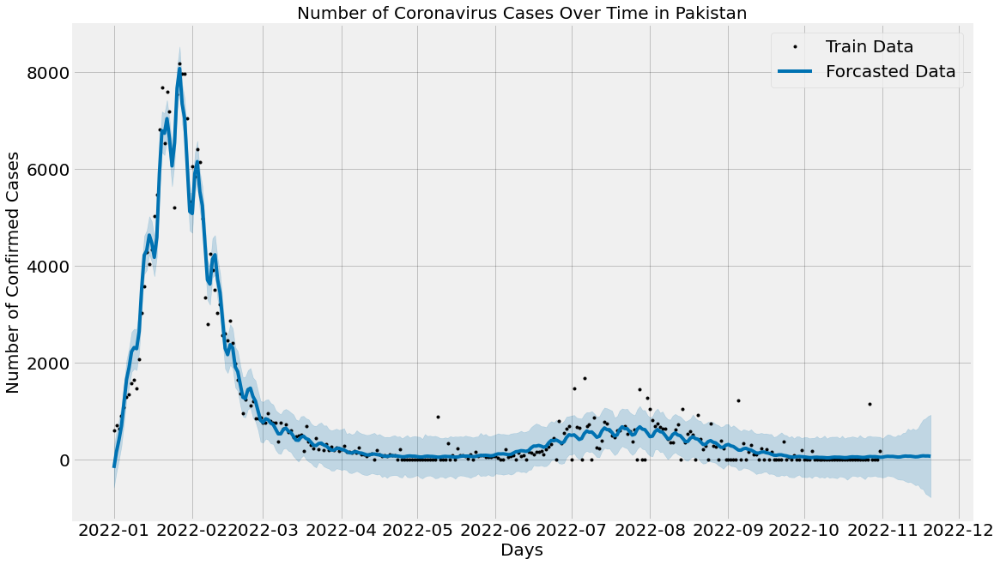

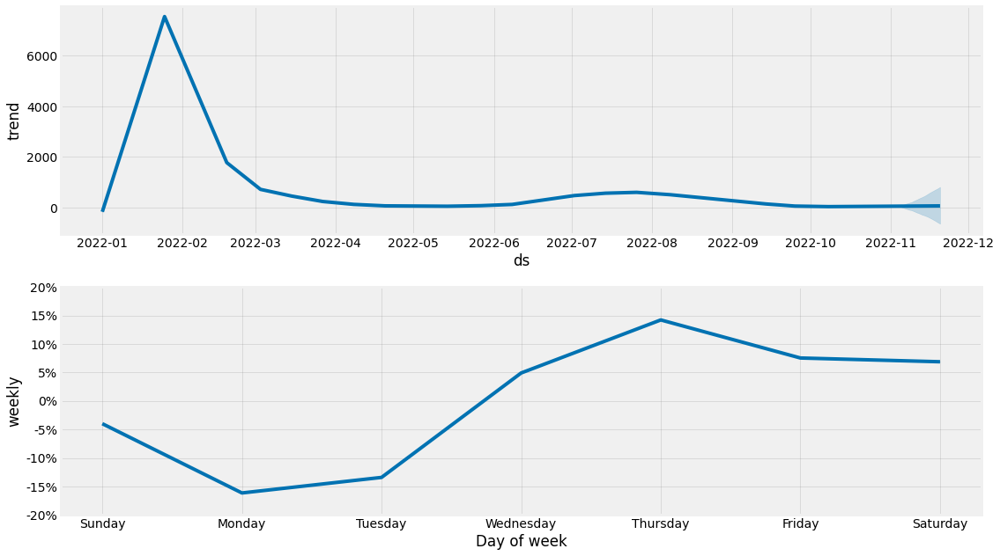

In [32]:
forecastedPakistan=confirmForcast(dfconfirmPakistan,'Number of Coronavirus Cases Over Time in Pakistan')

DEBUG:cmdstanpy:input tempfile: /tmp/tmpox279url/awjb5umy.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpox279url/nxc5qt9j.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=12459', 'data', 'file=/tmp/tmpox279url/awjb5umy.json', 'init=/tmp/tmpox279url/nxc5qt9j.json', 'output', 'file=/tmp/tmpox279url/prophet_modeldalsvtxe/prophet_model-20221202054632.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
05:46:32 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
05:46:32 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
<ipython-input-5-3d6ee0e4bd72>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata

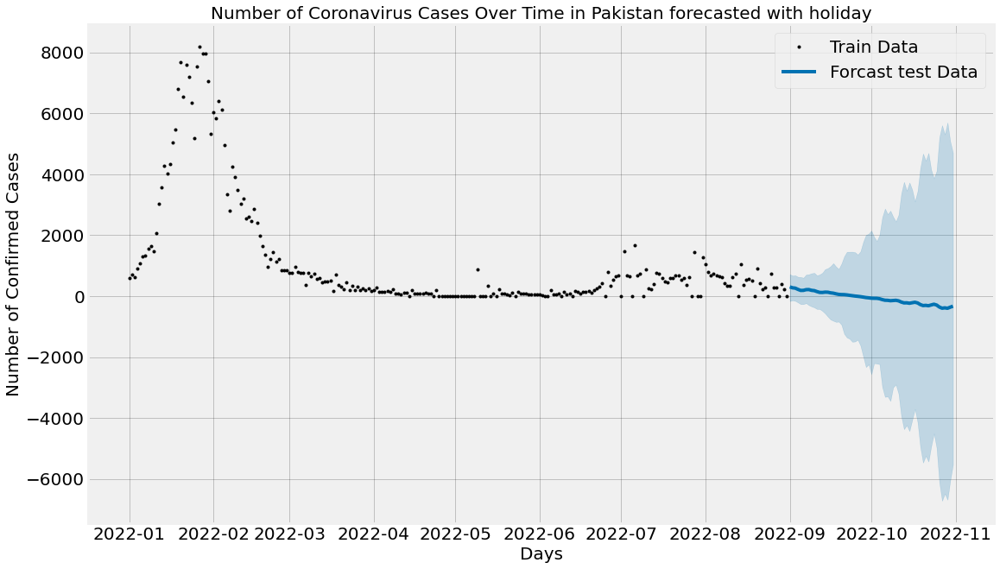

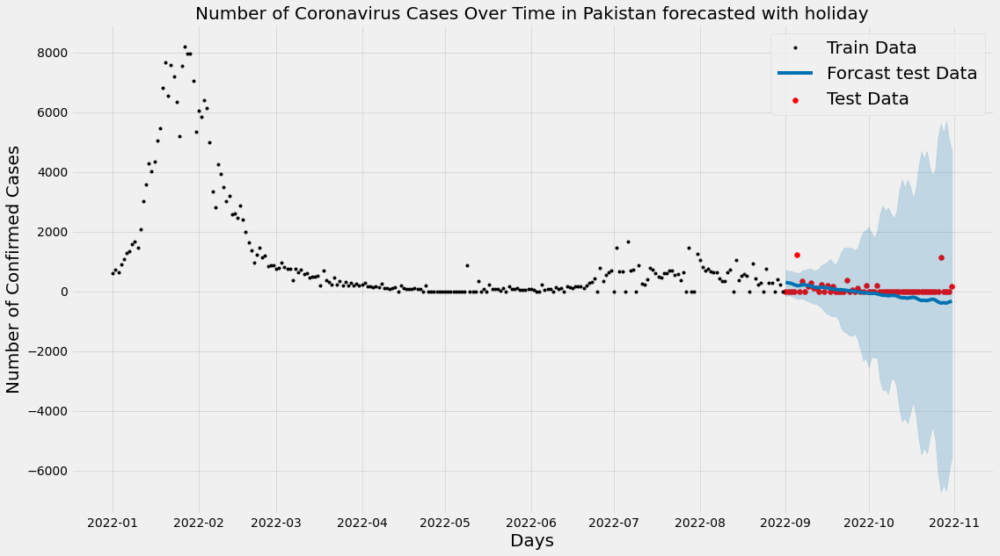

DEBUG:cmdstanpy:input tempfile: /tmp/tmpox279url/b278rn0_.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpox279url/037kv85w.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=23589', 'data', 'file=/tmp/tmpox279url/b278rn0_.json', 'init=/tmp/tmpox279url/037kv85w.json', 'output', 'file=/tmp/tmpox279url/prophet_modell2t8o78u/prophet_model-20221202054634.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
05:46:34 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
05:46:34 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
<ipython-input-5-3d6ee0e4bd72>:54: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata

r2_score=  0.9656806680381771
mean_squared_error= 101519.46710526316
mean_absolute_error= 193.6315789473684
Root mean_squared_error= 318.62119688630753


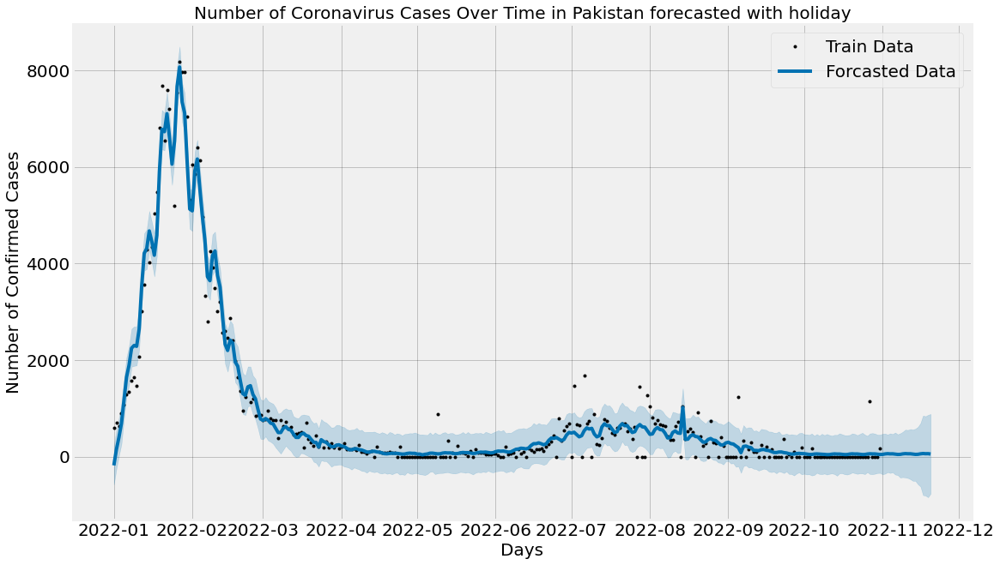

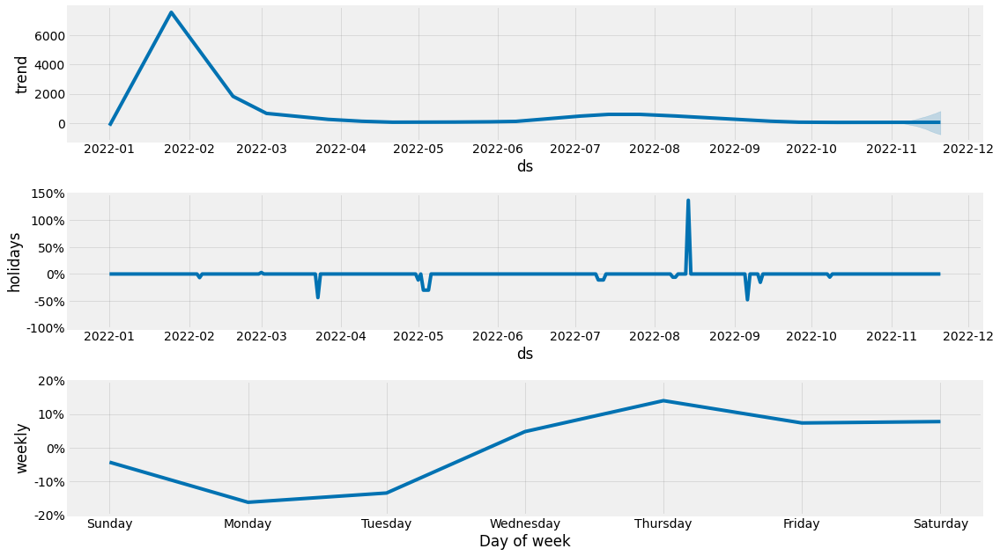

In [33]:
forecastedPakistan_holiday=confirmForcast_holidays(dfconfirmPakistan,'Number of Coronavirus Cases Over Time in Pakistan forecasted with holiday','Pakistan','Pakistan')

In [34]:
f=forecastedPakistan[304:]
f =f [['ds','yhat', 'yhat_lower',  'yhat_upper']]

f.rename(columns = {'ds':'Date','yhat':'Confirm', 'yhat_lower':'Confirm_Lower', 'yhat_upper':'Confirm_Upper'}, inplace = True)
f

,Date,Confirm,Confirm_Lower,Confirm_Upper
304,2022-11-01,48,-373,429
305,2022-11-02,59,-361,479
306,2022-11-03,65,-333,517
307,2022-11-04,62,-345,508
308,2022-11-05,63,-352,476
309,2022-11-06,57,-381,468
310,2022-11-07,50,-411,506
311,2022-11-08,52,-418,499
312,2022-11-09,64,-420,546
313,2022-11-10,71,-449,555


In [35]:
f=forecastedPakistan_holiday[304:]
f =f [['ds','yhat', 'yhat_lower',  'yhat_upper']]

f.rename(columns = {'ds':'Date','yhat':'Confirm', 'yhat_lower':'Confirm_Lower', 'yhat_upper':'Confirm_Upper'}, inplace = True)
f

,Date,Confirm,Confirm_Lower,Confirm_Upper
304,2022-11-01,47,-365,473
305,2022-11-02,57,-352,477
306,2022-11-03,62,-321,457
307,2022-11-04,58,-338,481
308,2022-11-05,59,-325,468
309,2022-11-06,52,-370,499
310,2022-11-07,46,-382,462
311,2022-11-08,48,-433,483
312,2022-11-09,58,-424,514
313,2022-11-10,63,-432,558


**New Zealand**

DEBUG:cmdstanpy:input tempfile: /tmp/tmpox279url/4qsfe3fm.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpox279url/vspig7fe.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=15190', 'data', 'file=/tmp/tmpox279url/4qsfe3fm.json', 'init=/tmp/tmpox279url/vspig7fe.json', 'output', 'file=/tmp/tmpox279url/prophet_modelhsp4f3p1/prophet_model-20221202054636.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
05:46:36 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
05:46:36 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
<ipython-input-4-6aa2debc1544>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata

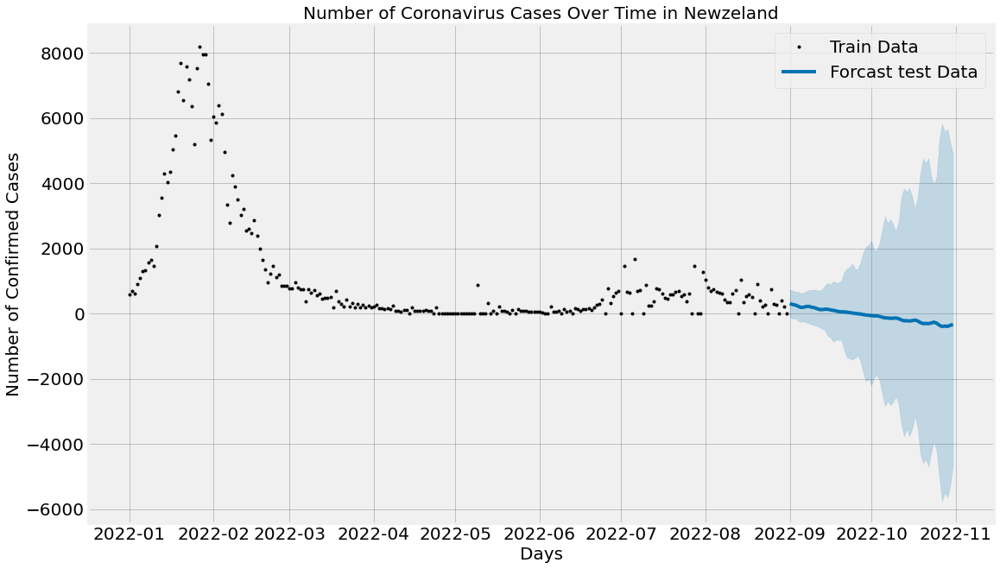

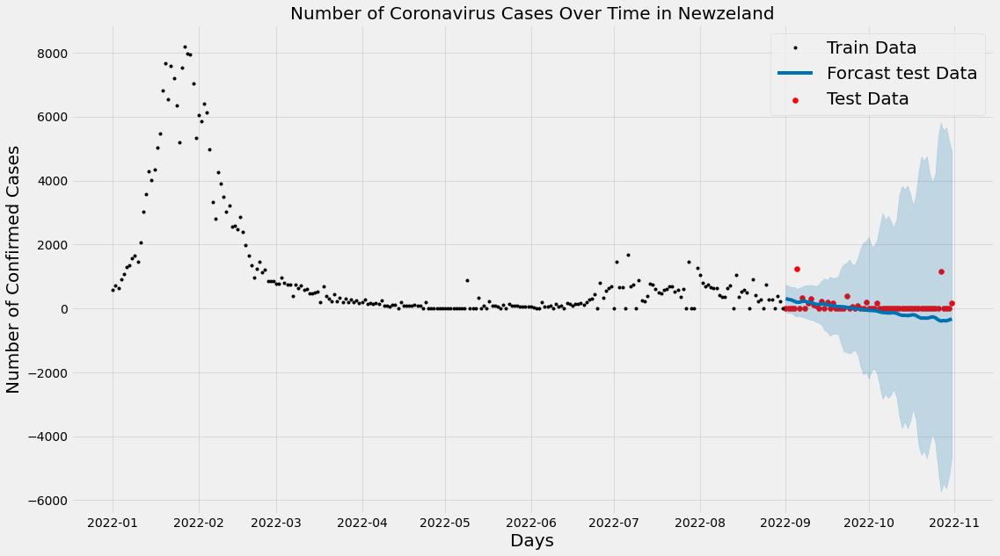

DEBUG:cmdstanpy:input tempfile: /tmp/tmpox279url/_y7n69d5.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpox279url/2256xrdw.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=70379', 'data', 'file=/tmp/tmpox279url/_y7n69d5.json', 'init=/tmp/tmpox279url/2256xrdw.json', 'output', 'file=/tmp/tmpox279url/prophet_modelyd_cih1_/prophet_model-20221202054637.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
05:46:37 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
05:46:38 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
<ipython-input-4-6aa2debc1544>:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata

r2_score=  0.9652257583129205
mean_squared_error= 102865.12828947368
mean_absolute_error= 196.12828947368422
Root mean_squared_error= 320.72593953323087


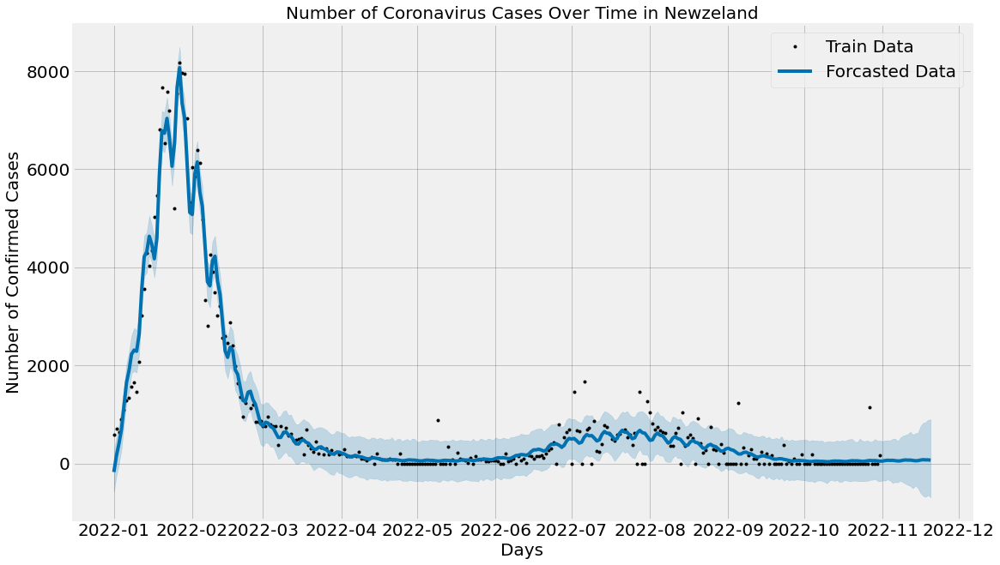

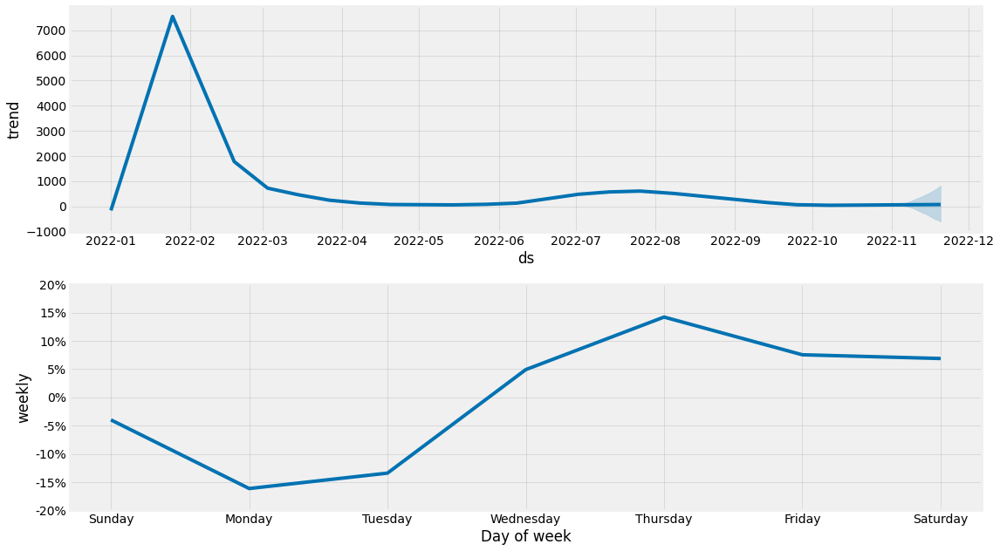

In [36]:
forecastedNewzeland=confirmForcast(dfconfirmPakistan,'Number of Coronavirus Cases Over Time in Newzeland')

DEBUG:cmdstanpy:input tempfile: /tmp/tmpox279url/lg2qvtv5.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpox279url/_nrjbimm.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=52426', 'data', 'file=/tmp/tmpox279url/lg2qvtv5.json', 'init=/tmp/tmpox279url/_nrjbimm.json', 'output', 'file=/tmp/tmpox279url/prophet_modeluvol9kge/prophet_model-20221202054639.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
05:46:39 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
05:46:39 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
<ipython-input-5-3d6ee0e4bd72>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata

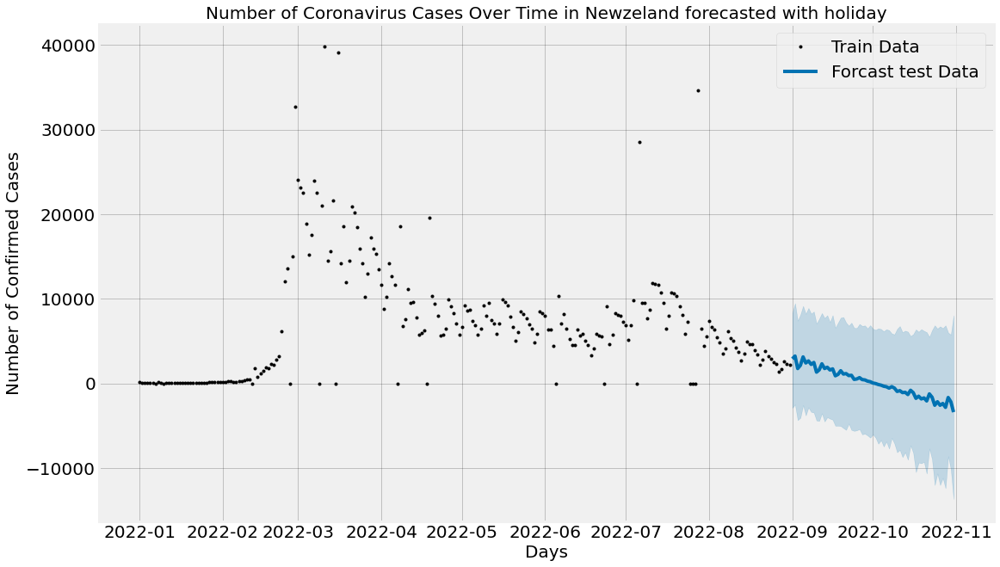

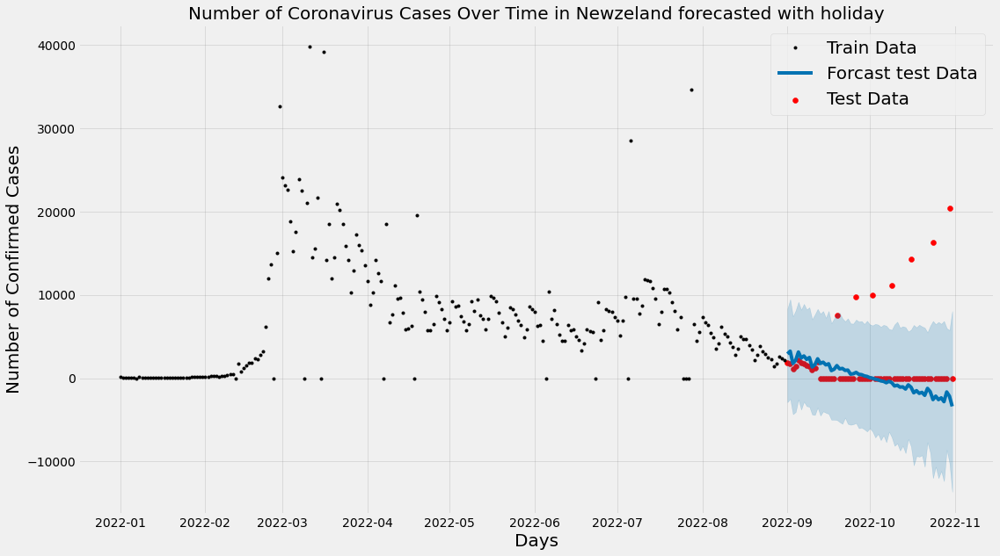

DEBUG:cmdstanpy:input tempfile: /tmp/tmpox279url/gws8f3d2.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpox279url/exi29e9f.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=35498', 'data', 'file=/tmp/tmpox279url/gws8f3d2.json', 'init=/tmp/tmpox279url/exi29e9f.json', 'output', 'file=/tmp/tmpox279url/prophet_modelic0g0lkg/prophet_model-20221202054641.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
05:46:41 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
05:46:41 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
<ipython-input-5-3d6ee0e4bd72>:54: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata

r2_score=  0.5465745719906323
mean_squared_error= 20992105.58881579
mean_absolute_error= 2689.0098684210525
Root mean_squared_error= 4581.714263113294


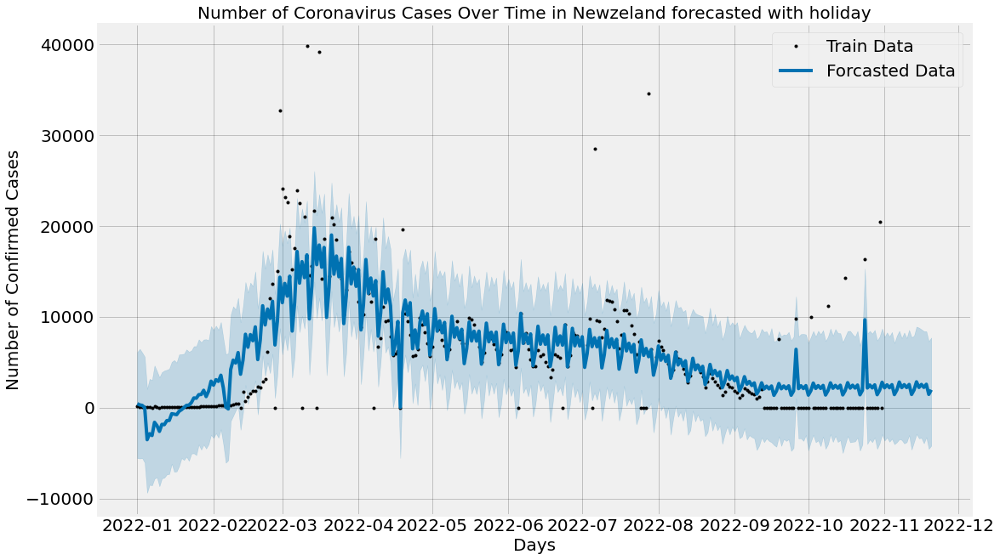

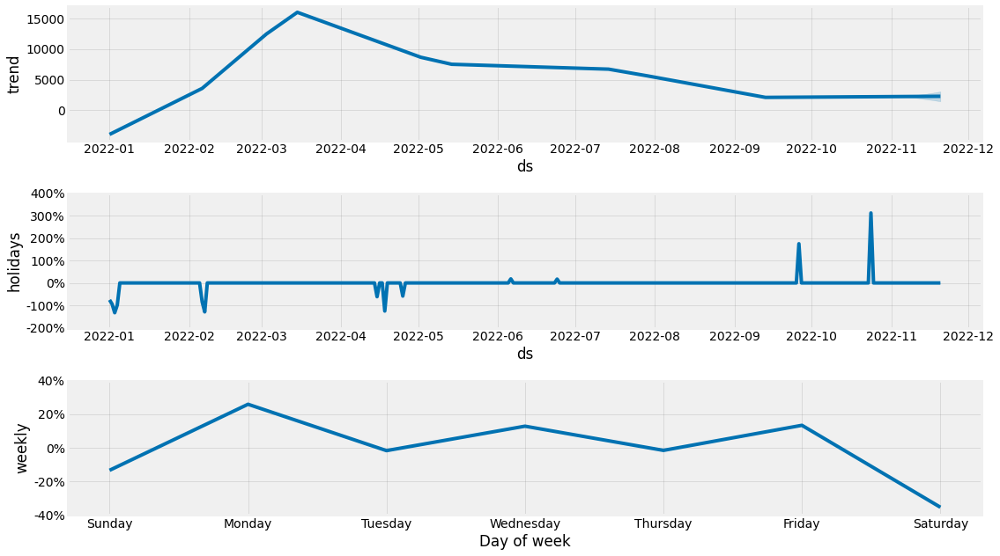

In [37]:
forecastedNewzeland_holiday=confirmForcast_holidays(dfconfirmNewzeland,'Number of Coronavirus Cases Over Time in Newzeland forecasted with holiday','NZ','NZ')

In [38]:
f=forecastedNewzeland[304:]
f =f [['ds','yhat', 'yhat_lower',  'yhat_upper']]

f.rename(columns = {'ds':'Date','yhat':'Confirm', 'yhat_lower':'Confirm_Lower', 'yhat_upper':'Confirm_Upper'}, inplace = True)
f

,Date,Confirm,Confirm_Lower,Confirm_Upper
304,2022-11-01,48,-345,453
305,2022-11-02,59,-355,468
306,2022-11-03,65,-326,473
307,2022-11-04,62,-351,468
308,2022-11-05,63,-400,500
309,2022-11-06,57,-381,504
310,2022-11-07,50,-388,449
311,2022-11-08,52,-351,525
312,2022-11-09,64,-384,563
313,2022-11-10,71,-415,580


In [39]:
f=forecastedNewzeland_holiday[304:]
f =f [['ds','yhat', 'yhat_lower',  'yhat_upper']]

f.rename(columns = {'ds':'Date','yhat':'Confirm', 'yhat_lower':'Confirm_Lower', 'yhat_upper':'Confirm_Upper'}, inplace = True)
f

,Date,Confirm,Confirm_Lower,Confirm_Upper
304,2022-11-01,2190,-3626,7750
305,2022-11-02,2517,-3266,8281
306,2022-11-03,2199,-3748,7832
307,2022-11-04,2535,-3415,8320
308,2022-11-05,1446,-4018,7106
309,2022-11-06,1941,-3803,7899
310,2022-11-07,2825,-3460,8456
311,2022-11-08,2208,-3550,7646
312,2022-11-09,2538,-3932,8269
313,2022-11-10,2217,-3791,7651


**Death**

**India**

DEBUG:cmdstanpy:input tempfile: /tmp/tmpox279url/oj84xo3p.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpox279url/v55xy8oj.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=42991', 'data', 'file=/tmp/tmpox279url/oj84xo3p.json', 'init=/tmp/tmpox279url/v55xy8oj.json', 'output', 'file=/tmp/tmpox279url/prophet_model41_9vgsg/prophet_model-20221202054643.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
05:46:43 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
05:46:43 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


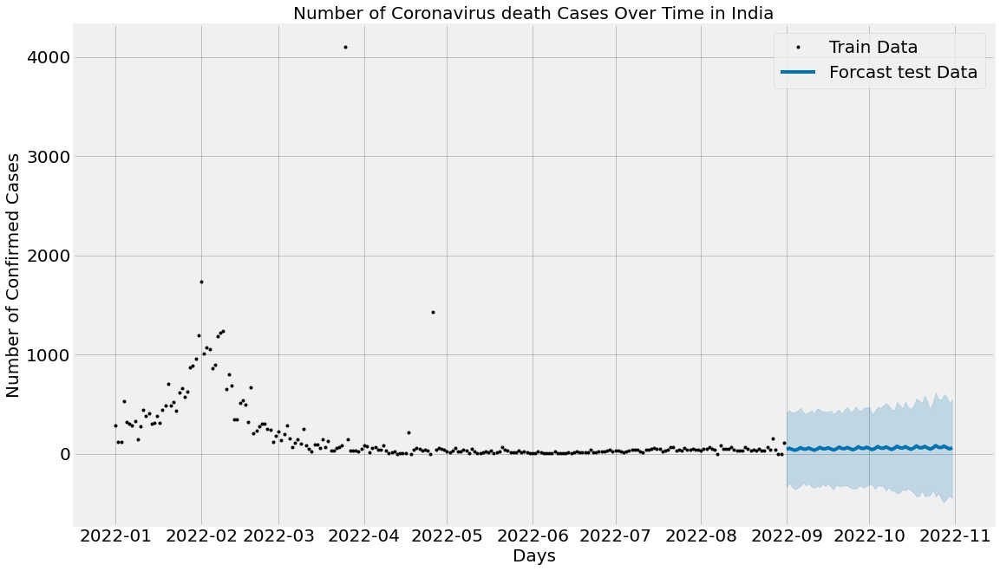

DEBUG:cmdstanpy:input tempfile: /tmp/tmpox279url/2yujw7ph.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpox279url/yw8mlum7.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=43258', 'data', 'file=/tmp/tmpox279url/2yujw7ph.json', 'init=/tmp/tmpox279url/yw8mlum7.json', 'output', 'file=/tmp/tmpox279url/prophet_modelx9vdzsbd/prophet_model-20221202054644.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
05:46:44 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
05:46:44 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


r2_score=  0.4237247812222946
mean_squared_error= 70191.13157894737
mean_absolute_error= 83.78947368421052
Root mean_squared_error= 264.9360896120938


<Figure size 1296x1080 with 0 Axes>

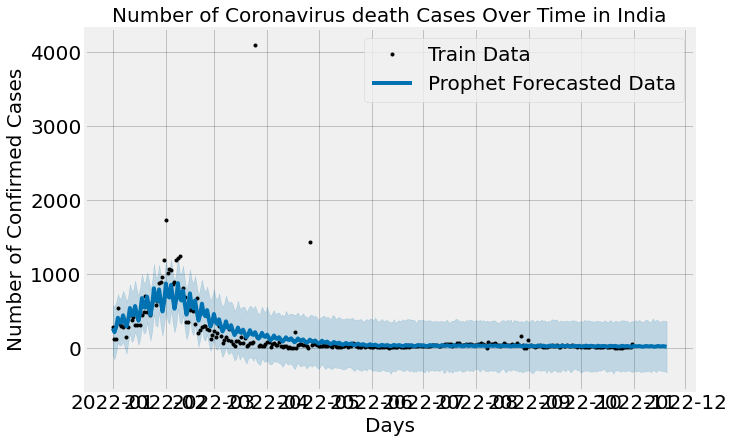

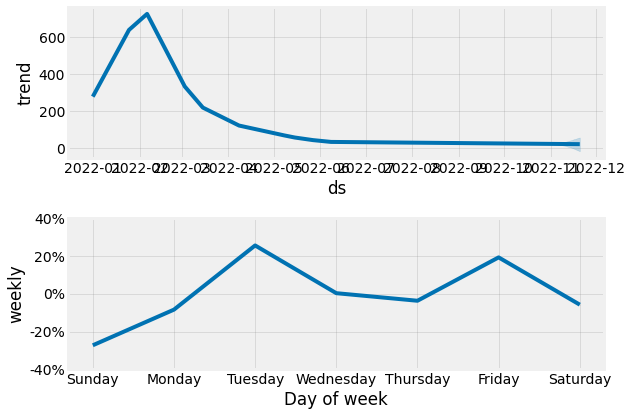

In [40]:
forecastedIndia=DeathForcast(dfDeathIndia,'Number of Coronavirus death Cases Over Time in India')


In [41]:
forecastedIndia.tail()

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,weekly,weekly_lower,weekly_upper,additive_terms,additive_terms_lower,additive_terms_upper,yhat
319,2022-11-16,20.364271,-308,345,-3.884538,46.911894,0.003095,0.003095,0.003095,0.003095,0.003095,0.003095,0.0,0.0,0.0,20
320,2022-11-17,20.290407,-306,360,-7.550092,48.611671,-0.036975,-0.036975,-0.036975,-0.036975,-0.036975,-0.036975,0.0,0.0,0.0,20
321,2022-11-18,20.216542,-319,369,-11.279501,51.445119,0.192608,0.192608,0.192608,0.192608,0.192608,0.192608,0.0,0.0,0.0,24
322,2022-11-19,20.142677,-314,365,-14.672509,54.226573,-0.057762,-0.057762,-0.057762,-0.057762,-0.057762,-0.057762,0.0,0.0,0.0,19
323,2022-11-20,20.068812,-334,360,-18.494381,56.392636,-0.272817,-0.272817,-0.272817,-0.272817,-0.272817,-0.272817,0.0,0.0,0.0,15


/usr/local/lib/python3.8/dist-packages/prophet/hdays.py:209: Warning: We only support Diwali and Holi holidays from 2010 to 2030
  warnings.warn(warning_msg, Warning)
DEBUG:cmdstanpy:input tempfile: /tmp/tmpox279url/ro3_9lq2.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpox279url/dzut2ohf.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=3086', 'data', 'file=/tmp/tmpox279url/ro3_9lq2.json', 'init=/tmp/tmpox279url/dzut2ohf.json', 'output', 'file=/tmp/tmpox279url/prophet_model4w2zkak6/prophet_model-20221202054646.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
05:46:46 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
05:46:46 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
/usr/local/lib/python3.8/dist-packages/prophet/hdays.py:209: Warning: We only

r2_score=  0.43342305320390784
mean_squared_error= 69009.86842105263
mean_absolute_error= 83.01315789473684
Root mean_squared_error= 262.69729427813417


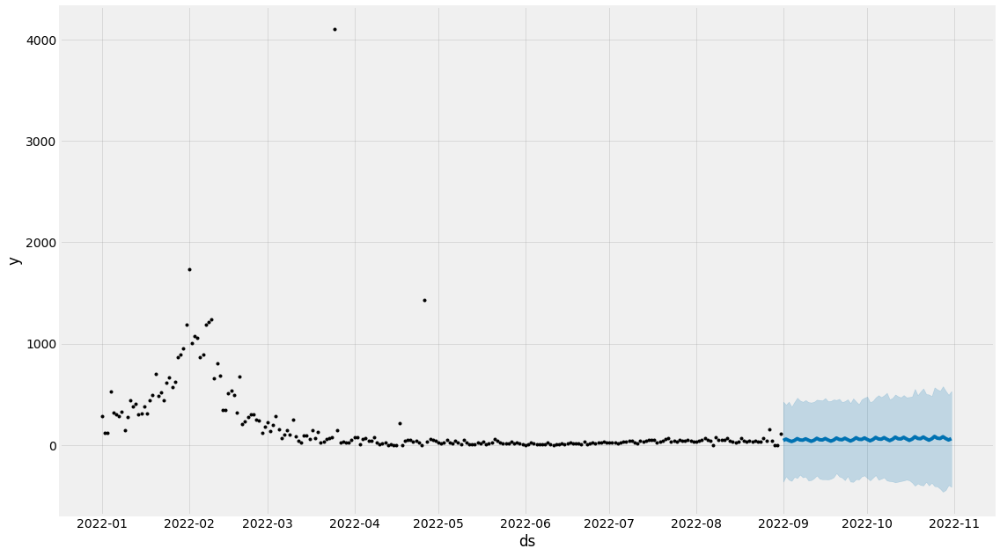

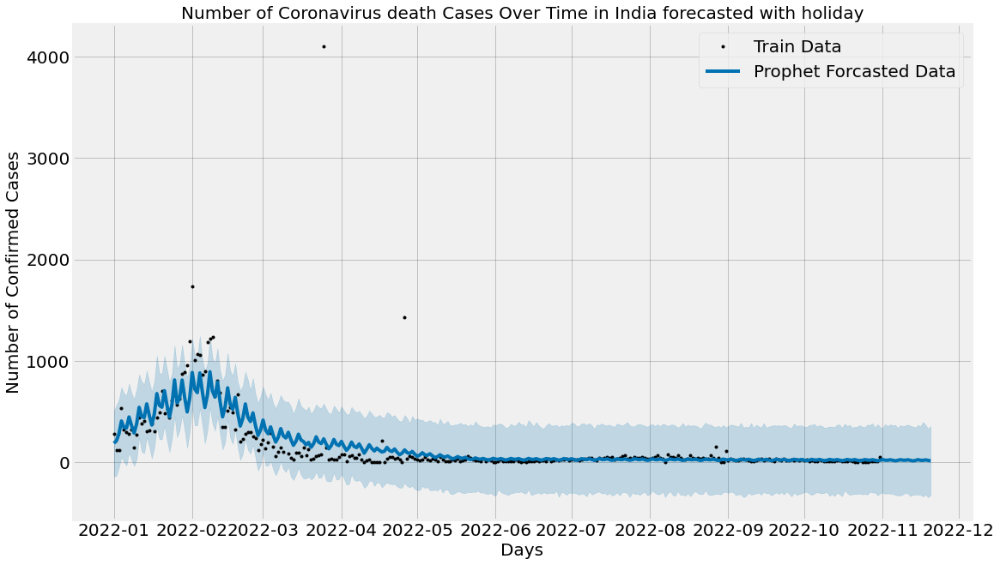

/usr/local/lib/python3.8/dist-packages/prophet/hdays.py:209: Warning: We only support Diwali and Holi holidays from 2010 to 2030
  warnings.warn(warning_msg, Warning)


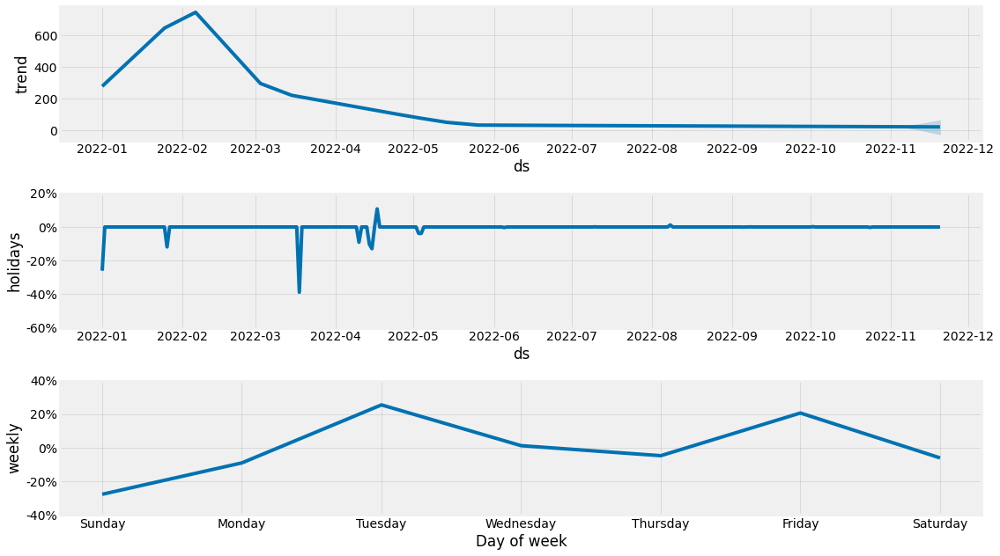

In [42]:
forecastedIndia_holidays=DeathForcast_holidays(dfDeathIndia,'Number of Coronavirus death Cases Over Time in India forecasted with holiday','India','India')

In [43]:
f=forecastedIndia[304:]
f =f [['ds','yhat', 'yhat_lower',  'yhat_upper']]

f.rename(columns = {'ds':'Date','yhat':'Confirm', 'yhat_lower':'Confirm_Lower', 'yhat_upper':'Confirm_Upper'}, inplace = True)
f

,Date,Confirm,Confirm_Lower,Confirm_Upper
304,2022-11-01,27,-304,357
305,2022-11-02,21,-322,375
306,2022-11-03,21,-314,353
307,2022-11-04,25,-313,380
308,2022-11-05,20,-331,357
309,2022-11-06,15,-314,350
310,2022-11-07,19,-322,363
311,2022-11-08,26,-318,382
312,2022-11-09,21,-312,373
313,2022-11-10,20,-311,344


In [44]:
f=forecastedIndia_holidays[304:]
f =f [['ds','yhat', 'yhat_lower',  'yhat_upper']]

f.rename(columns = {'ds':'Date','yhat':'Confirm', 'yhat_lower':'Confirm_Lower', 'yhat_upper':'Confirm_Upper'}, inplace = True)
f

,Date,Confirm,Confirm_Lower,Confirm_Upper
304,2022-11-01,28,-297,338
305,2022-11-02,22,-309,377
306,2022-11-03,21,-305,357
307,2022-11-04,26,-308,375
308,2022-11-05,21,-310,365
309,2022-11-06,16,-320,370
310,2022-11-07,20,-326,339
311,2022-11-08,27,-326,367
312,2022-11-09,22,-316,357
313,2022-11-10,21,-301,363


**Bangladesh**

DEBUG:cmdstanpy:input tempfile: /tmp/tmpox279url/r_k06clh.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpox279url/x2sxu7uf.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=52252', 'data', 'file=/tmp/tmpox279url/r_k06clh.json', 'init=/tmp/tmpox279url/x2sxu7uf.json', 'output', 'file=/tmp/tmpox279url/prophet_model844194j0/prophet_model-20221202054649.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
05:46:49 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
05:46:49 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


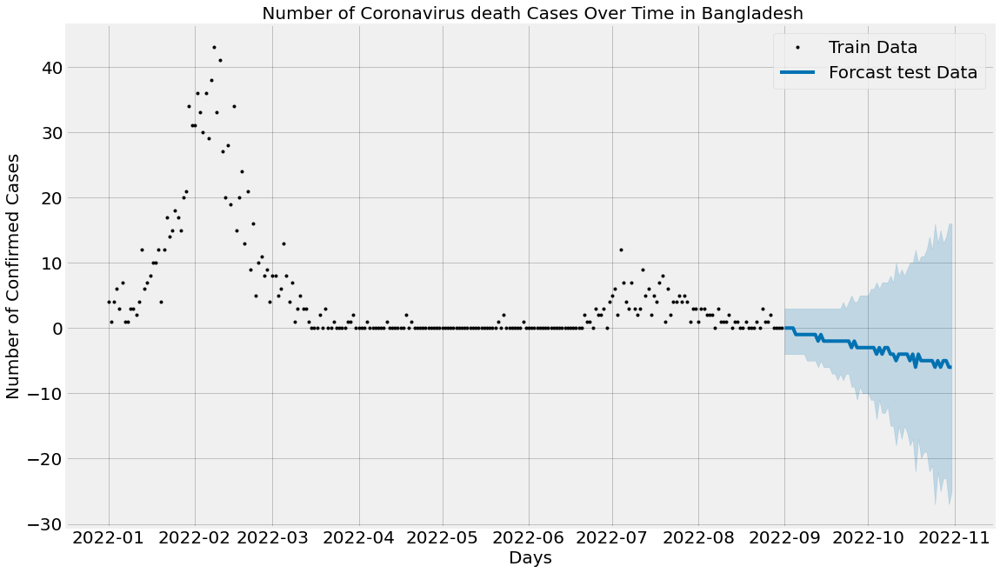

DEBUG:cmdstanpy:input tempfile: /tmp/tmpox279url/_d20jfs6.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpox279url/phuh_6b1.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=61228', 'data', 'file=/tmp/tmpox279url/_d20jfs6.json', 'init=/tmp/tmpox279url/phuh_6b1.json', 'output', 'file=/tmp/tmpox279url/prophet_modelhlnzdu14/prophet_model-20221202054650.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
05:46:50 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
05:46:50 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


r2_score=  0.8925949262300398
mean_squared_error= 6.970394736842105
mean_absolute_error= 1.582236842105263
Root mean_squared_error= 2.6401505140506867


<ipython-input-6-26071f48e5ba>:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  forecast[forecast['yhat'] < 0]['yhat'] = 0


<Figure size 1296x1080 with 0 Axes>

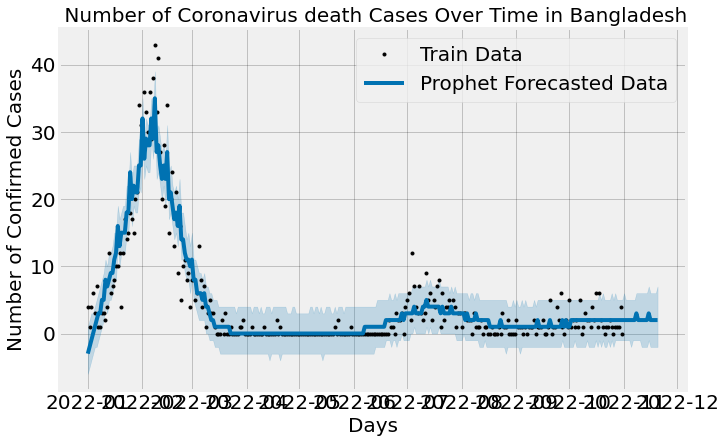

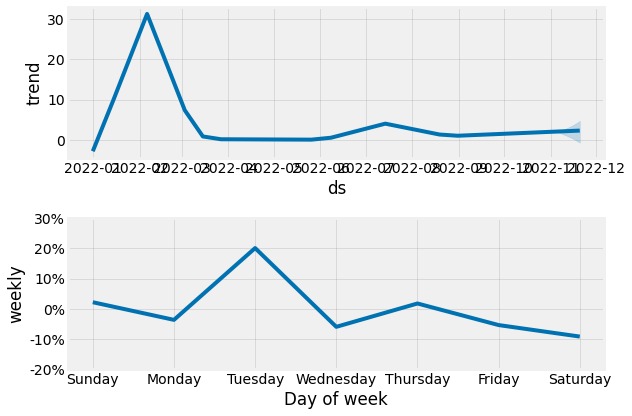

In [45]:
forecastedBangladesh=DeathForcast(dfDeathBangladesh,' Number of Coronavirus death Cases Over Time in Bangladesh')

DEBUG:cmdstanpy:input tempfile: /tmp/tmpox279url/q6awo_83.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpox279url/kfr3is0a.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=75719', 'data', 'file=/tmp/tmpox279url/q6awo_83.json', 'init=/tmp/tmpox279url/kfr3is0a.json', 'output', 'file=/tmp/tmpox279url/prophet_modelrym0mf0q/prophet_model-20221202054652.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
05:46:52 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
05:46:52 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpox279url/xnwe_4h5.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpox279url/1a6zsk0n.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/l

r2_score=  0.8970046673428225
mean_squared_error= 6.684210526315789
mean_absolute_error= 1.5526315789473684
Root mean_squared_error= 2.585384019118976


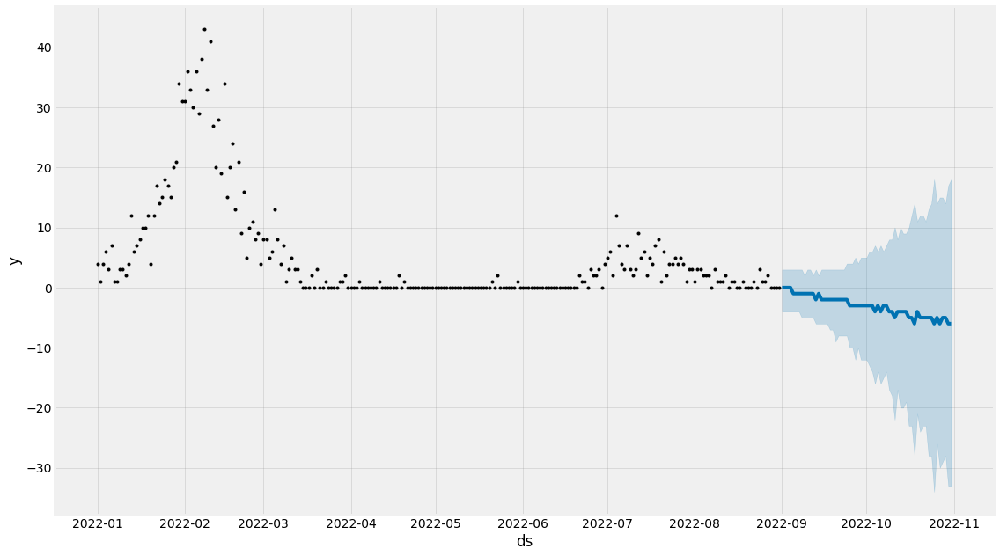

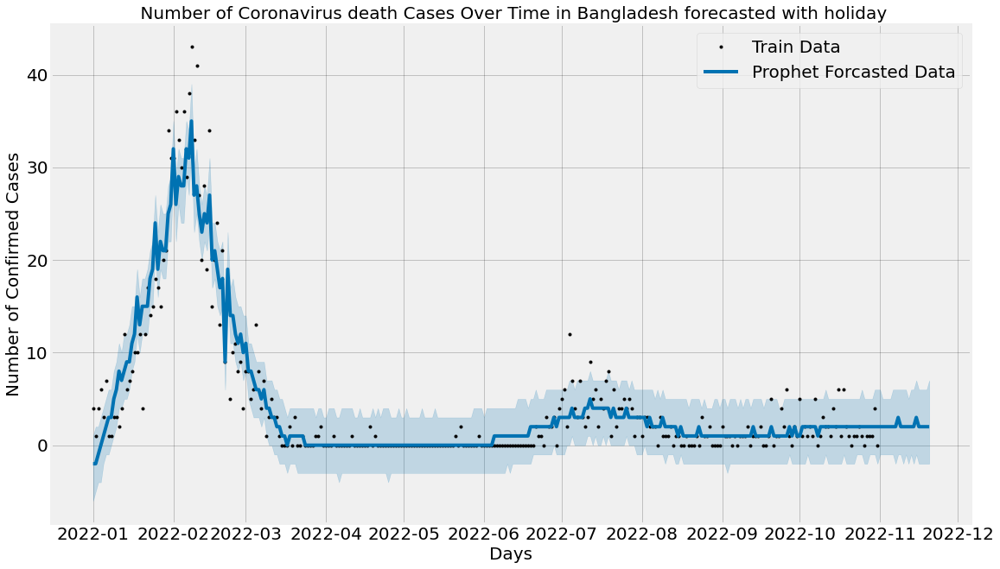

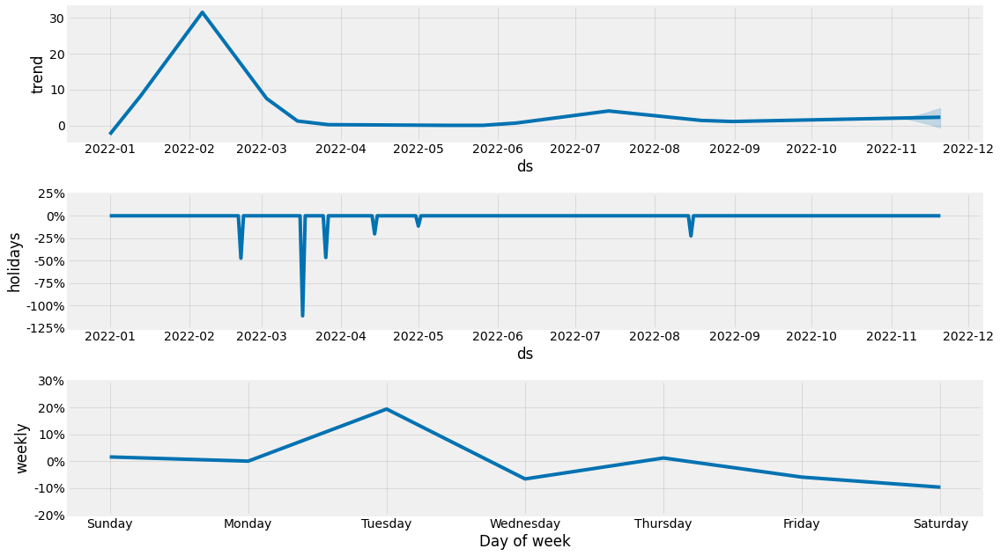

In [46]:
forecastedBangladesh_holidays=DeathForcast_holidays(dfDeathBangladesh,' Number of Coronavirus death Cases Over Time in Bangladesh forecasted with holiday','Bangladesh','Bangladesh')

In [47]:
f=forecastedBanglasesh[304:]
f =f [['ds','yhat', 'yhat_lower',  'yhat_upper']]

f.rename(columns = {'ds':'Date','yhat':'Confirm', 'yhat_lower':'Confirm_Lower', 'yhat_upper':'Confirm_Upper'}, inplace = True)
f

,Date,Confirm,Confirm_Lower,Confirm_Upper
304,2022-11-01,77,-202,369
305,2022-11-02,59,-236,368
306,2022-11-03,43,-254,380
307,2022-11-04,23,-339,352
308,2022-11-05,5,-317,393
309,2022-11-06,8,-406,377
310,2022-11-07,27,-545,452
311,2022-11-08,45,-648,601
312,2022-11-09,62,-804,727
313,2022-11-10,81,-1034,886


In [48]:
f=forecastedBangladesh_holidays[304:]
f =f [['ds','yhat', 'yhat_lower',  'yhat_upper']]

f.rename(columns = {'ds':'Date','yhat':'Confirm', 'yhat_lower':'Confirm_Lower', 'yhat_upper':'Confirm_Upper'}, inplace = True)
f

,Date,Confirm,Confirm_Lower,Confirm_Upper
304,2022-11-01,2,-1,6
305,2022-11-02,2,-1,5
306,2022-11-03,2,-1,5
307,2022-11-04,2,-1,5
308,2022-11-05,2,-1,5
309,2022-11-06,2,-1,6
310,2022-11-07,2,-2,6
311,2022-11-08,3,-1,6
312,2022-11-09,2,-1,6
313,2022-11-10,2,-2,6


**Japan**

DEBUG:cmdstanpy:input tempfile: /tmp/tmpox279url/sb9cmcbv.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpox279url/8f3c06ao.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=51606', 'data', 'file=/tmp/tmpox279url/sb9cmcbv.json', 'init=/tmp/tmpox279url/8f3c06ao.json', 'output', 'file=/tmp/tmpox279url/prophet_modelidssgi4c/prophet_model-20221202054655.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
05:46:55 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
05:46:55 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


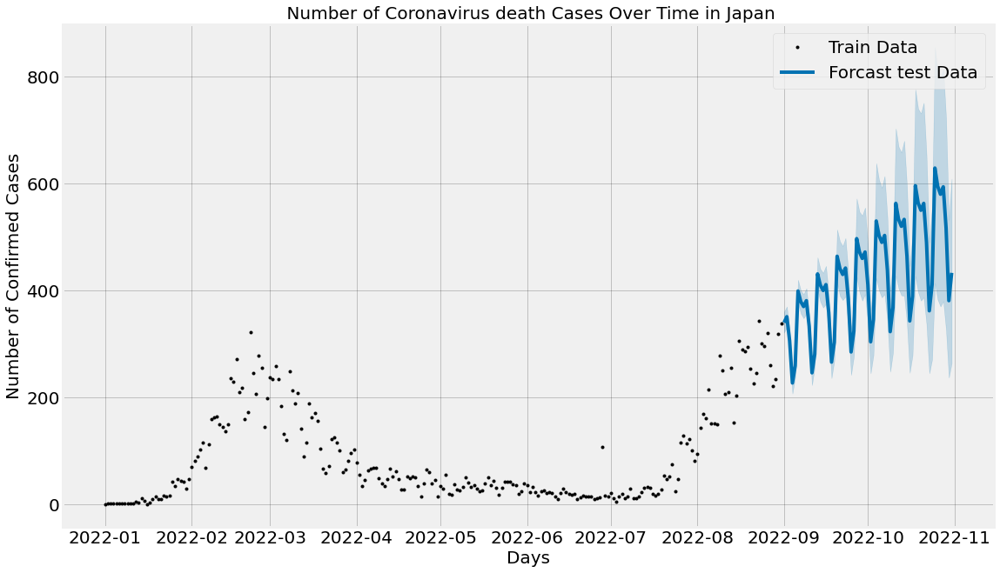

DEBUG:cmdstanpy:input tempfile: /tmp/tmpox279url/x16t4f80.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpox279url/e841zanj.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=35430', 'data', 'file=/tmp/tmpox279url/x16t4f80.json', 'init=/tmp/tmpox279url/e841zanj.json', 'output', 'file=/tmp/tmpox279url/prophet_model0q9rt9zz/prophet_model-20221202054656.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
05:46:56 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
05:46:56 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


r2_score=  0.9636311711197227
mean_squared_error= 278.61842105263156
mean_absolute_error= 11.828947368421053
Root mean_squared_error= 16.69186691333931


<ipython-input-6-26071f48e5ba>:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  forecast[forecast['yhat'] < 0]['yhat'] = 0


<Figure size 1296x1080 with 0 Axes>

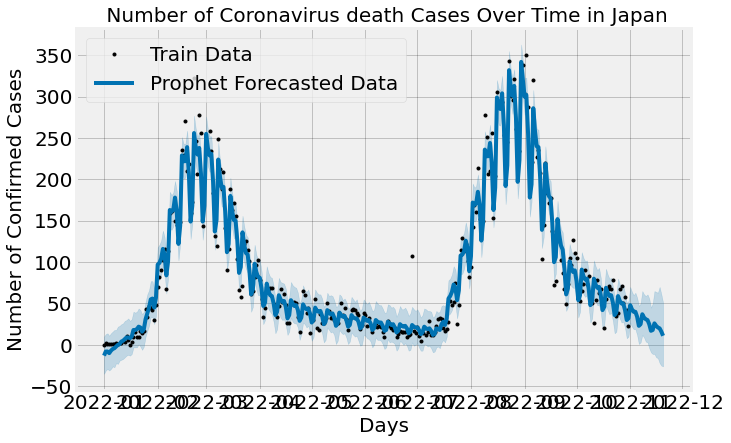

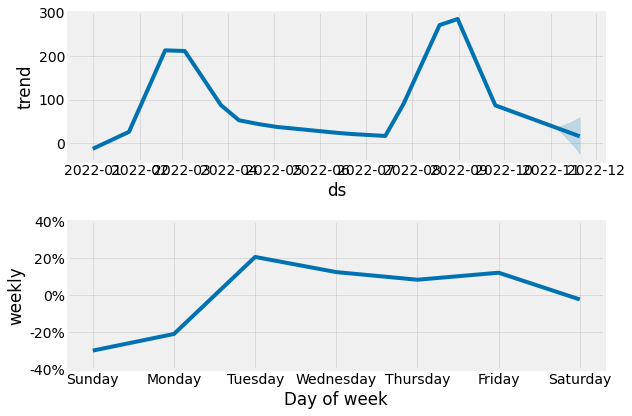

In [49]:
forecastedJapan=DeathForcast(dfDeathJapan,' Number of Coronavirus death Cases Over Time in Japan')

DEBUG:cmdstanpy:input tempfile: /tmp/tmpox279url/740xrz5f.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpox279url/__40xex_.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=83461', 'data', 'file=/tmp/tmpox279url/740xrz5f.json', 'init=/tmp/tmpox279url/__40xex_.json', 'output', 'file=/tmp/tmpox279url/prophet_modelrz4siyd_/prophet_model-20221202054658.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
05:46:58 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
05:46:58 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpox279url/z9mnuxlc.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpox279url/v2cnfpet.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/l

r2_score=  0.96582961744637
mean_squared_error= 261.7763157894737
mean_absolute_error= 11.078947368421053
Root mean_squared_error= 16.179502952485088


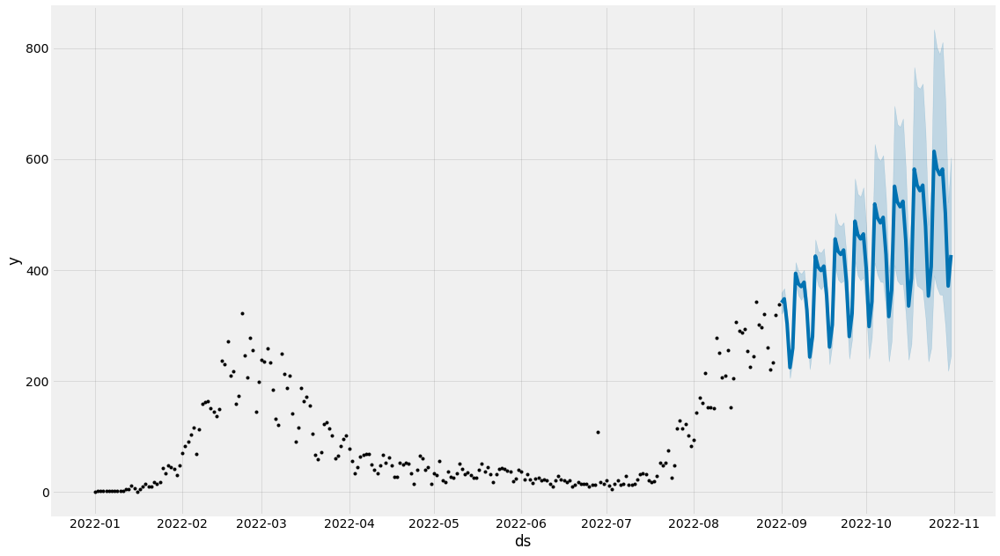

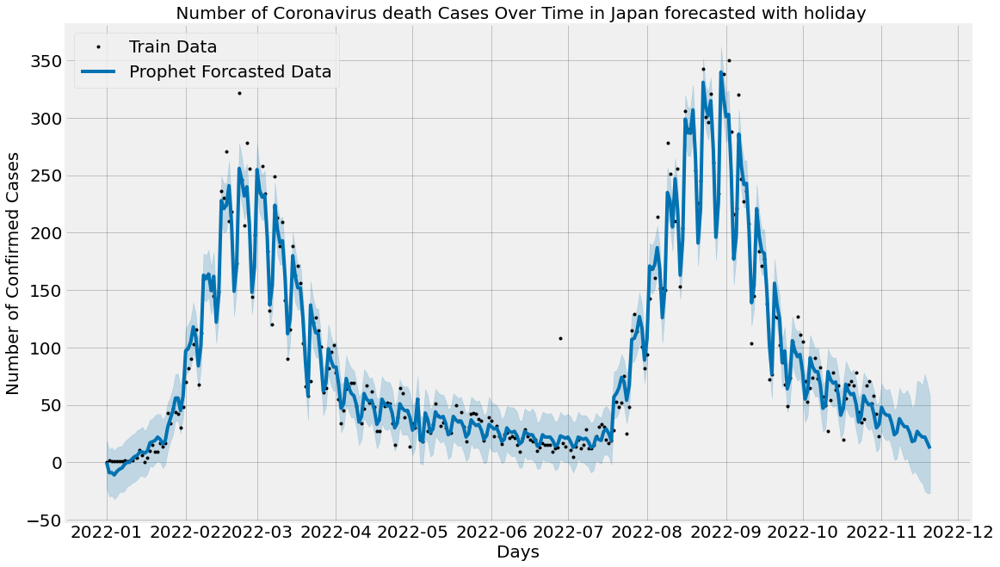

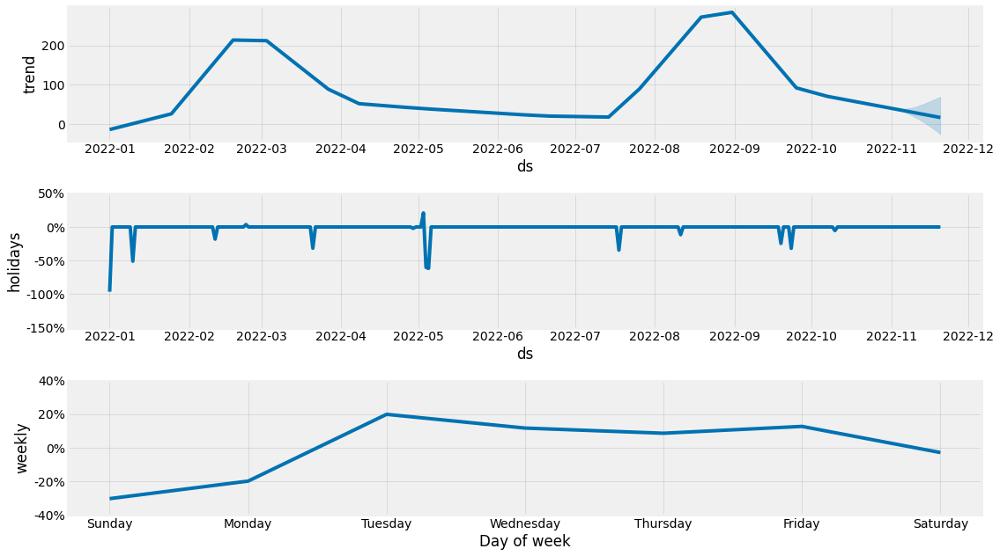

In [50]:
forecastedJapan_holidays=DeathForcast_holidays(dfDeathJapan,' Number of Coronavirus death Cases Over Time in Japan forecasted with holiday','Japan','Japan')

In [51]:
f=forecastedJapan[304:]
f =f [['ds','yhat', 'yhat_lower',  'yhat_upper']]

f.rename(columns = {'ds':'Date','yhat':'Confirm', 'yhat_lower':'Confirm_Lower', 'yhat_upper':'Confirm_Upper'}, inplace = True)
f

,Date,Confirm,Confirm_Lower,Confirm_Upper
304,2022-11-01,48,27,70
305,2022-11-02,43,22,64
306,2022-11-03,40,19,60
307,2022-11-04,40,19,63
308,2022-11-05,34,12,57
309,2022-11-06,23,1,47
310,2022-11-07,25,3,50
311,2022-11-08,37,12,65
312,2022-11-09,33,9,61
313,2022-11-10,31,4,59


In [52]:
f=forecastedJapan_holidays[304:]
f =f [['ds','yhat', 'yhat_lower',  'yhat_upper']]

f.rename(columns = {'ds':'Date','yhat':'Confirm', 'yhat_lower':'Confirm_Lower', 'yhat_upper':'Confirm_Upper'}, inplace = True)
f

,Date,Confirm,Confirm_Lower,Confirm_Upper
304,2022-11-01,48,28,69
305,2022-11-02,43,21,64
306,2022-11-03,41,19,63
307,2022-11-04,41,20,64
308,2022-11-05,34,13,56
309,2022-11-06,24,2,45
310,2022-11-07,26,3,49
311,2022-11-08,38,16,65
312,2022-11-09,34,9,60
313,2022-11-10,31,2,60


**France**

DEBUG:cmdstanpy:input tempfile: /tmp/tmpox279url/4aoq0ccp.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpox279url/p3dczfea.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=23879', 'data', 'file=/tmp/tmpox279url/4aoq0ccp.json', 'init=/tmp/tmpox279url/p3dczfea.json', 'output', 'file=/tmp/tmpox279url/prophet_model6h91ot66/prophet_model-20221202054701.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
05:47:01 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
05:47:01 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


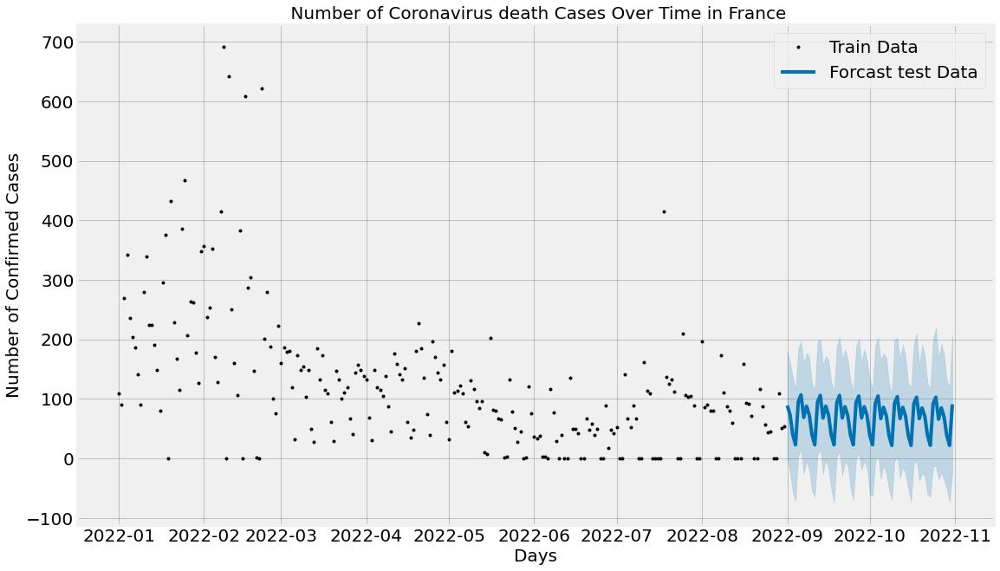

DEBUG:cmdstanpy:input tempfile: /tmp/tmpox279url/292_inul.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpox279url/q9nh86pk.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=19333', 'data', 'file=/tmp/tmpox279url/292_inul.json', 'init=/tmp/tmpox279url/q9nh86pk.json', 'output', 'file=/tmp/tmpox279url/prophet_model3ikvtlgm/prophet_model-20221202054702.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
05:47:02 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
05:47:02 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


r2_score=  0.6410719024440668
mean_squared_error= 4356.243421052632
mean_absolute_error= 38.151315789473685
Root mean_squared_error= 66.0018440731214


<Figure size 1296x1080 with 0 Axes>

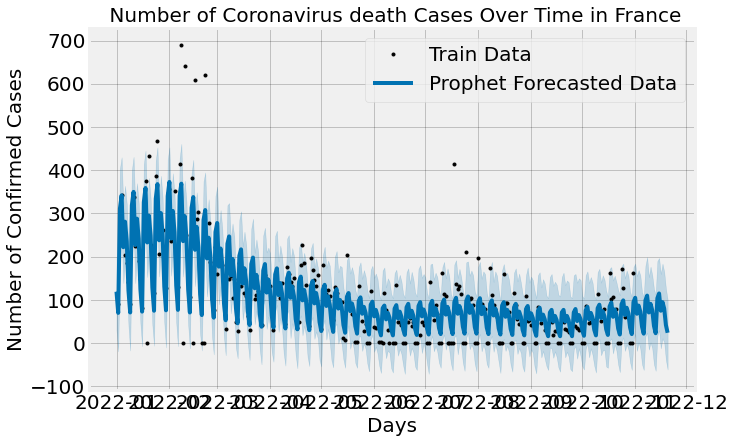

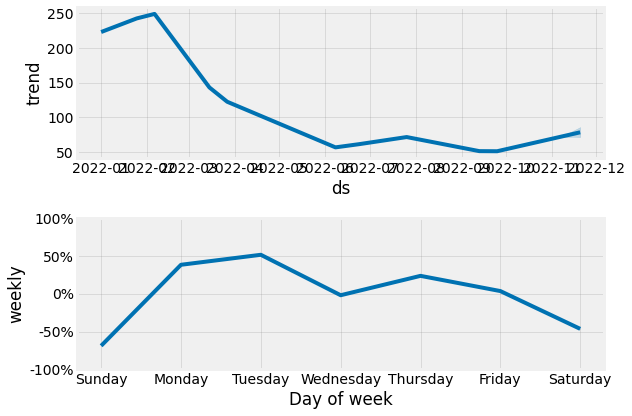

In [53]:
forecastedFrance=DeathForcast(dfDeathFrance,' Number of Coronavirus death Cases Over Time in France')

DEBUG:cmdstanpy:input tempfile: /tmp/tmpox279url/639qhvju.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpox279url/o3tw83g7.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=10662', 'data', 'file=/tmp/tmpox279url/639qhvju.json', 'init=/tmp/tmpox279url/o3tw83g7.json', 'output', 'file=/tmp/tmpox279url/prophet_model4l3n99l1/prophet_model-20221202054704.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
05:47:04 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
05:47:04 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpox279url/hezz6br1.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpox279url/kesyaxik.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/l

r2_score=  0.6553680656654737
mean_squared_error= 4182.733552631579
mean_absolute_error= 36.85197368421053
Root mean_squared_error= 64.67405625621126


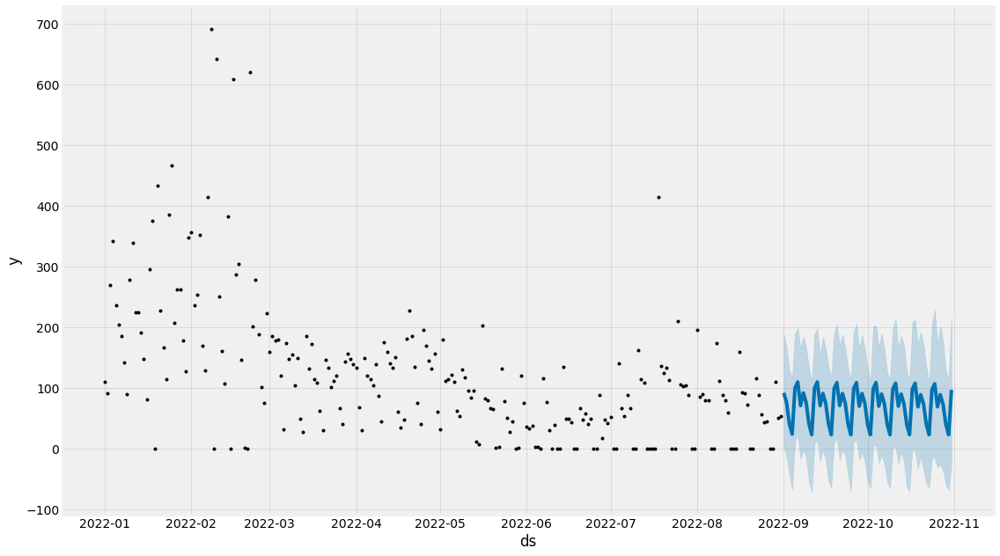

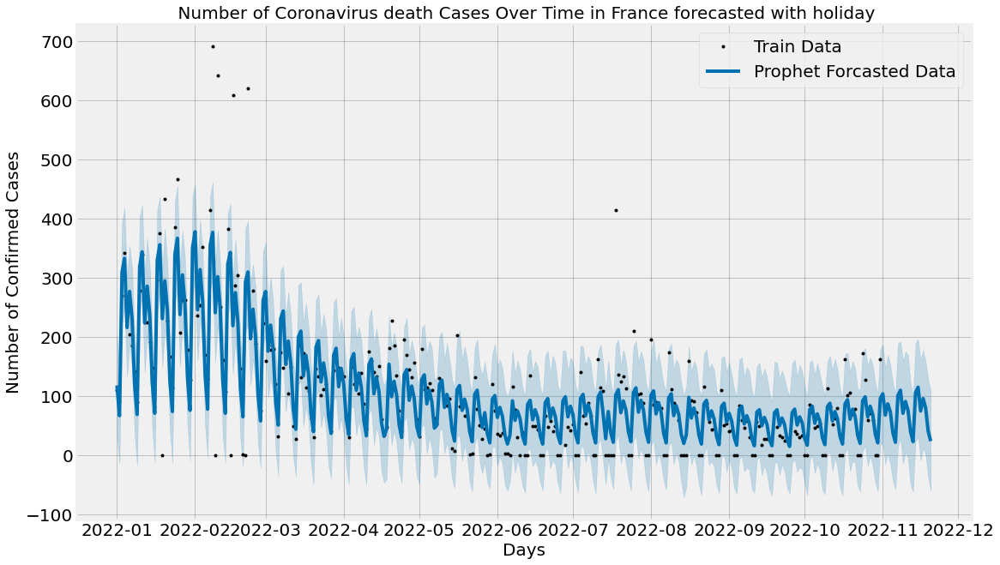

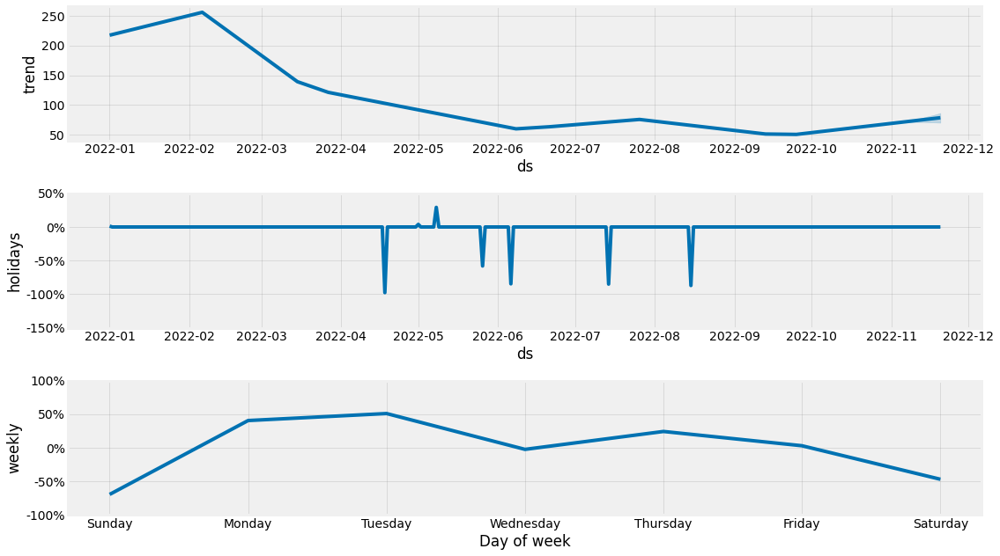

In [54]:
forecastedFrance_holidays=DeathForcast_holidays(dfDeathFrance,' Number of Coronavirus death Cases Over Time in France forecasted with holiday','France','France')

In [55]:
f=forecastedFrance[304:]
f =f [['ds','yhat', 'yhat_lower',  'yhat_upper']]

f.rename(columns = {'ds':'Date','yhat':'Confirm', 'yhat_lower':'Confirm_Lower', 'yhat_upper':'Confirm_Upper'}, inplace = True)
f

,Date,Confirm,Confirm_Lower,Confirm_Upper
304,2022-11-01,105,21,184
305,2022-11-02,68,-18,155
306,2022-11-03,87,2,169
307,2022-11-04,73,-13,157
308,2022-11-05,38,-49,118
309,2022-11-06,22,-62,107
310,2022-11-07,99,16,179
311,2022-11-08,110,24,199
312,2022-11-09,71,-15,153
313,2022-11-10,91,2,177


In [56]:
f=forecastedFrance_holidays[304:]
f =f [['ds','yhat', 'yhat_lower',  'yhat_upper']]

f.rename(columns = {'ds':'Date','yhat':'Confirm', 'yhat_lower':'Confirm_Lower', 'yhat_upper':'Confirm_Upper'}, inplace = True)
f

,Date,Confirm,Confirm_Lower,Confirm_Upper
304,2022-11-01,104,19,188
305,2022-11-02,68,-15,146
306,2022-11-03,87,3,170
307,2022-11-04,73,-16,153
308,2022-11-05,38,-43,123
309,2022-11-06,22,-58,102
310,2022-11-07,101,14,189
311,2022-11-08,110,29,192
312,2022-11-09,71,-15,160
313,2022-11-10,91,6,175


**Germany**

DEBUG:cmdstanpy:input tempfile: /tmp/tmpox279url/_l99tfdl.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpox279url/dne8uhqf.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=72047', 'data', 'file=/tmp/tmpox279url/_l99tfdl.json', 'init=/tmp/tmpox279url/dne8uhqf.json', 'output', 'file=/tmp/tmpox279url/prophet_modeloriduvww/prophet_model-20221202054707.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
05:47:07 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
05:47:07 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


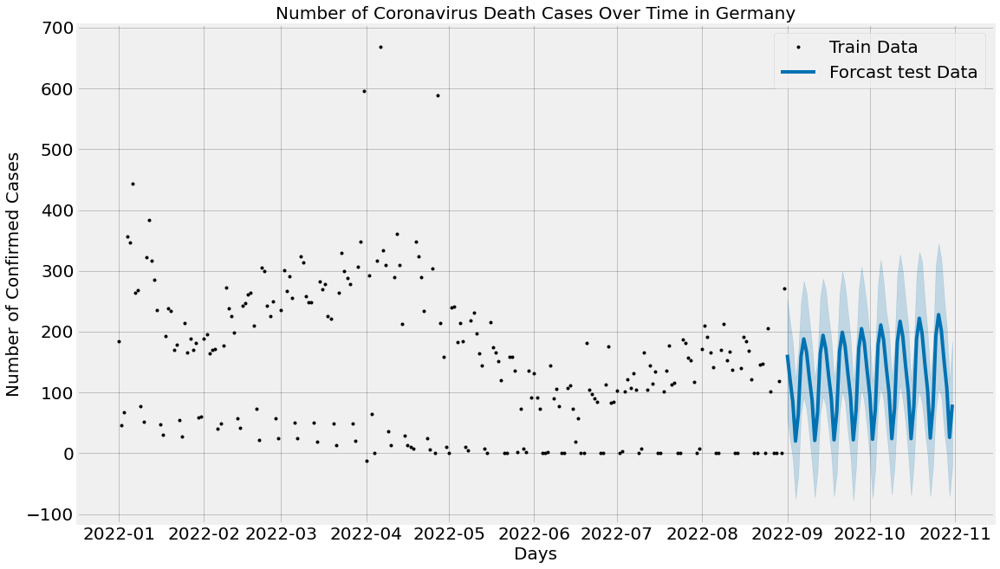

DEBUG:cmdstanpy:input tempfile: /tmp/tmpox279url/cc806jqa.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpox279url/rkl9dnzt.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=51008', 'data', 'file=/tmp/tmpox279url/cc806jqa.json', 'init=/tmp/tmpox279url/rkl9dnzt.json', 'output', 'file=/tmp/tmpox279url/prophet_modelazsc3kwb/prophet_model-20221202054708.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
05:47:08 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
05:47:08 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


r2_score=  0.5915378543728469
mean_squared_error= 5315.480263157895
mean_absolute_error= 53.26315789473684
Root mean_squared_error= 72.90734025568273


<Figure size 1296x1080 with 0 Axes>

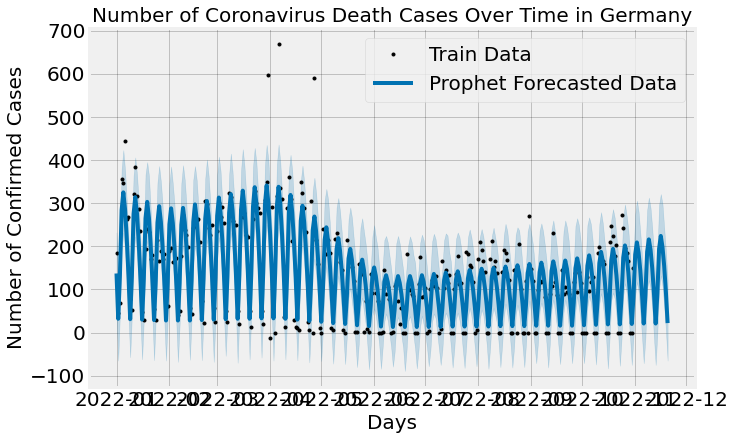

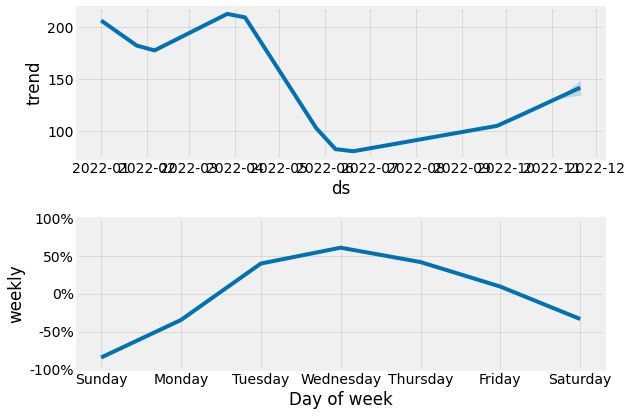

In [57]:
forecastedGermany=DeathForcast(dfDeathGermany,'Number of Coronavirus Death Cases Over Time in Germany')

DEBUG:cmdstanpy:input tempfile: /tmp/tmpox279url/ctb9rdg8.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpox279url/twi3pngf.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=8451', 'data', 'file=/tmp/tmpox279url/ctb9rdg8.json', 'init=/tmp/tmpox279url/twi3pngf.json', 'output', 'file=/tmp/tmpox279url/prophet_model1kgtf23k/prophet_model-20221202054710.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
05:47:10 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
05:47:10 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpox279url/meb8y951.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpox279url/7l528ddc.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/li

r2_score=  0.6172358139762478
mean_squared_error= 4981.0625
mean_absolute_error= 50.94407894736842
Root mean_squared_error= 70.57664273681485


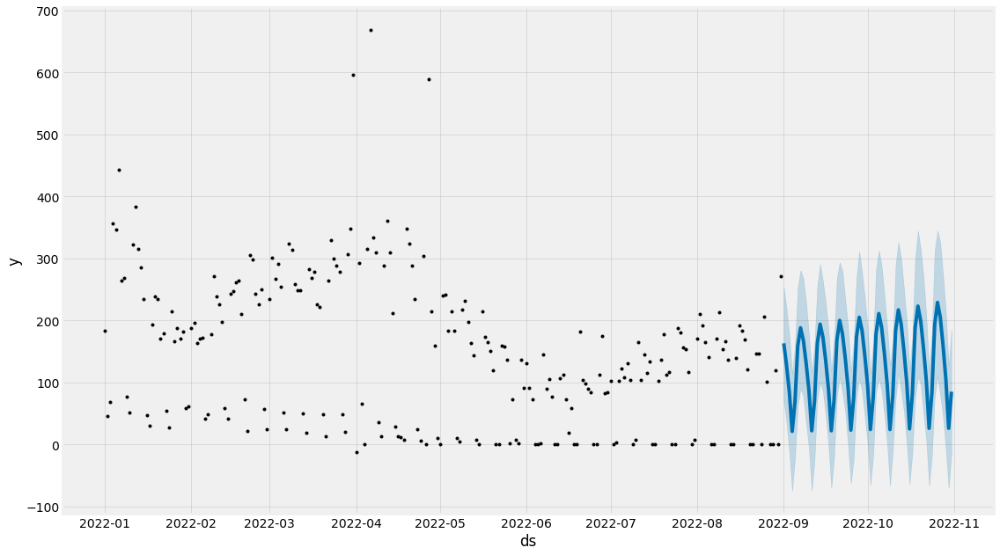

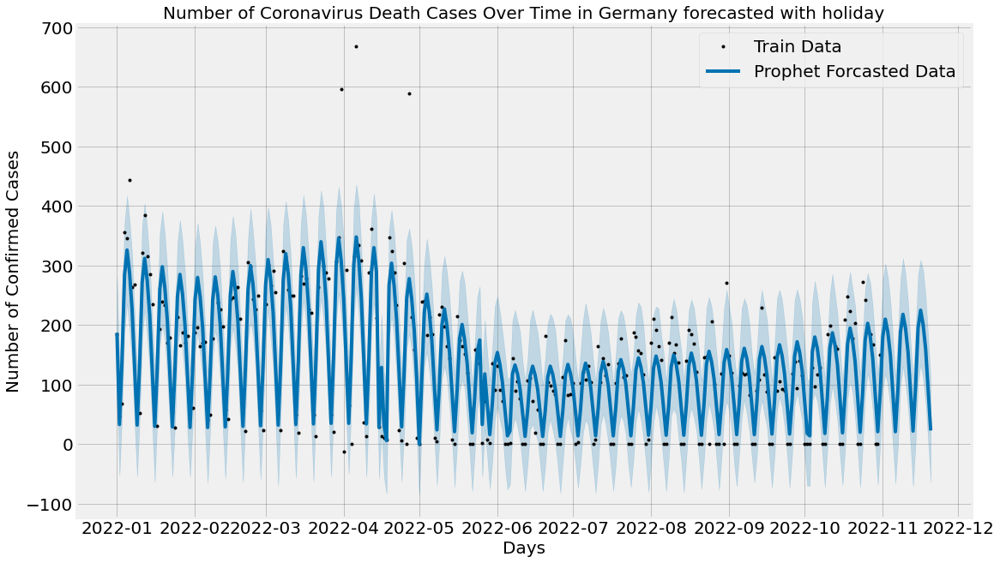

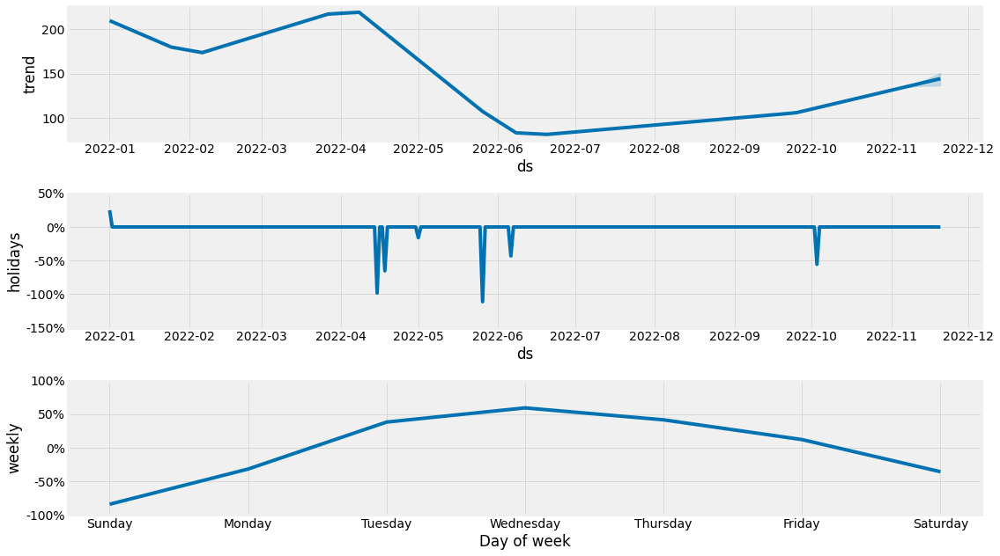

In [58]:
forecastedGermany_holiday=DeathForcast_holidays(dfDeathGermany,'Number of Coronavirus Death Cases Over Time in Germany forecasted with holiday','Germany','Germany')

In [59]:
f=forecastedGermany[304:]
f =f [['ds','yhat', 'yhat_lower',  'yhat_upper']]

f.rename(columns = {'ds':'Date','yhat':'Confirm', 'yhat_lower':'Confirm_Lower', 'yhat_upper':'Confirm_Upper'}, inplace = True)
f

,Date,Confirm,Confirm_Lower,Confirm_Upper
304,2022-11-01,181,85,274
305,2022-11-02,209,117,306
306,2022-11-03,185,95,280
307,2022-11-04,144,47,231
308,2022-11-05,88,-10,178
309,2022-11-06,21,-71,120
310,2022-11-07,87,-11,187
311,2022-11-08,187,104,284
312,2022-11-09,216,121,313
313,2022-11-10,192,101,289


In [60]:
f=forecastedGermany_holiday[304:]
f =f [['ds','yhat', 'yhat_lower',  'yhat_upper']]

f.rename(columns = {'ds':'Date','yhat':'Confirm', 'yhat_lower':'Confirm_Lower', 'yhat_upper':'Confirm_Upper'}, inplace = True)
f

,Date,Confirm,Confirm_Lower,Confirm_Upper
304,2022-11-01,181,93,277
305,2022-11-02,210,118,303
306,2022-11-03,188,99,281
307,2022-11-04,150,64,240
308,2022-11-05,86,-1,180
309,2022-11-06,21,-66,112
310,2022-11-07,92,-3,181
311,2022-11-08,188,97,277
312,2022-11-09,218,131,312
313,2022-11-10,195,101,286


**Italy**

DEBUG:cmdstanpy:input tempfile: /tmp/tmpox279url/gnnnxci0.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpox279url/m9ee2fvh.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=56967', 'data', 'file=/tmp/tmpox279url/gnnnxci0.json', 'init=/tmp/tmpox279url/m9ee2fvh.json', 'output', 'file=/tmp/tmpox279url/prophet_model8eaz0uxh/prophet_model-20221202054713.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
05:47:13 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
05:47:13 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
<ipython-input-6-26071f48e5ba>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata

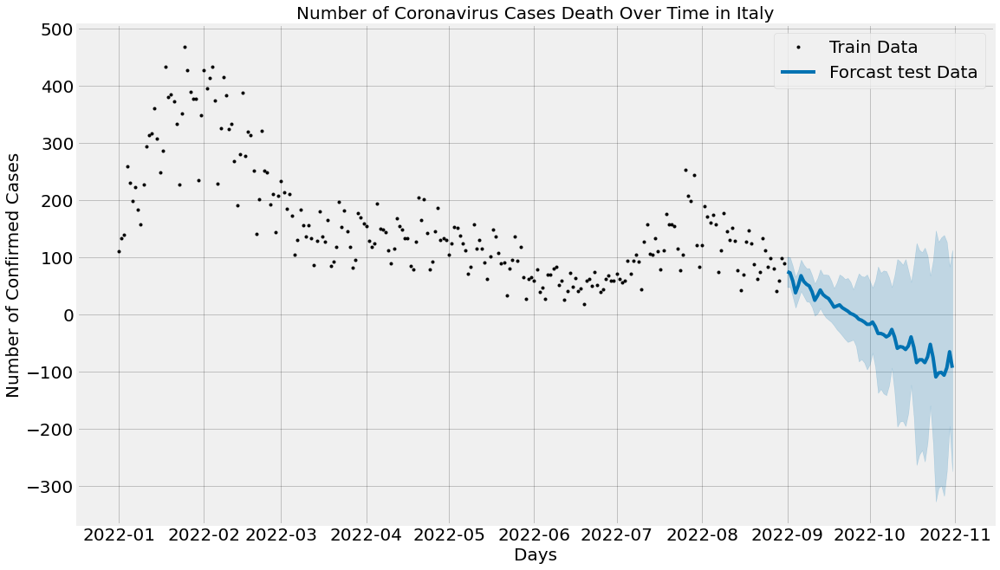

DEBUG:cmdstanpy:input tempfile: /tmp/tmpox279url/iw9vqct6.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpox279url/8jq1mpom.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=56877', 'data', 'file=/tmp/tmpox279url/iw9vqct6.json', 'init=/tmp/tmpox279url/8jq1mpom.json', 'output', 'file=/tmp/tmpox279url/prophet_model6u1l1czc/prophet_model-20221202054714.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
05:47:14 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
05:47:14 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


r2_score=  0.9579063514781025
mean_squared_error= 401.16776315789474
mean_absolute_error= 14.970394736842104
Root mean_squared_error= 20.029172802637024


<Figure size 1296x1080 with 0 Axes>

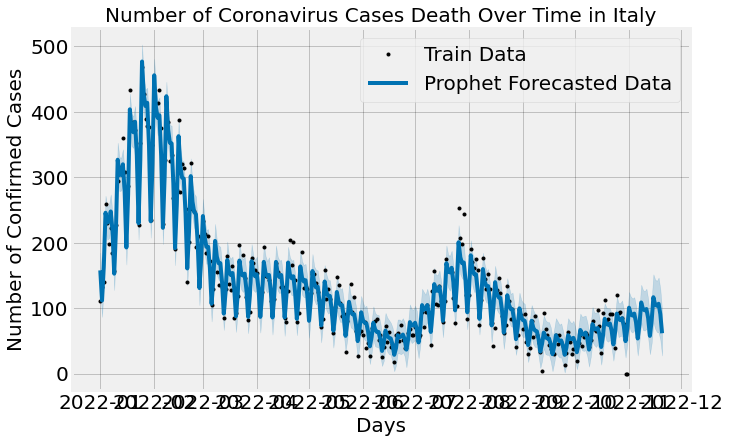

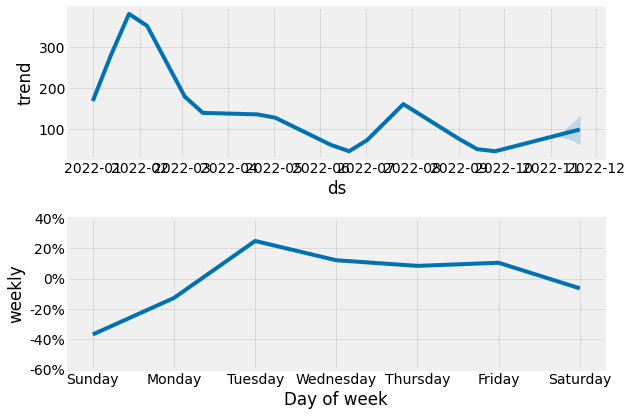

In [61]:
forecastedItaly=DeathForcast(dfDeathItaly,'Number of Coronavirus Cases Death Over Time in Italy')

DEBUG:cmdstanpy:input tempfile: /tmp/tmpox279url/8h_hj52o.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpox279url/x95q58dy.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=93126', 'data', 'file=/tmp/tmpox279url/8h_hj52o.json', 'init=/tmp/tmpox279url/x95q58dy.json', 'output', 'file=/tmp/tmpox279url/prophet_model43l4oq8m/prophet_model-20221202054716.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
05:47:16 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
05:47:16 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
<ipython-input-7-4670115c8529>:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata

r2_score=  0.961085249455936
mean_squared_error= 370.8717105263158
mean_absolute_error= 14.082236842105264
Root mean_squared_error= 19.258029767510376


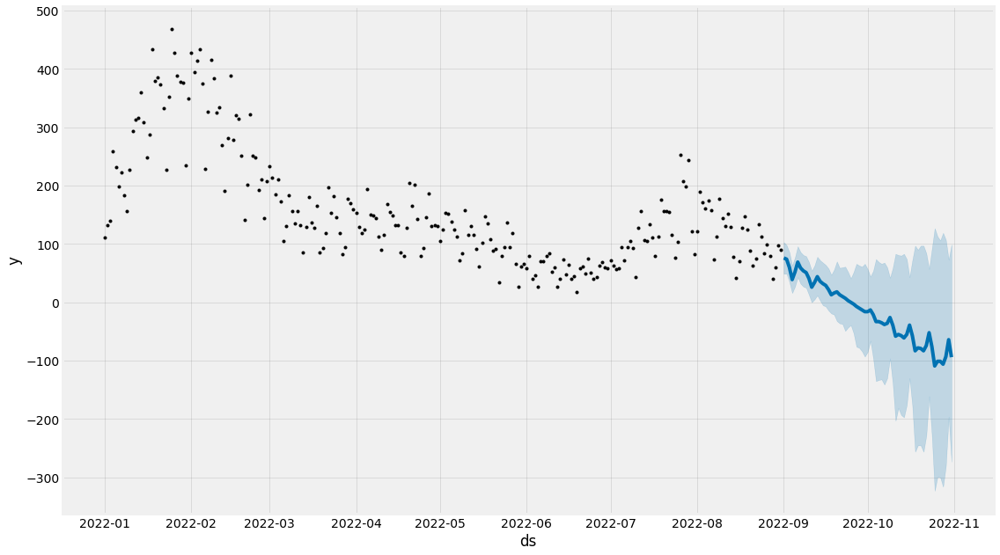

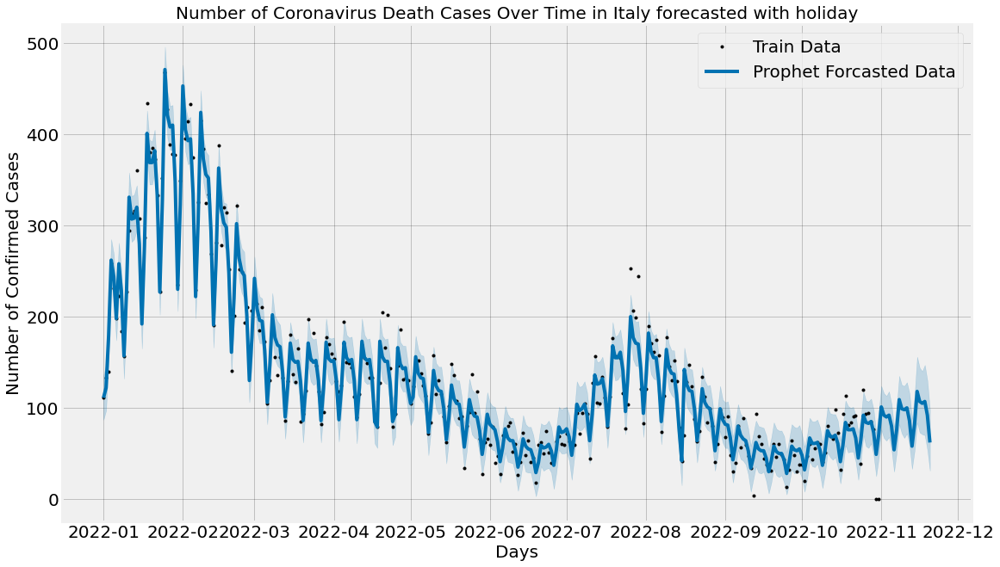

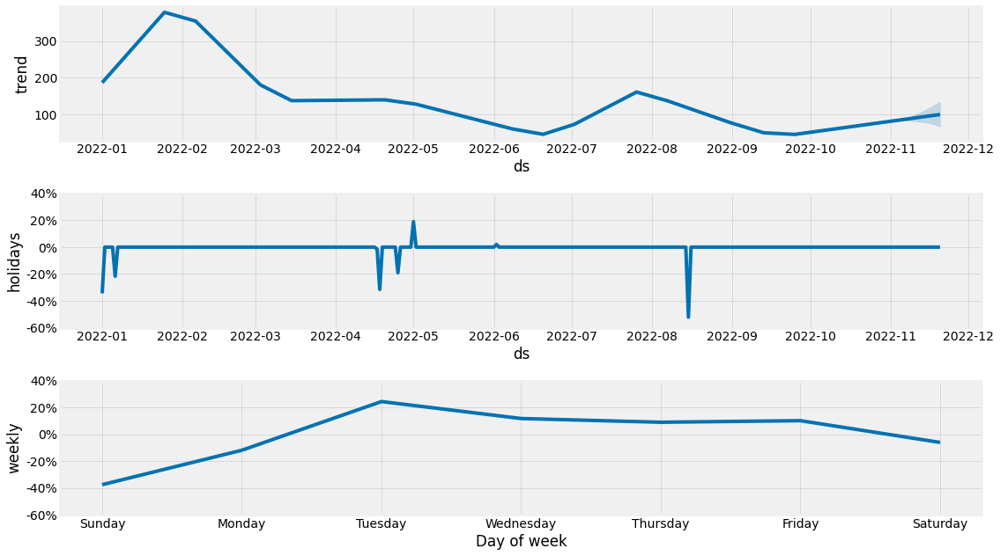

In [62]:
forecastedItaly_holiday=DeathForcast_holidays(dfDeathItaly,'Number of Coronavirus Death Cases Over Time in Italy forecasted with holiday','IT','IT')

In [63]:
f=forecastedItaly[304:]
f =f [['ds','yhat', 'yhat_lower',  'yhat_upper']]

f.rename(columns = {'ds':'Date','yhat':'Confirm', 'yhat_lower':'Confirm_Lower', 'yhat_upper':'Confirm_Upper'}, inplace = True)
f

/usr/local/lib/python3.8/dist-packages/pandas/core/frame.py:5039: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().rename(


,Date,Confirm,Confirm_Lower,Confirm_Upper
304,2022-11-01,101,75,125
305,2022-11-02,91,65,118
306,2022-11-03,89,63,115
307,2022-11-04,92,67,117
308,2022-11-05,79,52,104
309,2022-11-06,54,28,80
310,2022-11-07,75,50,101
311,2022-11-08,109,79,136
312,2022-11-09,99,67,128
313,2022-11-10,97,66,126


In [64]:
f=forecastedItaly_holiday[304:]
f =f [['ds','yhat', 'yhat_lower',  'yhat_upper']]

f.rename(columns = {'ds':'Date','yhat':'Confirm', 'yhat_lower':'Confirm_Lower', 'yhat_upper':'Confirm_Upper'}, inplace = True)
f

,Date,Confirm,Confirm_Lower,Confirm_Upper
304,2022-11-01,101,76,124
305,2022-11-02,92,67,116
306,2022-11-03,90,64,113
307,2022-11-04,92,68,118
308,2022-11-05,80,54,104
309,2022-11-06,54,30,79
310,2022-11-07,76,51,101
311,2022-11-08,109,82,135
312,2022-11-09,99,72,125
313,2022-11-10,98,67,124


**Pakistan**

DEBUG:cmdstanpy:input tempfile: /tmp/tmpox279url/5kklj5sz.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpox279url/cktzn7k4.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=72753', 'data', 'file=/tmp/tmpox279url/5kklj5sz.json', 'init=/tmp/tmpox279url/cktzn7k4.json', 'output', 'file=/tmp/tmpox279url/prophet_modeloledj8ta/prophet_model-20221202054719.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
05:47:19 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
05:47:19 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


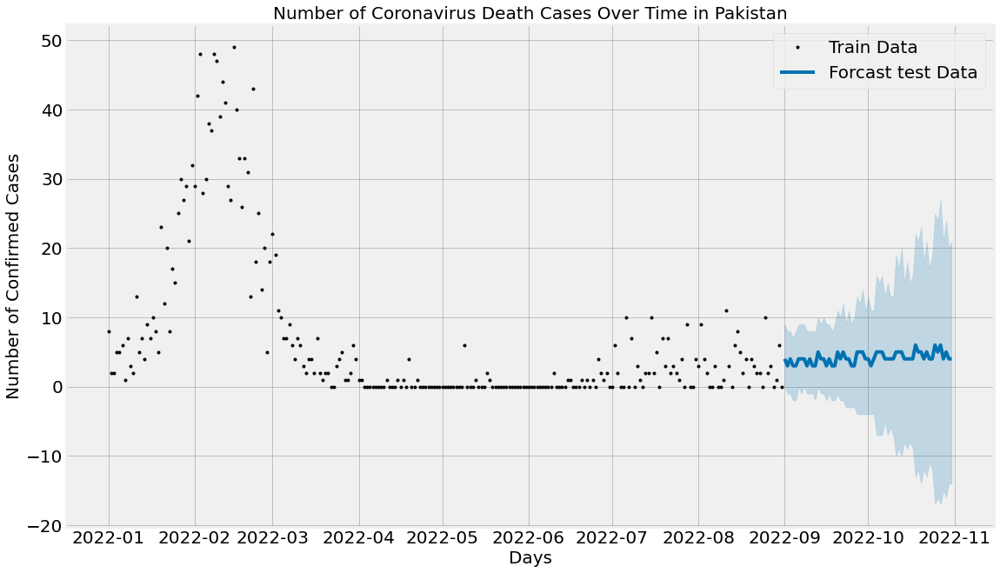

DEBUG:cmdstanpy:input tempfile: /tmp/tmpox279url/wog0ww98.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpox279url/a5bcvh5n.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=80434', 'data', 'file=/tmp/tmpox279url/wog0ww98.json', 'init=/tmp/tmpox279url/a5bcvh5n.json', 'output', 'file=/tmp/tmpox279url/prophet_modeli8jez_wv/prophet_model-20221202054720.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
05:47:20 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
05:47:20 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


r2_score=  0.8928265132466828
mean_squared_error= 11.654605263157896
mean_absolute_error= 2.1348684210526314
Root mean_squared_error= 3.4138841900623835


<ipython-input-6-26071f48e5ba>:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  forecast[forecast['yhat'] < 0]['yhat'] = 0


<Figure size 1296x1080 with 0 Axes>

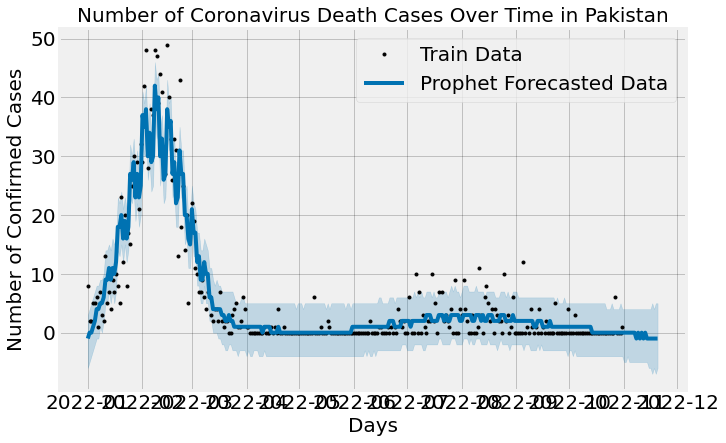

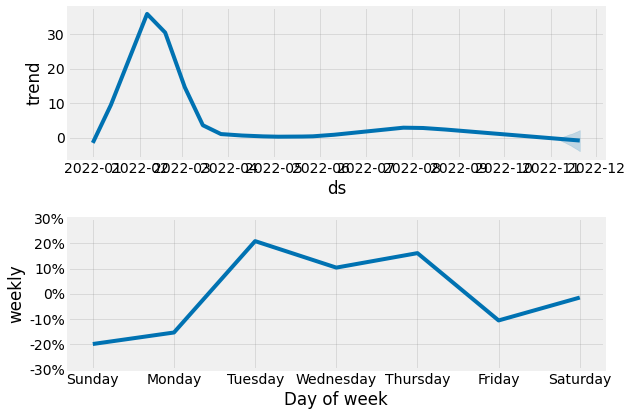

In [65]:
forecastedPakistan=DeathForcast(dfDeathPakistan,'Number of Coronavirus Death Cases Over Time in Pakistan')

DEBUG:cmdstanpy:input tempfile: /tmp/tmpox279url/w09uzidi.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpox279url/q8j3ihzi.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=50009', 'data', 'file=/tmp/tmpox279url/w09uzidi.json', 'init=/tmp/tmpox279url/q8j3ihzi.json', 'output', 'file=/tmp/tmpox279url/prophet_modelzwuneccy/prophet_model-20221202054722.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
05:47:22 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
05:47:22 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
<ipython-input-5-3d6ee0e4bd72>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata

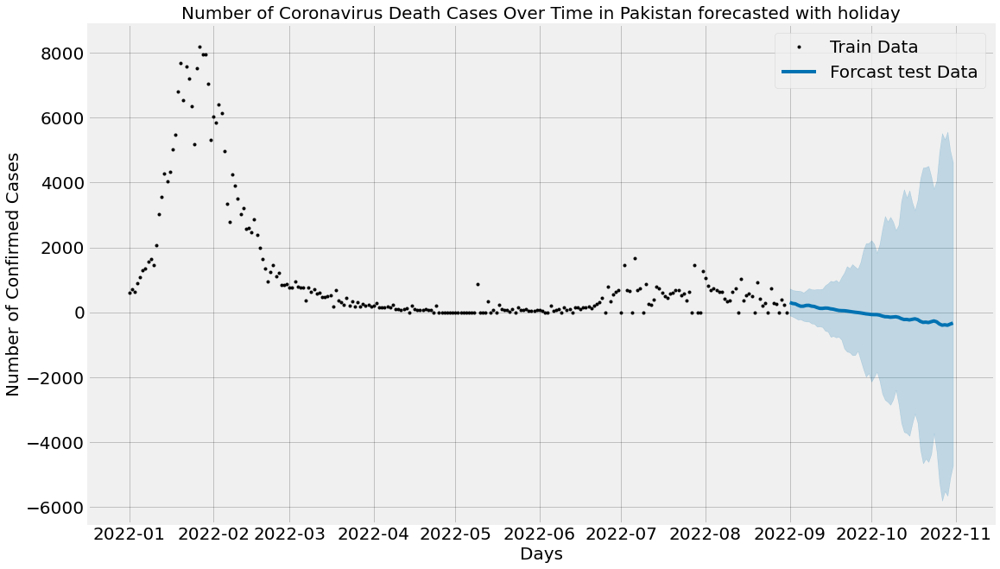

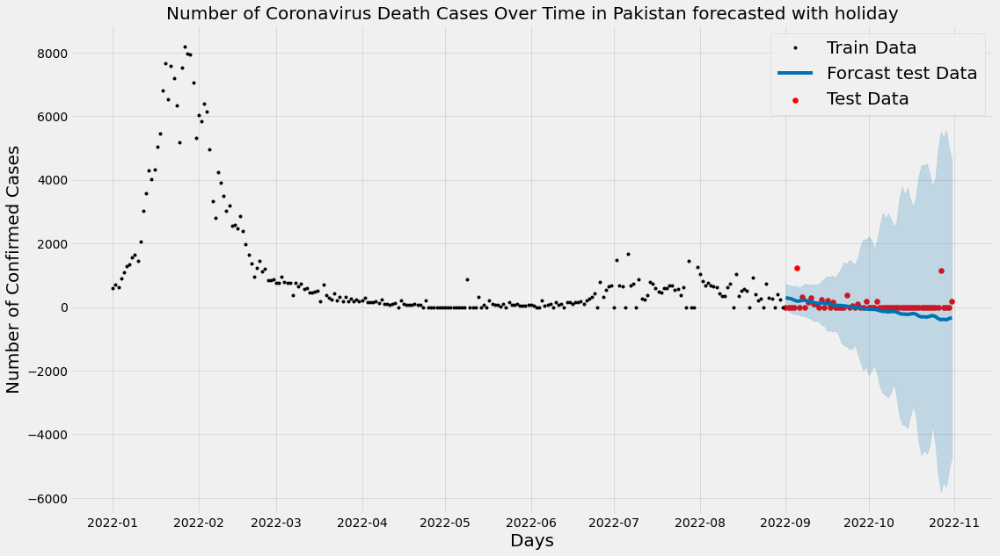

DEBUG:cmdstanpy:input tempfile: /tmp/tmpox279url/ysqczylk.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpox279url/k98k_h45.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=8133', 'data', 'file=/tmp/tmpox279url/ysqczylk.json', 'init=/tmp/tmpox279url/k98k_h45.json', 'output', 'file=/tmp/tmpox279url/prophet_modelxccqpngj/prophet_model-20221202054724.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
05:47:24 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
05:47:24 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
<ipython-input-5-3d6ee0e4bd72>:54: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.

r2_score=  0.9656806680381771
mean_squared_error= 101519.46710526316
mean_absolute_error= 193.6315789473684
Root mean_squared_error= 318.62119688630753


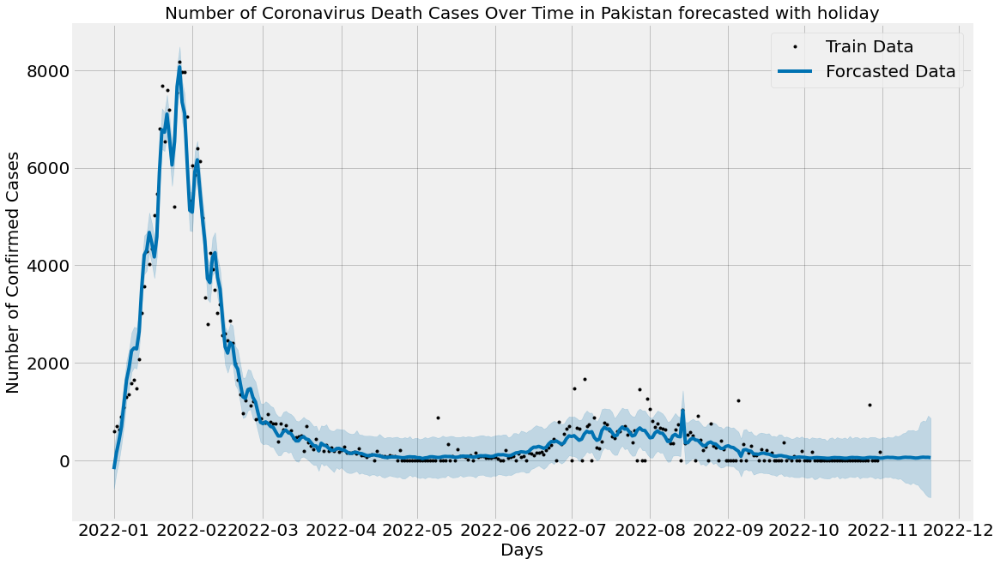

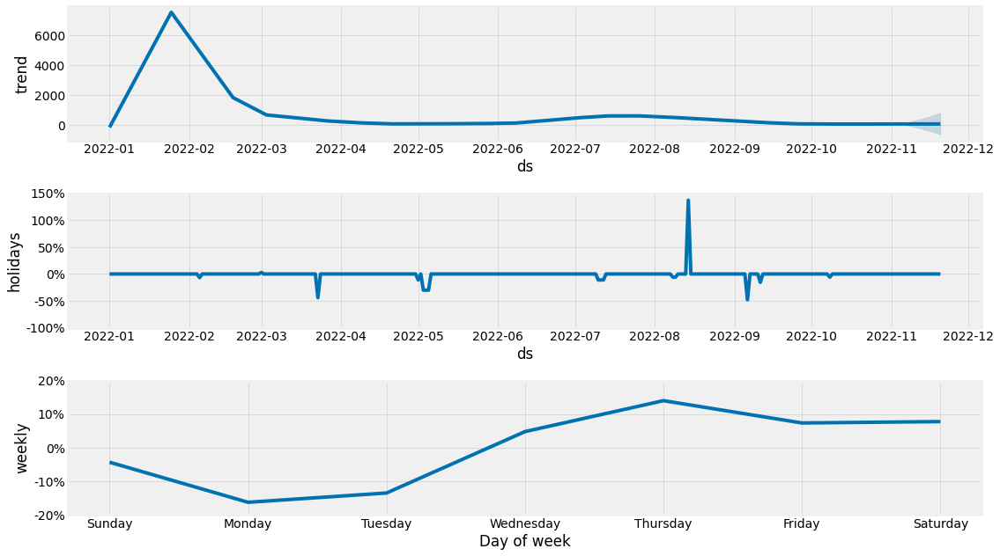

In [66]:
forecastedPakistan_holiday=confirmForcast_holidays(dfDeathPakistan,'Number of Coronavirus Death Cases Over Time in Pakistan forecasted with holiday','Pakistan','Pakistan')

In [67]:
f=forecastedPakistan[304:]
f =f [['ds','yhat', 'yhat_lower',  'yhat_upper']]

f.rename(columns = {'ds':'Date','yhat':'Confirm', 'yhat_lower':'Confirm_Lower', 'yhat_upper':'Confirm_Upper'}, inplace = True)
f

,Date,Confirm,Confirm_Lower,Confirm_Upper
304,2022-11-01,0,-5,4
305,2022-11-02,0,-5,4
306,2022-11-03,0,-4,4
307,2022-11-04,0,-5,4
308,2022-11-05,0,-5,4
309,2022-11-06,0,-5,4
310,2022-11-07,0,-5,4
311,2022-11-08,1,-5,4
312,2022-11-09,0,-5,4
313,2022-11-10,1,-5,4


In [68]:
f=forecastedPakistan_holiday[304:]
f =f [['ds','yhat', 'yhat_lower',  'yhat_upper']]

f.rename(columns = {'ds':'Date','yhat':'Confirm', 'yhat_lower':'Confirm_Lower', 'yhat_upper':'Confirm_Upper'}, inplace = True)
f

,Date,Confirm,Confirm_Lower,Confirm_Upper
304,2022-11-01,47,-357,473
305,2022-11-02,57,-341,453
306,2022-11-03,62,-347,483
307,2022-11-04,58,-339,471
308,2022-11-05,59,-366,468
309,2022-11-06,52,-363,507
310,2022-11-07,46,-385,493
311,2022-11-08,48,-372,514
312,2022-11-09,58,-415,553
313,2022-11-10,63,-460,567


**New Zealand**

DEBUG:cmdstanpy:input tempfile: /tmp/tmpox279url/oobqynue.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpox279url/uhtsslmj.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=51638', 'data', 'file=/tmp/tmpox279url/oobqynue.json', 'init=/tmp/tmpox279url/uhtsslmj.json', 'output', 'file=/tmp/tmpox279url/prophet_model2q0pn4x5/prophet_model-20221202054726.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
05:47:26 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
05:47:26 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


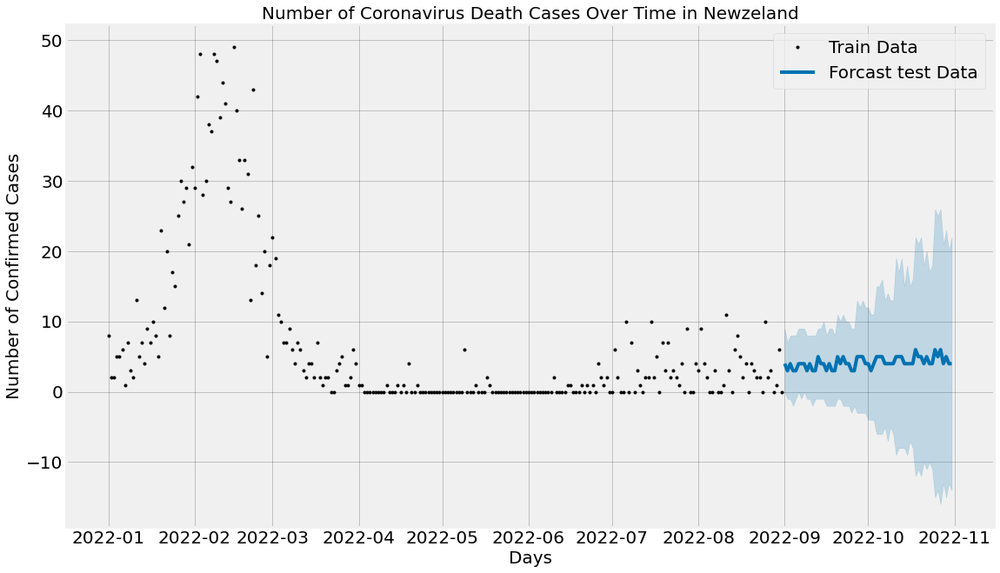

DEBUG:cmdstanpy:input tempfile: /tmp/tmpox279url/tcdeazs0.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpox279url/x01nxh2d.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=12807', 'data', 'file=/tmp/tmpox279url/tcdeazs0.json', 'init=/tmp/tmpox279url/x01nxh2d.json', 'output', 'file=/tmp/tmpox279url/prophet_modelnuyluccq/prophet_model-20221202054727.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
05:47:27 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
05:47:27 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


r2_score=  0.8928265132466828
mean_squared_error= 11.654605263157896
mean_absolute_error= 2.1348684210526314
Root mean_squared_error= 3.4138841900623835


<ipython-input-6-26071f48e5ba>:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  forecast[forecast['yhat'] < 0]['yhat'] = 0


<Figure size 1296x1080 with 0 Axes>

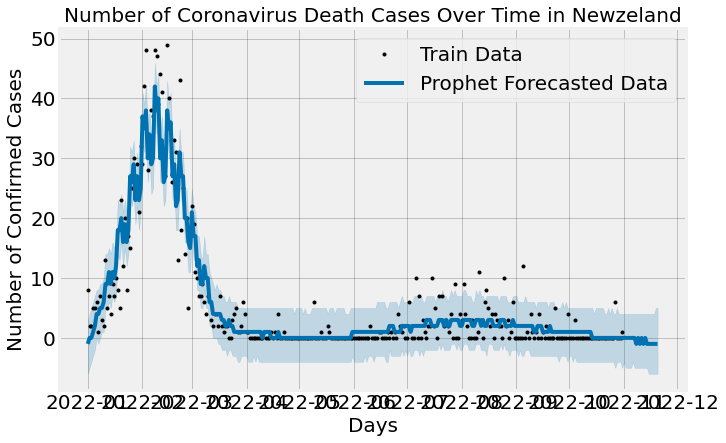

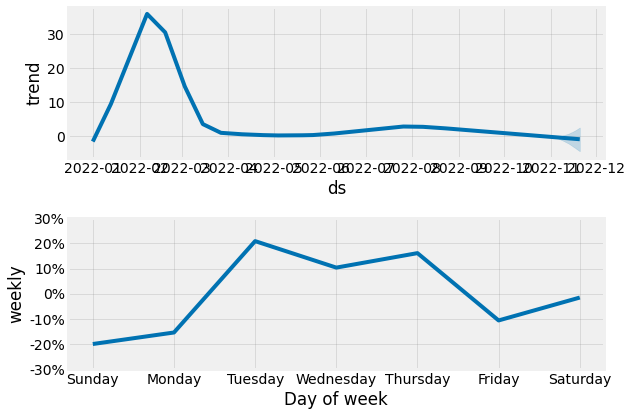

In [69]:
forecastedNewzeland=DeathForcast(dfDeathPakistan,'Number of Coronavirus Death Cases Over Time in Newzeland')

DEBUG:cmdstanpy:input tempfile: /tmp/tmpox279url/80dan_iv.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpox279url/c2ceqhw3.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=30123', 'data', 'file=/tmp/tmpox279url/80dan_iv.json', 'init=/tmp/tmpox279url/c2ceqhw3.json', 'output', 'file=/tmp/tmpox279url/prophet_modelbs6ikio_/prophet_model-20221202054728.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
05:47:28 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
05:47:28 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
<ipython-input-7-4670115c8529>:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata

r2_score=  0.7701426973373351
mean_squared_error= 78.65789473684211
mean_absolute_error= 3.625
Root mean_squared_error= 8.868928612681586


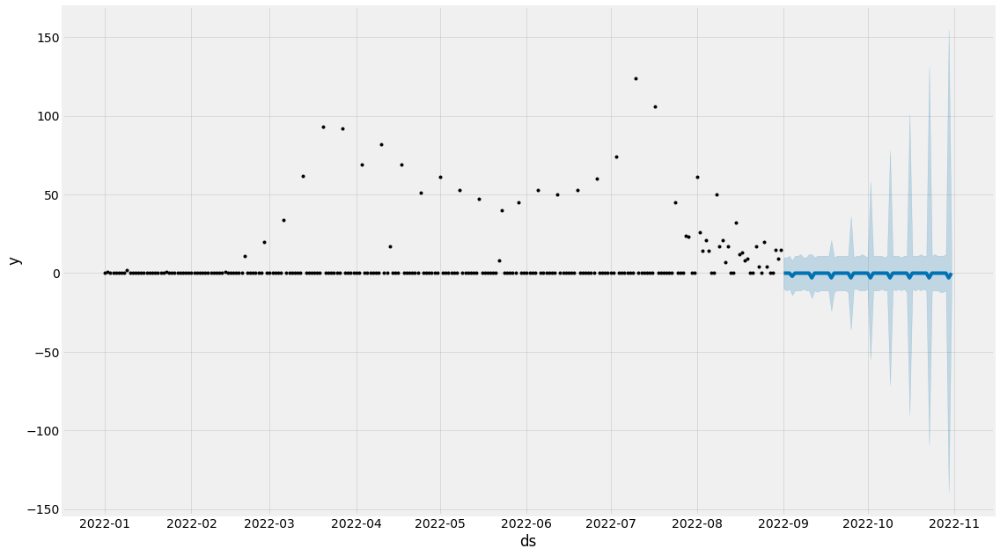

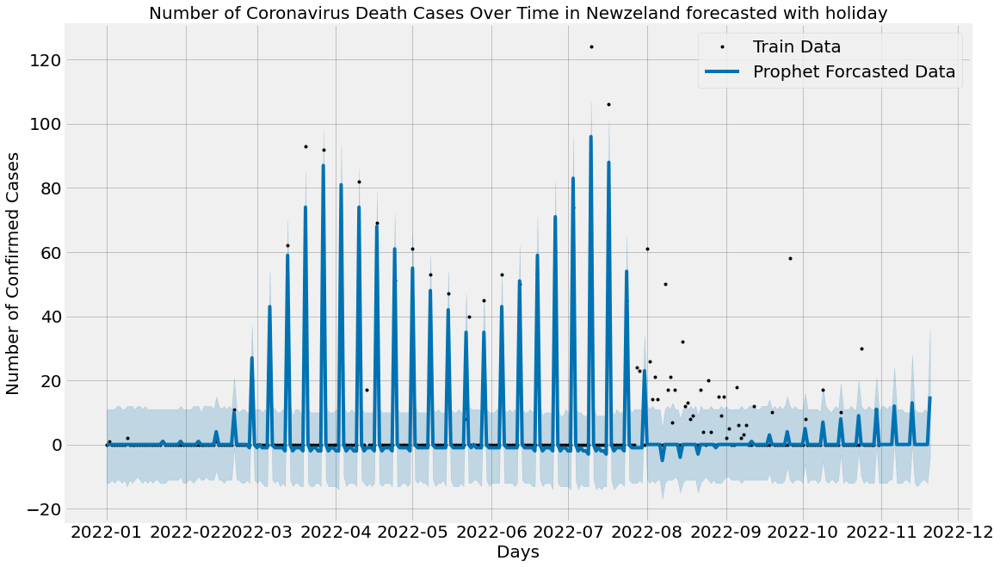

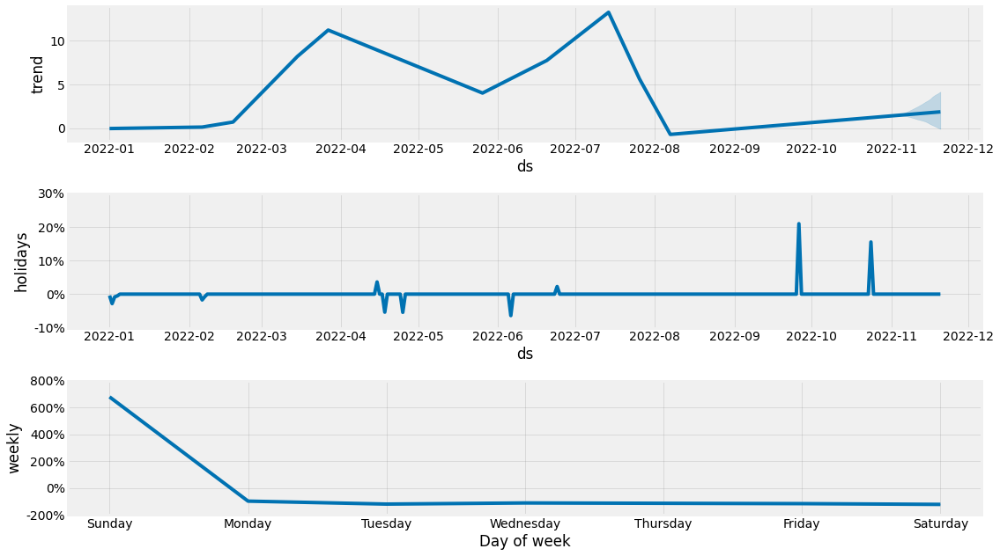

In [70]:
forecastedNewzeland_holiday=DeathForcast_holidays(dfDeathNewzeland,'Number of Coronavirus Death Cases Over Time in Newzeland forecasted with holiday','NZ','NZ')

In [71]:
f=forecastedNewzeland[304:]
f =f [['ds','yhat', 'yhat_lower',  'yhat_upper']]

f.rename(columns = {'ds':'Date','yhat':'Confirm', 'yhat_lower':'Confirm_Lower', 'yhat_upper':'Confirm_Upper'}, inplace = True)
f

,Date,Confirm,Confirm_Lower,Confirm_Upper
304,2022-11-01,0,-4,4
305,2022-11-02,0,-5,4
306,2022-11-03,0,-5,4
307,2022-11-04,0,-5,4
308,2022-11-05,0,-5,4
309,2022-11-06,0,-4,4
310,2022-11-07,0,-5,4
311,2022-11-08,1,-5,4
312,2022-11-09,0,-5,4
313,2022-11-10,1,-5,4


In [72]:
f=forecastedNewzeland_holiday[304:]
f =f [['ds','yhat', 'yhat_lower',  'yhat_upper']]

f.rename(columns = {'ds':'Date','yhat':'Confirm', 'yhat_lower':'Confirm_Lower', 'yhat_upper':'Confirm_Upper'}, inplace = True)
f

,Date,Confirm,Confirm_Lower,Confirm_Upper
304,2022-11-01,0,-12,12
305,2022-11-02,0,-12,12
306,2022-11-03,0,-12,11
307,2022-11-04,0,-11,12
308,2022-11-05,0,-11,12
309,2022-11-06,12,1,24
310,2022-11-07,0,-12,11
311,2022-11-08,0,-12,11
312,2022-11-09,0,-12,11
313,2022-11-10,0,-11,10
